# Prototyping of cleaning & Attempt to do reweighting with (eta, pt) bins
## Samples used: TTToSemileptonic and QCD (HT split)

couple of imports, but not all of them were used (useful for scaling / next steps)

In [1]:
import torch
#import torch.nn as nn
#from torch.utils.data import TensorDataset, ConcatDataset

In [2]:
import numpy as np

In [3]:
categories = ['b', 'bb', 'c', 'udsg']
labels = [0, 1, 2, 3]

In [4]:
default = 0.001

In [5]:
import sys
import os
import uproot4 as uproot
import numpy as np
import awkward1 as ak

import gc

import torch
import torch.nn as nn

from sklearn import metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import time

print("Torch version =",torch.__version__)

Torch version = 1.4.0


In [6]:
import matplotlib.pyplot as plt
import mplhep as hep

import json

plt.style.use(hep.cms.style.ROOT)

In [7]:
from matplotlib.colors import LogNorm

In [8]:
from scipy.stats import binned_statistic_2d

to plot the correct variable names

In [9]:
display_names = ['Jet $\eta$',
                'Jet $p_T$',
                'Flight Distance 2D Sig','Flight Distance 2D Val','Flight Distance 3D Sig', 'Flight Distance 3D Val',
                'Track Decay Len Val [0]','Track Decay Len Val [1]','Track Decay Len Val [2]','Track Decay Len Val [3]','Track Decay Len Val [4]','Track Decay Len Val [5]',
                'Track $\Delta R$ [0]','Track $\Delta R$ [1]','Track $\Delta R$ [2]','Track $\Delta R$ [3]','Track $\Delta R$ [4]','Track $\Delta R$ [5]',
                'Track $\eta_{rel}$ [0]','Track $\eta_{rel}$ [1]','Track $\eta_{rel}$ [2]','Track $\eta_{rel}$ [3]',
                'Track Jet Dist Val [0]','Track Jet Dist Val [1]','Track Jet Dist Val [2]','Track Jet Dist Val [3]','Track Jet Dist Val [4]','Track Jet Dist Val [5]',
                'Track Jet $p_T$',
                'Track $p_T$ Ratio [0]','Track $p_T$ Ratio [1]','Track $p_T$ Ratio [2]','Track $p_T$ Ratio [3]','Track $p_T$ Ratio [4]','Track $p_T$ Ratio [5]',
                'Track $p_{T,rel}$ [0]','Track $p_{T,rel}$ [1]','Track $p_{T,rel}$ [2]','Track $p_{T,rel}$ [3]','Track $p_{T,rel}$ [4]','Track $p_{T,rel}$ [5]',
                'Track SIP 2D Sig Above Charm',
                'Track SIP 2D Sig [0]','Track SIP 2D Sig [1]','Track SIP 2D Sig [2]','Track SIP 2D Sig [3]','Track SIP 2D Sig [4]','Track SIP 2D Sig [5]',
                'Track SIP 2D Val Above Charm',
                'Track SIP 3D Sig Above Charm',
                'Track SIP 3D Sig [0]','Track SIP 3D Sig [1]','Track SIP 3D Sig [2]','Track SIP 3D Sig [3]','Track SIP 3D Sig [4]','Track SIP 3D Sig [5]',
                'Track SIP 3D Val Above Charm',
                'Track Sum Jet $\Delta R$','Track Sum Jet $E_T$ Ratio',
                'Vertex Category','Vertex Energy Ratio','Vertex Jet $\Delta R$','Vertex Mass',
                'Jet N Secondary Vertices','Jet N Selected Tracks','Jet N Tracks $\eta_{rel}$','Vertex N Tracks']

In [10]:
display_names.index('Track Sum Jet $\Delta R$')

57

newest cleaning strategy that sets defaults close to minima and where |eta| <= 2.5, 20 GeV <= pt <= 1 TeV

### note
the final code for cleaning is split up into clean.py and additional_cleaning.py

In [40]:
minima = np.load('/home/um106329/aisafety/april_21/from_Nik/default_value_studies_minima.npy')
default = 0.001
#defaults_per_variable = minima - 0.001
defaults_per_variable = minima - default

def cleandataset(f, defaults_per_variable, isMC):
    #print('Doing cleaning, isMC = ',isMC)
    feature_names = [k for k in f['Events'].keys() if  (('Jet_eta' == k) or ('Jet_pt' == k) or ('Jet_DeepCSV' in k))]
    # tagger output to compare with later and variables used to get the truth output
    feature_names.extend(('Jet_btagDeepB_b','Jet_btagDeepB_bb', 'Jet_btagDeepC','Jet_btagDeepL'))
    if isMC == True:
        feature_names.extend(('Jet_nBHadrons', 'Jet_hadronFlavour'))
    #print(feature_names)
    #print(len(feature_names))
    
    # go through a specified number of events, and get the information (awkward-arrays) for the keys specified above
    for data in f['Events'].iterate(feature_names, step_size=f['Events'].num_entries, library='ak'):
        break
        
    
    # creating an array to store all the columns with their entries per jet, flatten per-event -> per-jet
    datacolumns = np.zeros((len(feature_names)+1, len(ak.flatten(data['Jet_pt'], axis=1))))
    #print(len(datacolumns))

    for featureindex in range(len(feature_names)):
        a = ak.flatten(data[feature_names[featureindex]], axis=1) # flatten along first inside to get jets
        
        datacolumns[featureindex] = ak.to_numpy(a)

    if isMC == True:
        nbhad = ak.to_numpy(ak.flatten(data['Jet_nBHadrons'], axis=1))
        hadflav = ak.to_numpy(ak.flatten(data['Jet_hadronFlavour'], axis=1))

        target_class = np.full_like(hadflav, 3)                                                      # udsg
        target_class = np.where(hadflav == 4, 2, target_class)                                       # c
        target_class = np.where(np.bitwise_and(hadflav == 5, nbhad > 1), 1, target_class)            # bb
        target_class = np.where(np.bitwise_and(hadflav == 5, nbhad <= 1), 0, target_class)           # b, lepb

        #print(np.unique(target_class))

        #datacolumns[len(feature_names)] = ak.to_numpy(target_class)
        datacolumns[len(feature_names)] = target_class
        #print(np.unique(datacolumns[len(feature_names)]))
        
    datavectors = datacolumns.transpose()
    #print(np.unique(datavectors[:,len(feature_names)]))
    
    #print(i)
    for j in range(67):
        datavectors[:, j][datavectors[:, j] == np.nan]  = defaults_per_variable[j]
        datavectors[:, j][datavectors[:, j] <= -np.inf] = defaults_per_variable[j]
        datavectors[:, j][datavectors[:, j] >= np.inf]  = defaults_per_variable[j]
        datavectors[:, j][datavectors[:, j] == -999]  = defaults_per_variable[j]  # this one line is new and the reason for that is that there can be "original" -999 defaults in the inputs that should now also move into the new
                                                               # default bin, it was not necessary in my old clean_1_2.py code, because I could just leave them where they are, here they need to to be modified
        #print(np.unique(datavectors[:,-1]))
    #print(np.unique(datavectors[:,-1]))
    datavecak = ak.from_numpy(datavectors)
    #print(ak.unique(datavecak[:,-1]))
    #print(len(datavecak),"entries before cleaning step 1")
    
    
    # tracker acceptance and pt range
    datavecak = datavecak[datavecak[:, 0] >= -2.5]
    datavecak = datavecak[datavecak[:, 0] <= 2.5]
    datavecak = datavecak[datavecak[:, 1] >= 20.]
    datavecak = datavecak[datavecak[:, 1] <= 1000.]
    #datavecak = datavecak[datavecak[:, 67] >= 0.]
    #datavecak = datavecak[datavecak[:, 67] <= 1.]
    #datavecak = datavecak[datavecak[:, 68] >= 0.]
    #datavecak = datavecak[datavecak[:, 68] <= 1.]
    #datavecak = datavecak[datavecak[:, 69] >= 0.]
    #datavecak = datavecak[datavecak[:, 69] <= 1.]
    #datavecak = datavecak[datavecak[:, 70] >= 0.]
    #datavecak = datavecak[datavecak[:, 70] <= 1.]

    

    # check jetNSelectedTracks, jetNSecondaryVertices > 0
    #datavecak = datavecak[(datavecak[:, 63] > 0) | (datavecak[:, 64] > 0)]  # keep those where at least any of the two variables is > 0, they don't need to be > 0 simultaneously
    #print(len(datavecak),"entries after cleaning step 1")

    alldata = ak.to_numpy(datavecak)
    #print(np.unique(alldata[:,-1]))
        
    
    for track0_vars in [6,12,22,29,35,42,50]:
        alldata[:,track0_vars][alldata[:,64] <= 0] = defaults_per_variable[track0_vars]
    for track0_1_vars in [7,13,23,30,36,43,51]:
        alldata[:,track0_1_vars][alldata[:,64] <= 1] = defaults_per_variable[track0_1_vars]
    for track01_2_vars in [8,14,24,31,37,44,52]:
        alldata[:,track01_2_vars][alldata[:,64] <= 2] = defaults_per_variable[track01_2_vars]
    for track012_3_vars in [9,15,25,32,38,45,53]:
        alldata[:,track012_3_vars][alldata[:,64] <= 3] = defaults_per_variable[track012_3_vars]
    for track0123_4_vars in [10,16,26,33,39,46,54]:
        alldata[:,track0123_4_vars][alldata[:,64] <= 4] = defaults_per_variable[track0123_4_vars]
    for track01234_5_vars in [11,17,27,34,40,47,55]:
        alldata[:,track01234_5_vars][alldata[:,64] <= 5] = defaults_per_variable[track01234_5_vars]
    alldata[:,18][alldata[:,65] <= 0] = defaults_per_variable[18]
    alldata[:,19][alldata[:,65] <= 1] = defaults_per_variable[19]
    alldata[:,20][alldata[:,65] <= 2] = defaults_per_variable[20]
    alldata[:,21][alldata[:,65] <= 3] = defaults_per_variable[21]

    for AboveCharm_vars in [41,48,49,56]:
        alldata[:,AboveCharm_vars][alldata[:,AboveCharm_vars]==-1] = defaults_per_variable[AboveCharm_vars] 
    
    
    datacls = [i for i in range(0,67)]
    if isMC == True:
        datacls.append(73)
    dataset = alldata[:, datacls]
    #print(np.unique(dataset[:,-1]))
    
    #DeepCSV_dataset = alldata[:, 67:71]
    
    return dataset

def preprocess(rootfile, isMC):
    print('Doing starting clean/prep, isMC: ',isMC)
    minima = np.load('/home/um106329/aisafety/april_21/from_Nik/default_value_studies_minima.npy')
    defaults_per_variable = minima - 0.001
    dataset_input_target = cleandataset(uproot.open(rootfile), defaults_per_variable, isMC)
    print(len(dataset_input_target))
    #print(np.unique(dataset_input_target[:,-1]))
    #sys.exit()
    inputs = torch.Tensor(dataset_input_target[:,0:67])
    # targets only make sense for MC, but it does no harm when calling it on Data (the last column is different though)
    targets = torch.Tensor(dataset_input_target[:,-1]).long()
    #print(torch.unique(targets))        
    scalers = []
    
    for i in range(0,67): # do not apply scaling to default values, which were set to -999
        scaler = StandardScaler().fit(inputs[:,i][inputs[:,i]!=defaults_per_variable[i]].reshape(-1,1))
        inputs[:,i]   = torch.Tensor(scaler.transform(inputs[:,i].reshape(-1,1)).reshape(1,-1))
        scalers.append(scaler)

    return inputs, targets, scalers

wanted to know how the first file that helped find the bug during cleaning looks like

In [7]:
dypath = 'root://grid-cms-xrootd.physik.rwth-aachen.de:1094//store/user/anovak/PFNano/106X_v2_17rsb3/DYJetsToLL_M-50_TuneCP5_13TeV-madgraphMLM-pythia8/RunIIFall17PFNanov2-PU2017RECOSIMstep_12Apr2018_94X_mc2017_realistic_v14_ext1-v1/210509_154511/0000/nano_mc2017_26.root'

In [9]:
inputs, targets, scalers = preprocess(dypath, True)

Doing starting clean/prep, isMC:  True
Doing cleaning, isMC =  True
1403677


In [55]:
dyinputs_and_targets_clean = cleandataset(uproot.open(dypath), defaults_per_variable, True)

plots for eta and pt, split by flavour (mostly log-scale, and then once raw as well as normalized)

Text(0.5, 1.0, '$\\eta$, split by flavour')

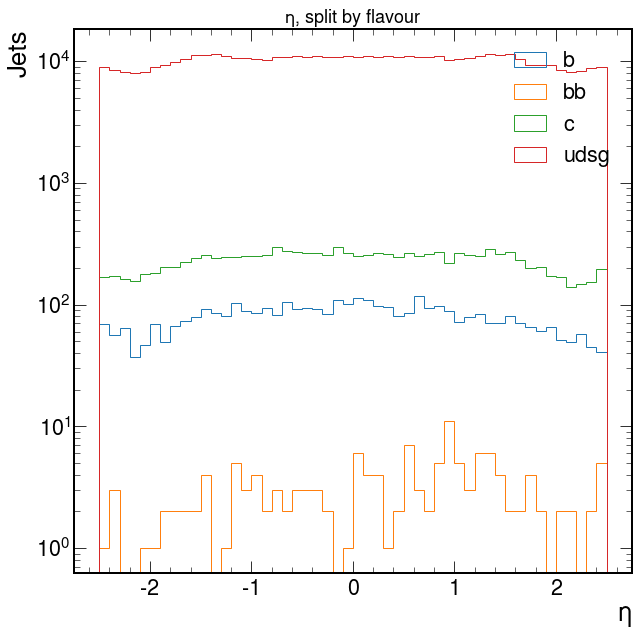

In [36]:
plt.hist(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==0],bins=50,range=(-2.5,2.5),histtype='step',log=True,label='b')
plt.hist(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==1],bins=50,range=(-2.5,2.5),histtype='step',log=True,label='bb')
plt.hist(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==2],bins=50,range=(-2.5,2.5),histtype='step',log=True,label='c')
plt.hist(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==3],bins=50,range=(-2.5,2.5),histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$\eta$')
plt.title(r'$\eta$, split by flavour',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour')

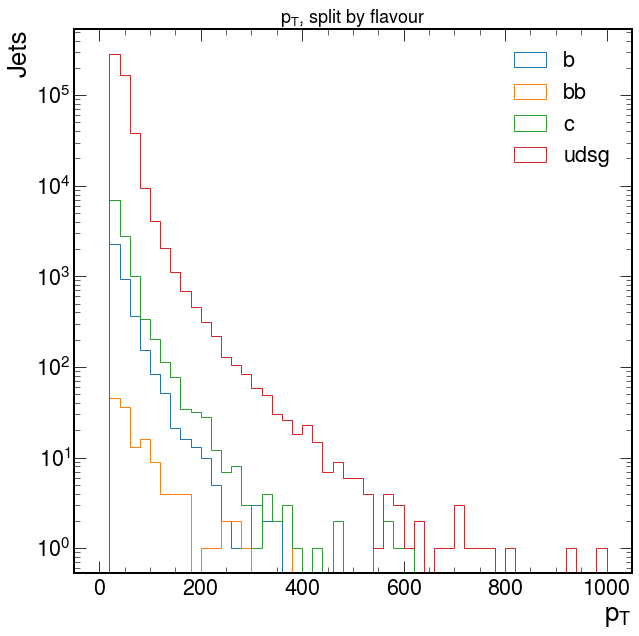

In [35]:
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000),histtype='step',log=True,label='b')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000),histtype='step',log=True,label='bb')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000),histtype='step',log=True,label='c')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000),histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour, normalized')

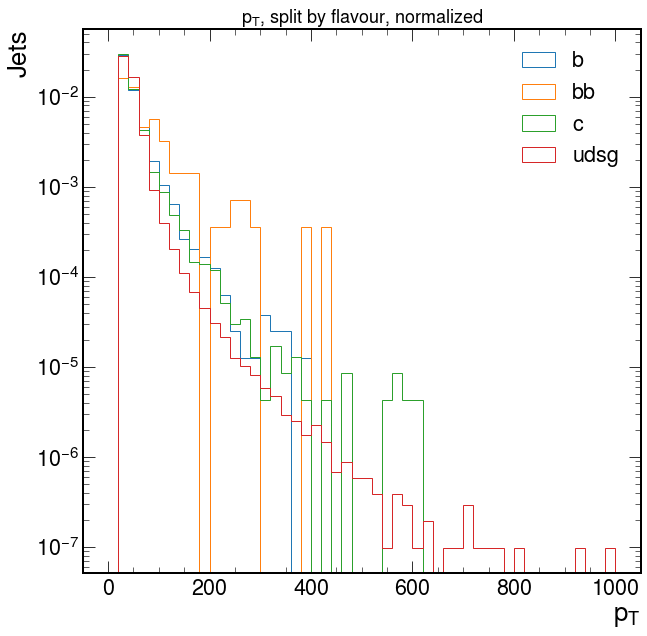

In [38]:
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000),histtype='step',log=True,density=True,label='b')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000),histtype='step',log=True,density=True,label='bb')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000),histtype='step',log=True,density=True,label='c')
plt.hist(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000),histtype='step',log=True,density=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour, normalized',fontsize=18)

now a bit more systematic, for a couple of TTToSemileptonic samples (100 out of 2446)

In [50]:
TTinputs_and_targets_clean = cleandataset(uproot.open('root://grid-cms-xrootd.physik.rwth-aachen.de:1094//store/user/anovak/PFNano/106X_v2_17/TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8/RunIIFall17PFNanoAODv2-PU2017_12Apr2018_new_pmx_94X_mc2017_realistic_v14-v1PFNanoV2/210101_174326/0001/nano_mc2017_1-1156.root'), defaults_per_variable, True)

Doing cleaning, isMC =  True


In [51]:
tt_hist_pt_b, pt_edges = np.histogram(TTinputs_and_targets_clean[:,1][TTinputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000))
tt_hist_pt_bb, pt_edges = np.histogram(TTinputs_and_targets_clean[:,1][TTinputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000))
tt_hist_pt_c, pt_edges = np.histogram(TTinputs_and_targets_clean[:,1][TTinputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000))
tt_hist_pt_l, pt_edges = np.histogram(TTinputs_and_targets_clean[:,1][TTinputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000))

In [52]:
tt_hist_eta_b, eta_edges = np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==0],bins=50,range=(-2.5,2.5))
tt_hist_eta_bb, eta_edges = np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==1],bins=50,range=(-2.5,2.5))
tt_hist_eta_c, eta_edges = np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==2],bins=50,range=(-2.5,2.5))
tt_hist_eta_l, eta_edges = np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==3],bins=50,range=(-2.5,2.5))

In [53]:
with open('TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8.txt', 'r') as infile:
    paths = infile.read().splitlines()
    for path in paths[1:100]:
        inputs_and_targets_clean = cleandataset(uproot.open(path), defaults_per_variable, True)
        tt_hist_pt_b += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000))[0]
        tt_hist_pt_bb += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000))[0]
        tt_hist_pt_c += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000))[0]
        tt_hist_pt_l += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000))[0]
        tt_hist_eta_b += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==0],bins=50,range=(-2.5,2.5))[0]
        tt_hist_eta_bb += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==1],bins=50,range=(-2.5,2.5))[0]
        tt_hist_eta_c += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==2],bins=50,range=(-2.5,2.5))[0]
        tt_hist_eta_l += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==3],bins=50,range=(-2.5,2.5))[0]

Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning, isMC =  True
Doing cleaning

Text(0.5, 1.0, '$\\eta$, split by flavour, TTToSemileptonic with 5980674 jets after cleaning')

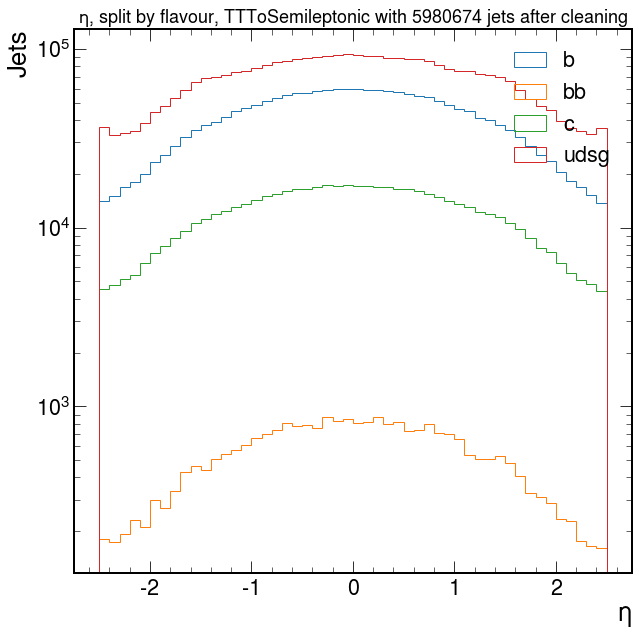

In [67]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_b ,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_bb,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_c ,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_l ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$\eta$')
plt.title(r'$\eta$, split by flavour, TTToSemileptonic with '+f'{sum(tt_hist_pt_b)+sum(tt_hist_pt_bb)+sum(tt_hist_pt_c)+sum(tt_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$\\eta$, split by flavour, normalized, TTToSemileptonic with 5980674 jets after cleaning')

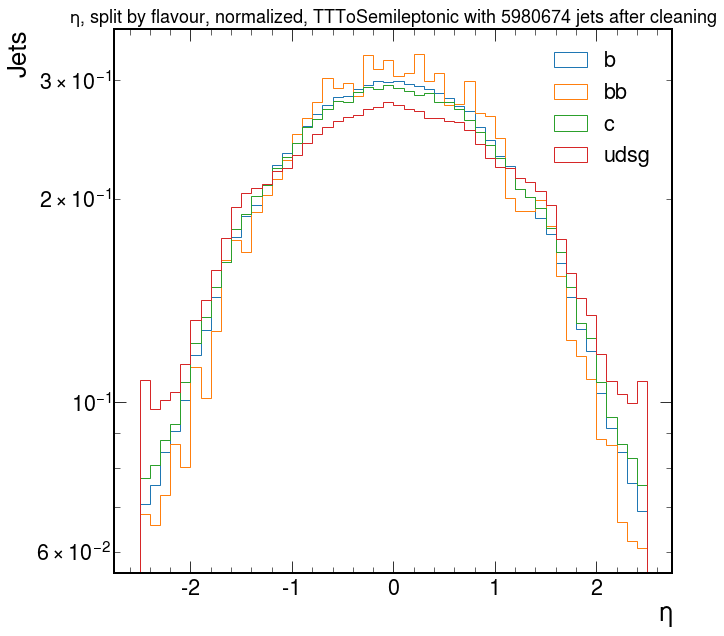

In [68]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_b ,histtype='step',log=True,density=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_bb,histtype='step',log=True,density=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_c ,histtype='step',log=True,density=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=tt_hist_eta_l ,histtype='step',log=True,density=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$\eta$')
plt.title(r'$\eta$, split by flavour, normalized, TTToSemileptonic with '+f'{sum(tt_hist_pt_b)+sum(tt_hist_pt_bb)+sum(tt_hist_pt_c)+sum(tt_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour, TTToSemileptonic with 5980674 jets after cleaning')

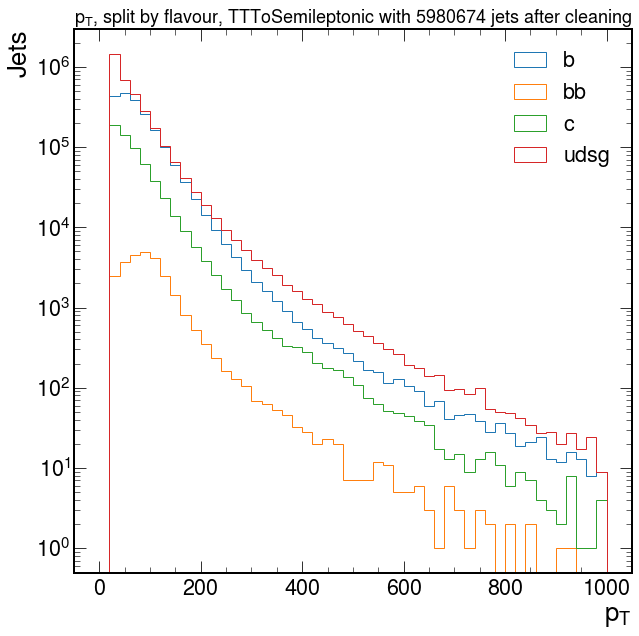

In [69]:
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_b ,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_bb,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_c ,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_l ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour, TTToSemileptonic with '+f'{sum(tt_hist_pt_b)+sum(tt_hist_pt_bb)+sum(tt_hist_pt_c)+sum(tt_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour, normalized, TTToSemileptonic with 5980674 jets after cleaning')

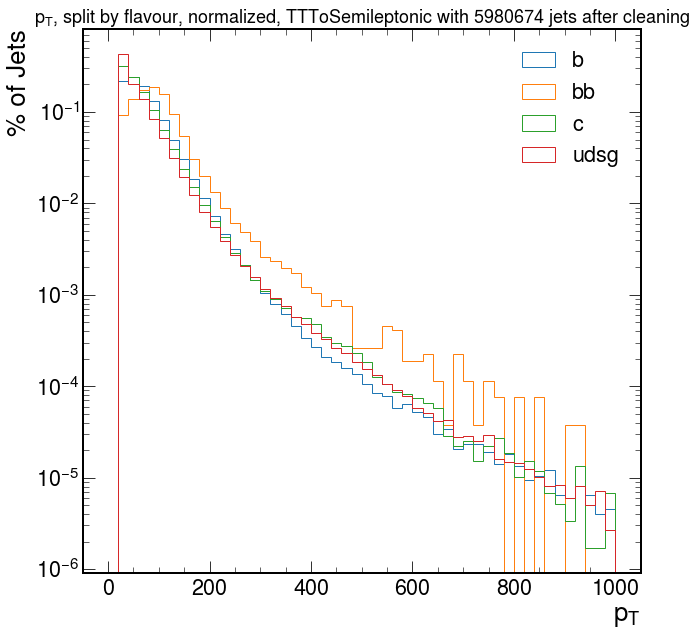

In [366]:
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_b/sum(tt_hist_pt_b) ,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_bb/sum(tt_hist_pt_bb),histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_c/sum(tt_hist_pt_c) ,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=tt_hist_pt_l/sum(tt_hist_pt_l) ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('% of Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour, normalized, TTToSemileptonic with '+f'{sum(tt_hist_pt_b)+sum(tt_hist_pt_bb)+sum(tt_hist_pt_c)+sum(tt_hist_pt_l)} jets after cleaning',fontsize=18)

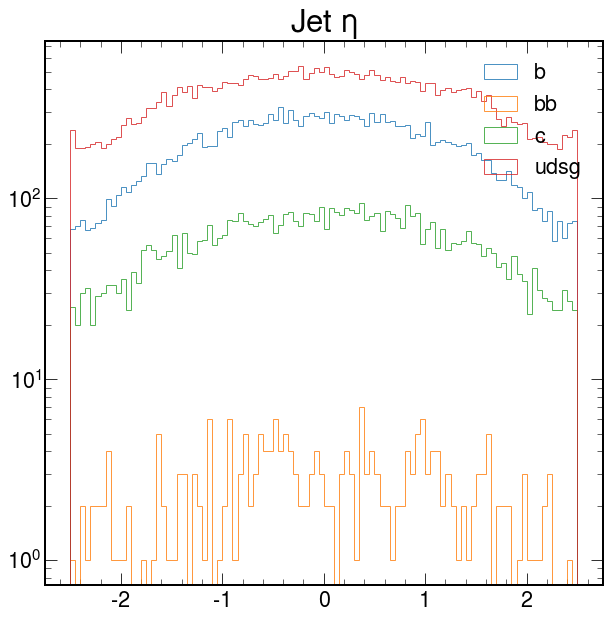

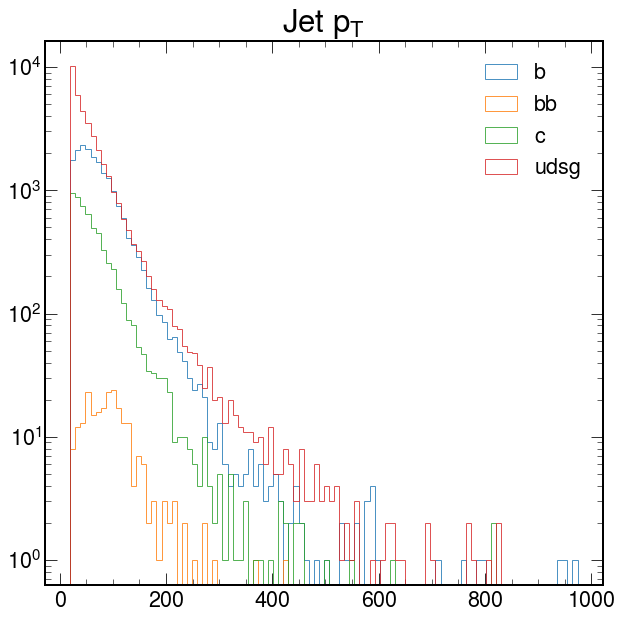

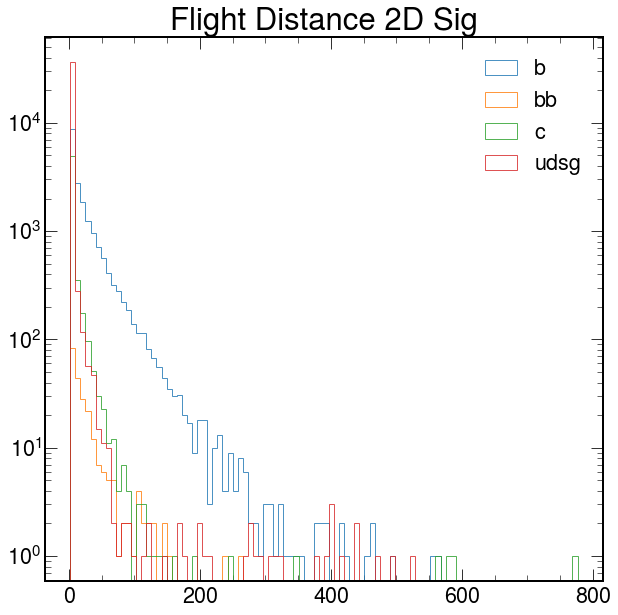

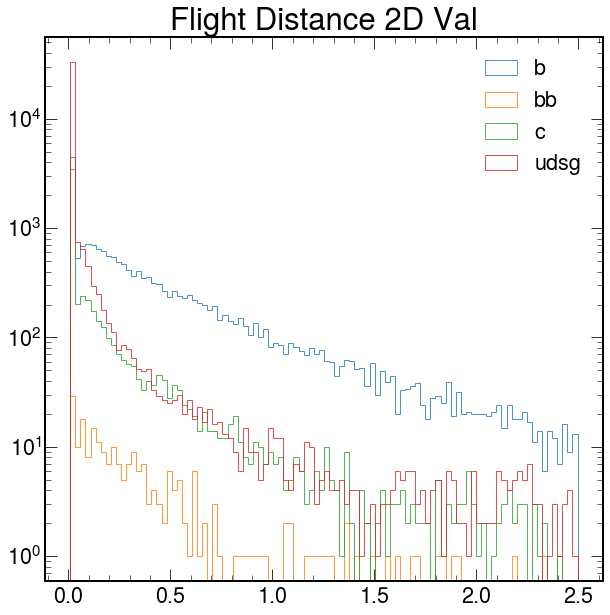

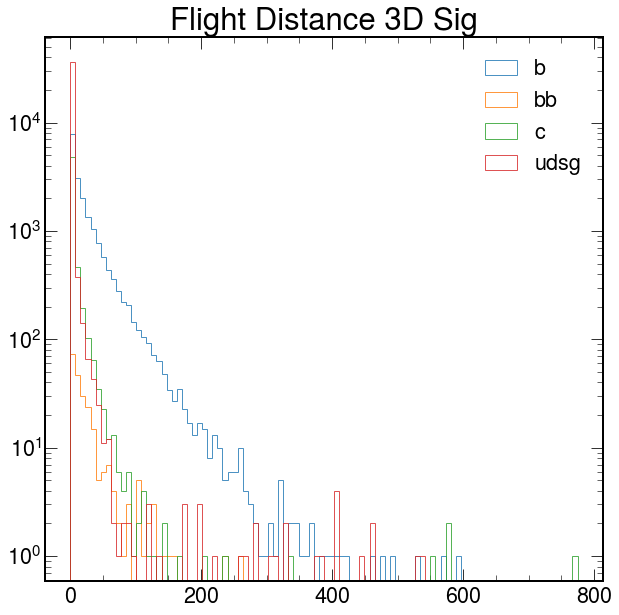

...

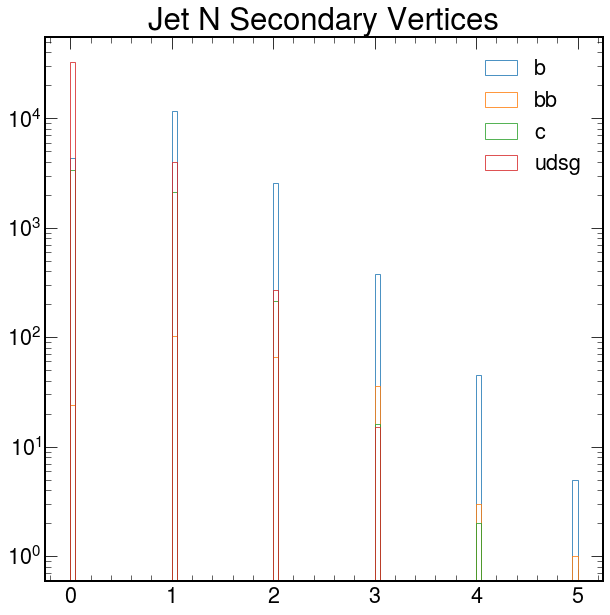

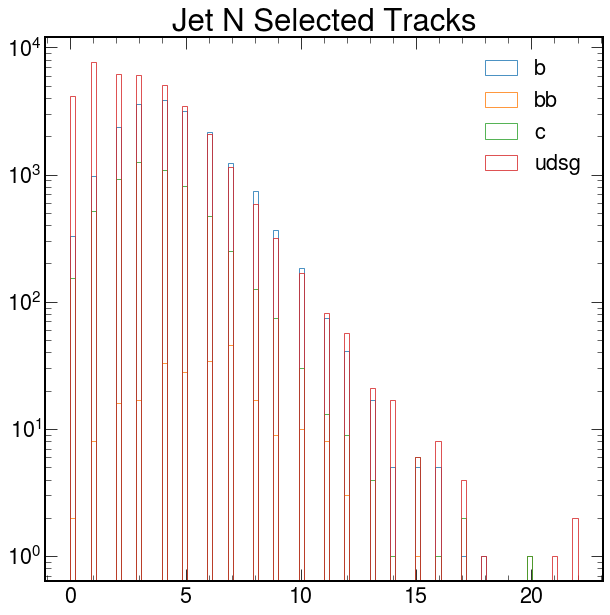

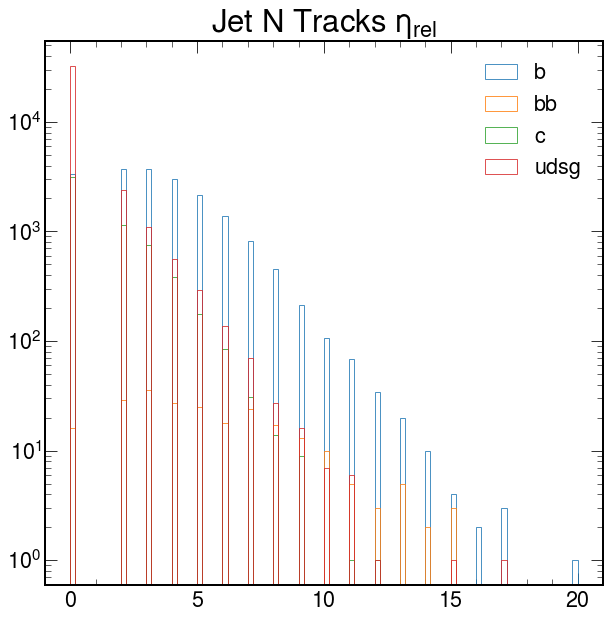

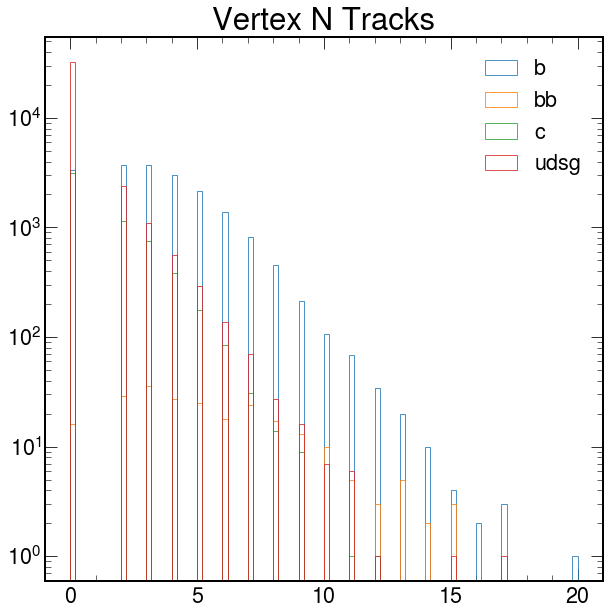

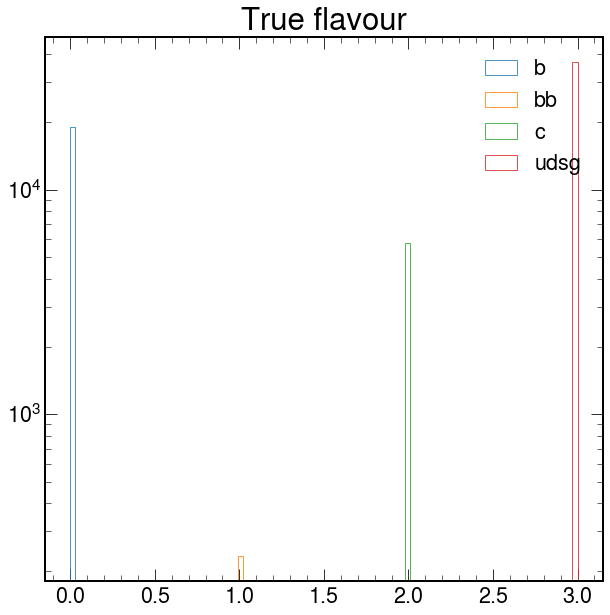

In [302]:
for i in range(len(TTinputs_and_targets_clean[0])):
    for f in range(4):
        plt.hist(TTinputs_and_targets_clean[:,i][TTinputs_and_targets_clean[:,-1]==f],bins=100,range=(min(TTinputs_and_targets_clean[:,i]),max(TTinputs_and_targets_clean[:,i])),histtype='step',label=categorynames[f],log=True,alpha=0.8, )
    plt.title((display_names +['True flavour'])[i])
    plt.legend()
    plt.show()

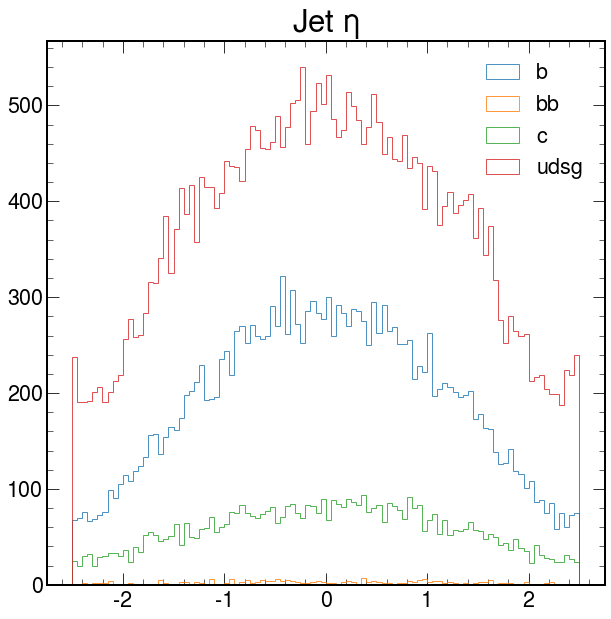

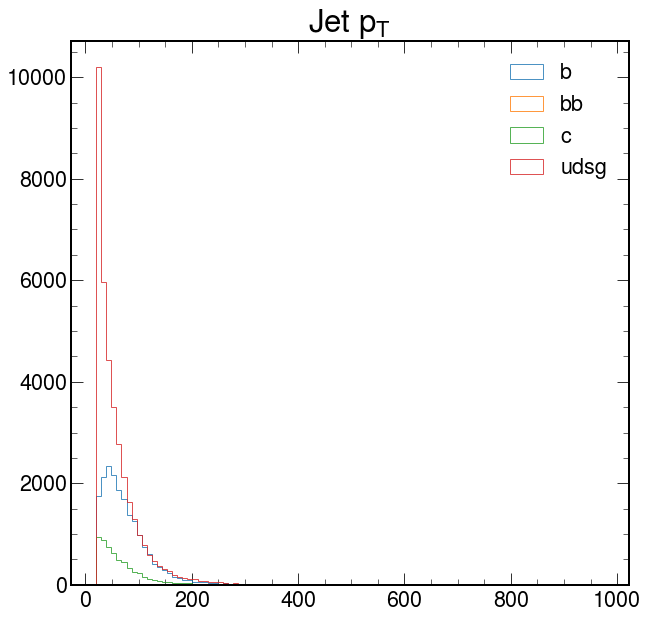

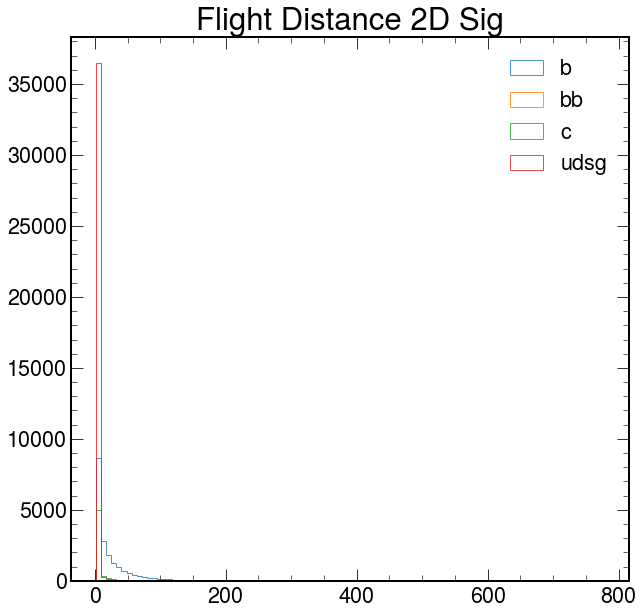

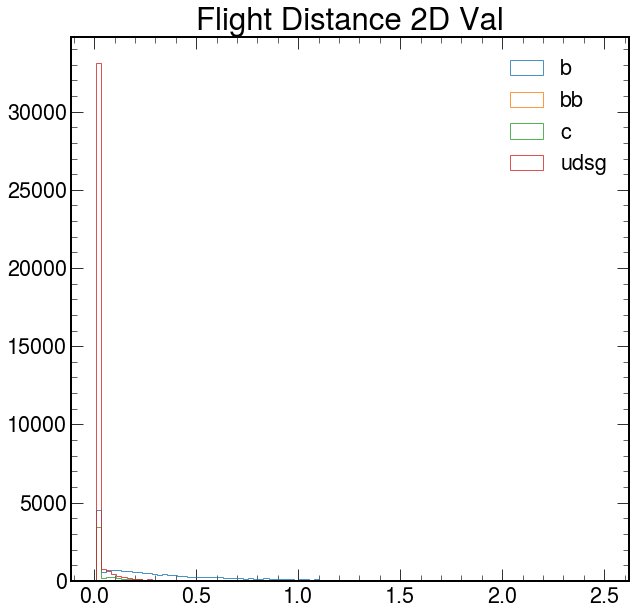

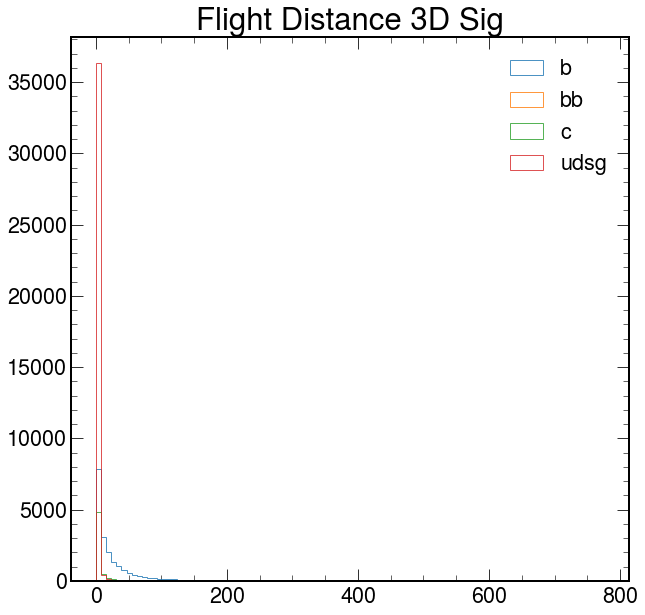

...

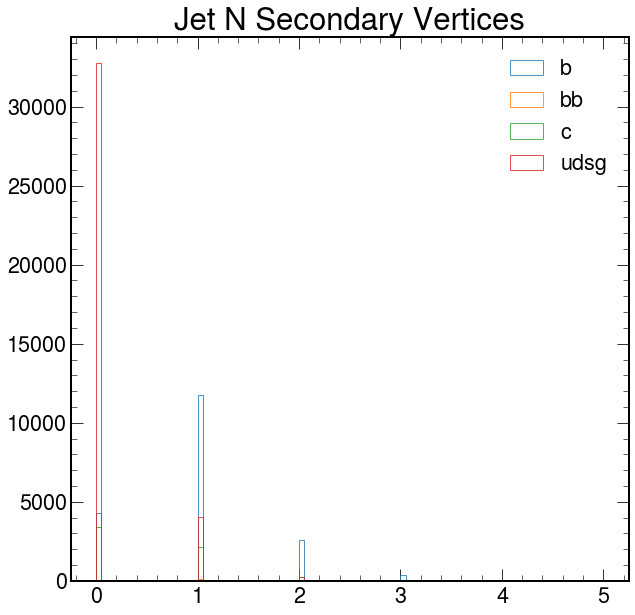

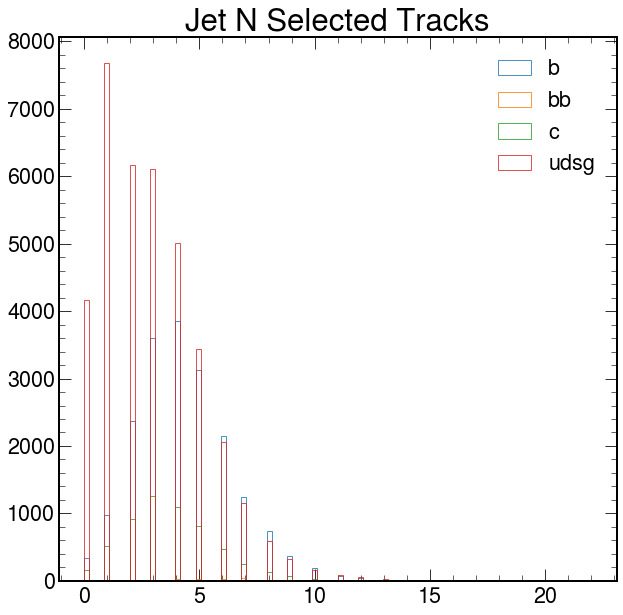

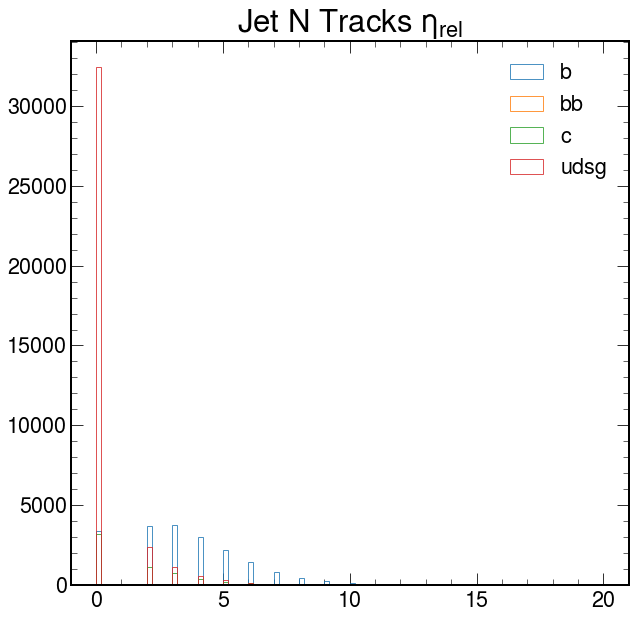

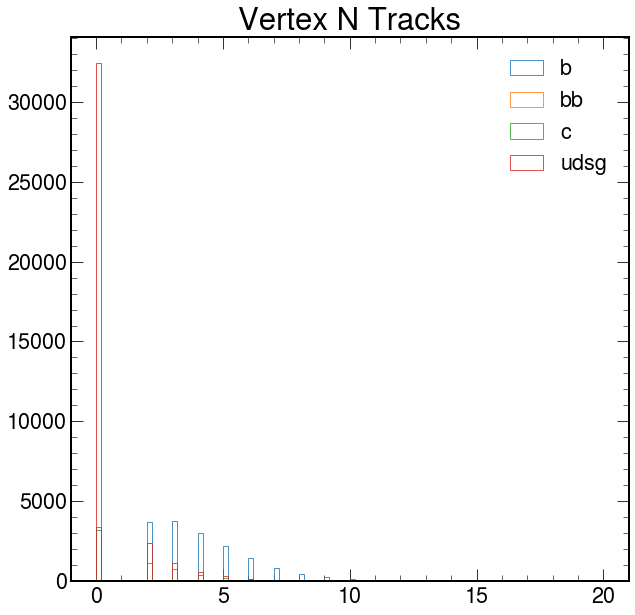

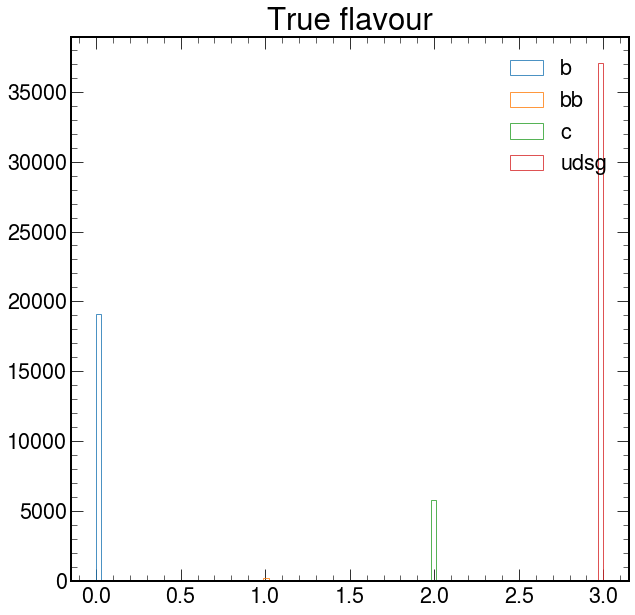

In [304]:
for i in range(len(TTinputs_and_targets_clean[0])):
    for f in range(4):
        plt.hist(TTinputs_and_targets_clean[:,i][TTinputs_and_targets_clean[:,-1]==f],bins=100,range=(min(TTinputs_and_targets_clean[:,i]),max(TTinputs_and_targets_clean[:,i])),label=categorynames[f],histtype='step',alpha=0.8, )
    plt.title((display_names +['True flavour'])[i])
    plt.legend()
    plt.show()

In [71]:
list_paths = []
with open('/home/um106329/aisafety/new_march_21/qcd_file_paths.json') as json_file:
    json_paths = json.load(json_file)
    # QCD files
    for entry in json_paths['QCD_HT300to500_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    for entry in json_paths['QCD_HT500to700_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    for entry in json_paths['QCD_HT700to1000_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    for entry in json_paths['QCD_HT1000to1500_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    for entry in json_paths['QCD_HT1500to2000_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    for entry in json_paths['QCD_HT2000toInf_TuneCP5_13TeV-madgraph-pythia8'][:2]:
        list_paths.append(entry)
    # TTtoSemileptonic files
    #for entry in json_paths['TTToSemiLeptonic_TuneCP5_13TeV-powheg-pythia8']:
    #    list_paths.append(entry)

In [72]:
QCDinputs_and_targets_clean = cleandataset(uproot.open(list_paths[0]), defaults_per_variable, True)

In [73]:
qcd_hist_pt_b, pt_edges = np.histogram(QCDinputs_and_targets_clean[:,1][QCDinputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000))
qcd_hist_pt_bb, pt_edges = np.histogram(QCDinputs_and_targets_clean[:,1][QCDinputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000))
qcd_hist_pt_c, pt_edges = np.histogram(QCDinputs_and_targets_clean[:,1][QCDinputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000))
qcd_hist_pt_l, pt_edges = np.histogram(QCDinputs_and_targets_clean[:,1][QCDinputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000))

In [74]:
qcd_hist_eta_b, eta_edges = np.histogram(QCDinputs_and_targets_clean[:,0][QCDinputs_and_targets_clean[:,-1]==0],bins=50,range=(-2.5,2.5))
qcd_hist_eta_bb, eta_edges = np.histogram(QCDinputs_and_targets_clean[:,0][QCDinputs_and_targets_clean[:,-1]==1],bins=50,range=(-2.5,2.5))
qcd_hist_eta_c, eta_edges = np.histogram(QCDinputs_and_targets_clean[:,0][QCDinputs_and_targets_clean[:,-1]==2],bins=50,range=(-2.5,2.5))
qcd_hist_eta_l, eta_edges = np.histogram(QCDinputs_and_targets_clean[:,0][QCDinputs_and_targets_clean[:,-1]==3],bins=50,range=(-2.5,2.5))

In [76]:
for path in list_paths[1:-1]:
        inputs_and_targets_clean = cleandataset(uproot.open(path), defaults_per_variable, True)
        qcd_hist_pt_b += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==0],bins=50,range=(0,1000))[0]
        qcd_hist_pt_bb += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==1],bins=50,range=(0,1000))[0]
        qcd_hist_pt_c += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==2],bins=50,range=(0,1000))[0]
        qcd_hist_pt_l += np.histogram(inputs_and_targets_clean[:,1][inputs_and_targets_clean[:,-1]==3],bins=50,range=(0,1000))[0]
        qcd_hist_eta_b += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==0],bins=50,range=(-2.5,2.5))[0]
        qcd_hist_eta_bb += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==1],bins=50,range=(-2.5,2.5))[0]
        qcd_hist_eta_c += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==2],bins=50,range=(-2.5,2.5))[0]
        qcd_hist_eta_l += np.histogram(inputs_and_targets_clean[:,0][inputs_and_targets_clean[:,-1]==3],bins=50,range=(-2.5,2.5))[0]

Text(0.5, 1.0, '$\\eta$, split by flavour, QCD with 1358598 jets after cleaning')

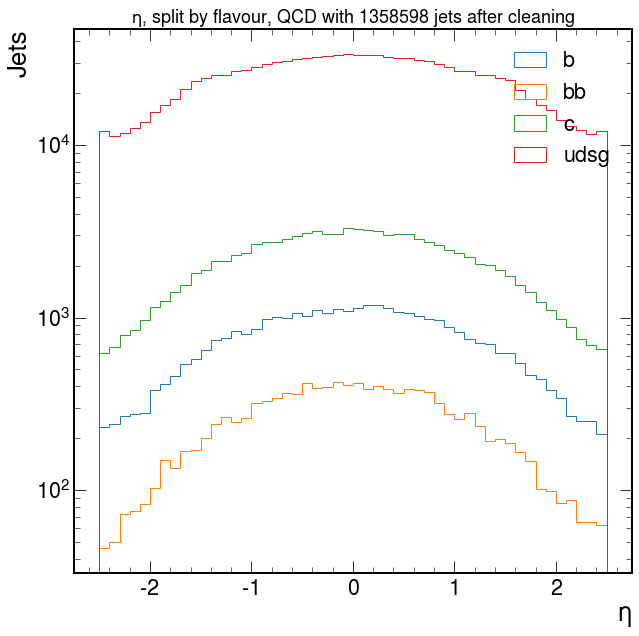

In [79]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_b ,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_bb,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_c ,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_l ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$\eta$')
plt.title(r'$\eta$, split by flavour, QCD with '+f'{sum(qcd_hist_pt_b)+sum(qcd_hist_pt_bb)+sum(qcd_hist_pt_c)+sum(qcd_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$\\eta$, split by flavour, normalized, QCD with 1358598 jets after cleaning')

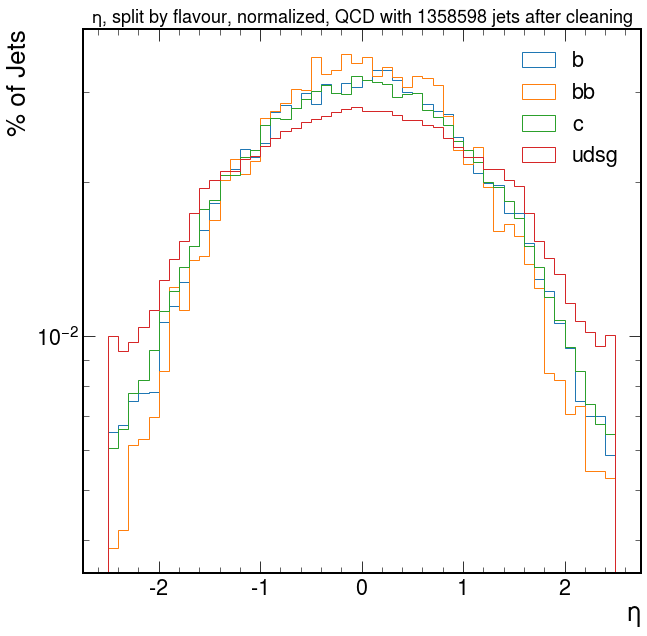

In [364]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_b/sum(qcd_hist_eta_b) ,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_bb/sum(qcd_hist_eta_bb),histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_c/sum(qcd_hist_eta_c) ,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=qcd_hist_eta_l/sum(qcd_hist_eta_l) ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('% of Jets')
plt.xlabel(r'$\eta$')
plt.title(r'$\eta$, split by flavour, normalized, QCD with '+f'{sum(qcd_hist_pt_b)+sum(qcd_hist_pt_bb)+sum(qcd_hist_pt_c)+sum(qcd_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour, QCD with 1358598 jets after cleaning')

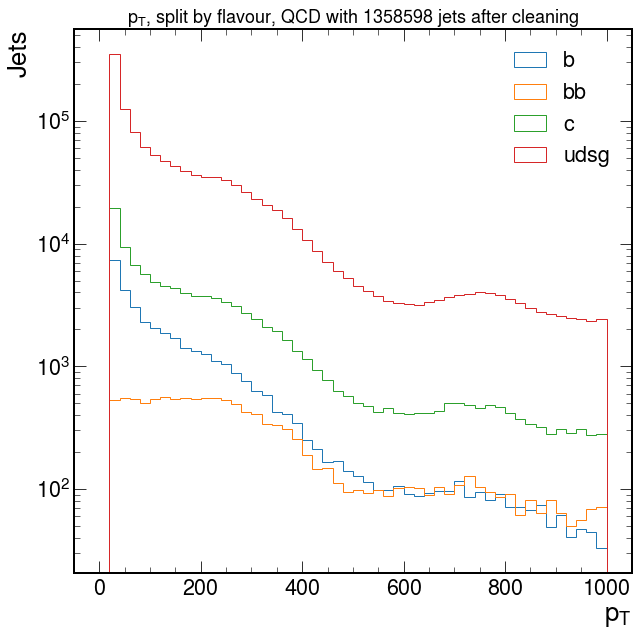

In [83]:
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_b ,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_bb,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_c ,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_l ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour, QCD with '+f'{sum(qcd_hist_pt_b)+sum(qcd_hist_pt_bb)+sum(qcd_hist_pt_c)+sum(qcd_hist_pt_l)} jets after cleaning',fontsize=18)

Text(0.5, 1.0, '$p_T$, split by flavour, normalized, QCD with 1358598 jets after cleaning')

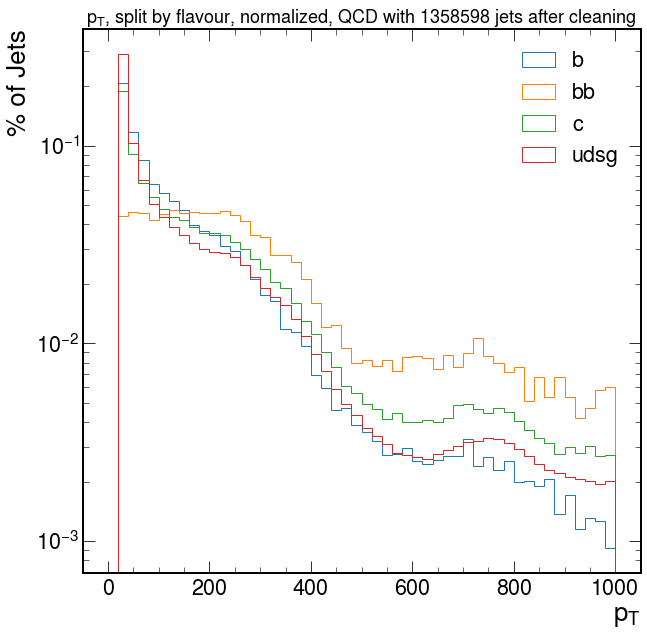

In [365]:
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_b/sum(qcd_hist_pt_b) ,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_bb/sum(qcd_hist_pt_bb),histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_c/sum(qcd_hist_pt_c) ,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(0,1000),weights=qcd_hist_pt_l/sum(qcd_hist_pt_l) ,histtype='step',log=True,label='udsg')
plt.legend()
plt.ylabel('% of Jets')
plt.xlabel(r'$p_T$')
plt.title(r'$p_T$, split by flavour, normalized, QCD with '+f'{sum(qcd_hist_pt_b)+sum(qcd_hist_pt_bb)+sum(qcd_hist_pt_c)+sum(qcd_hist_pt_l)} jets after cleaning',fontsize=18)

In [95]:
categorynames = ['b','bb','c','udsg']

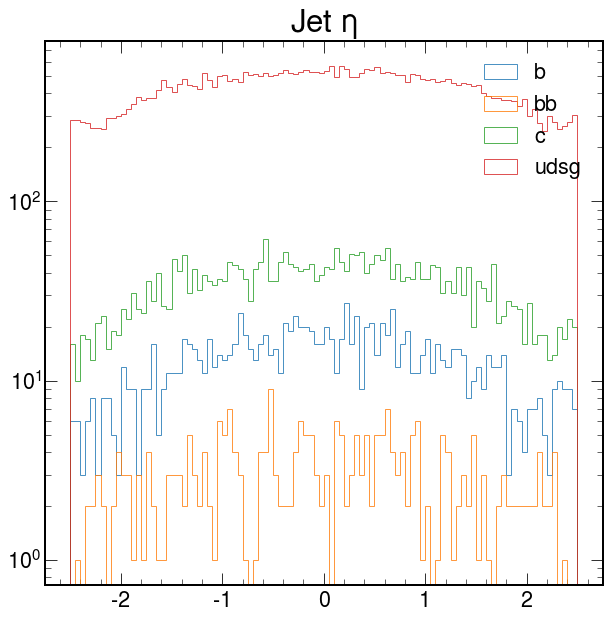

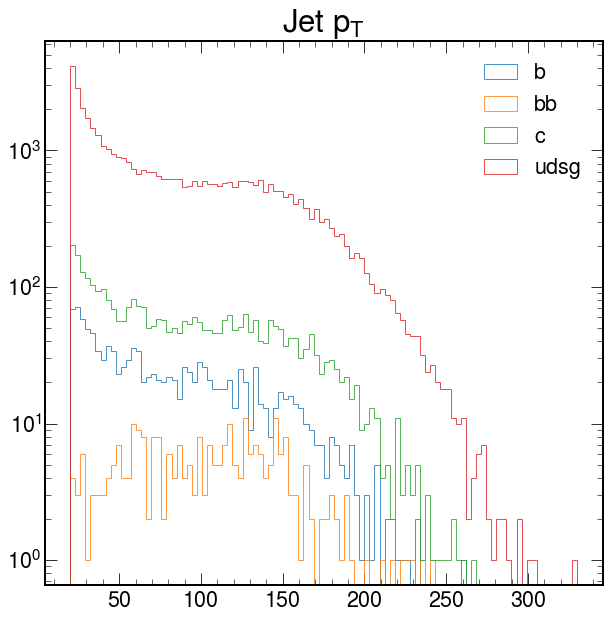

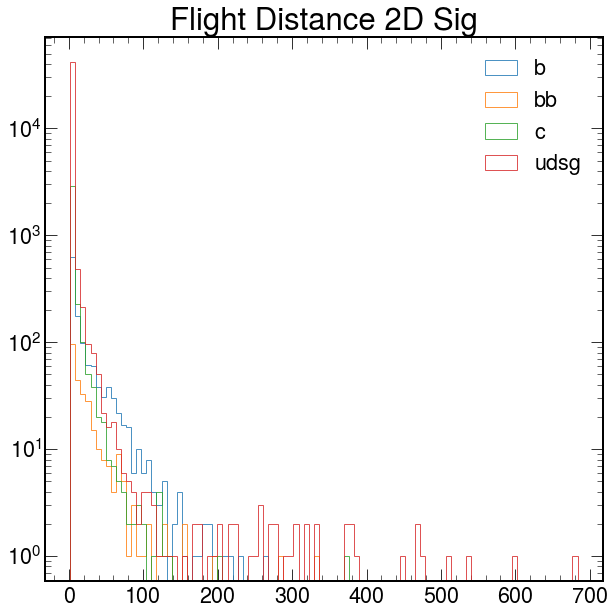

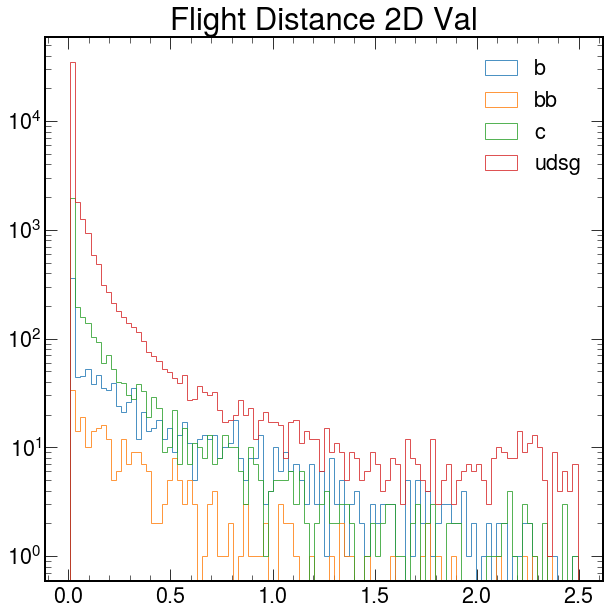

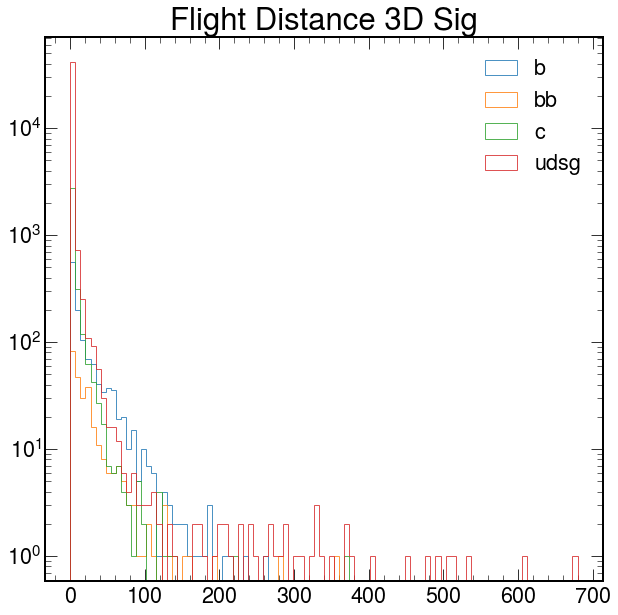

...

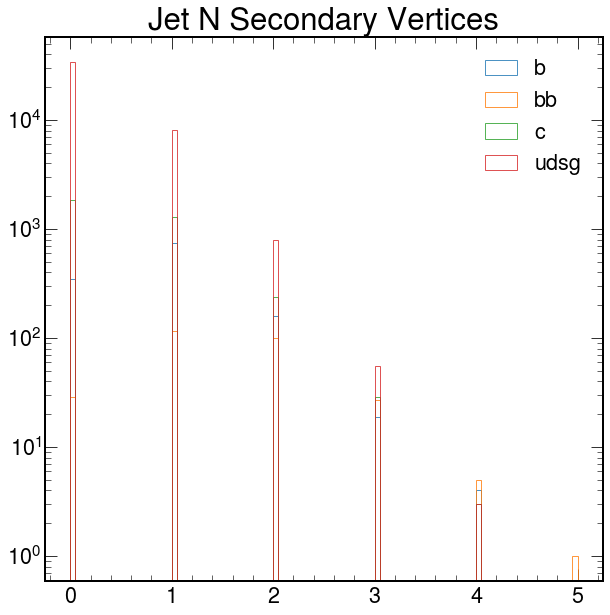

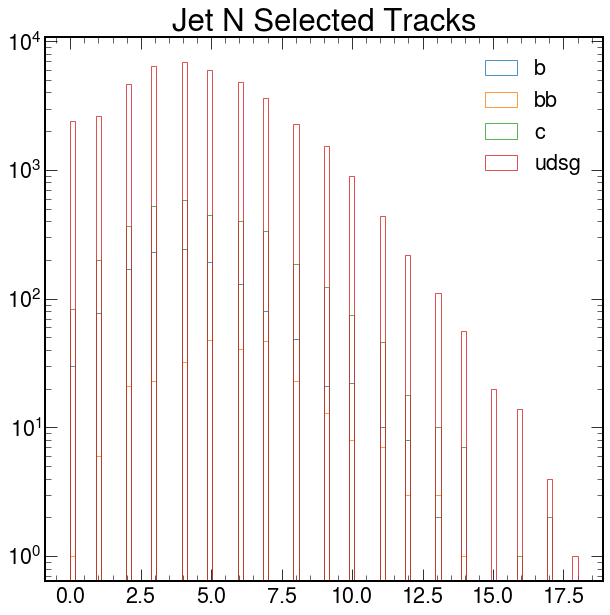

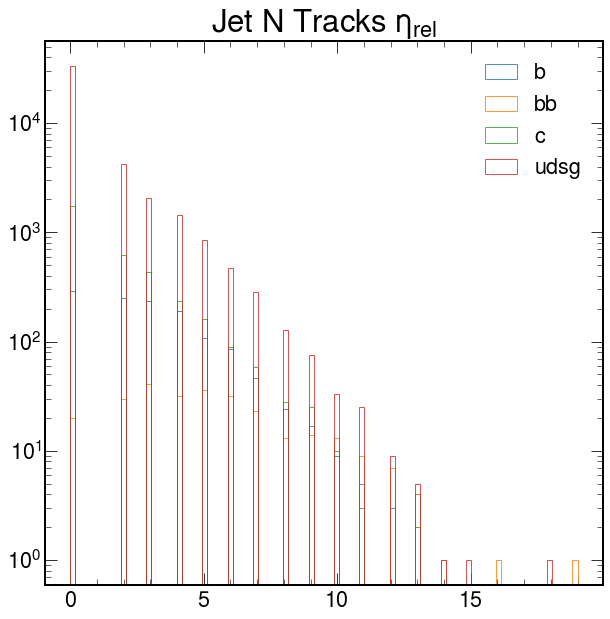

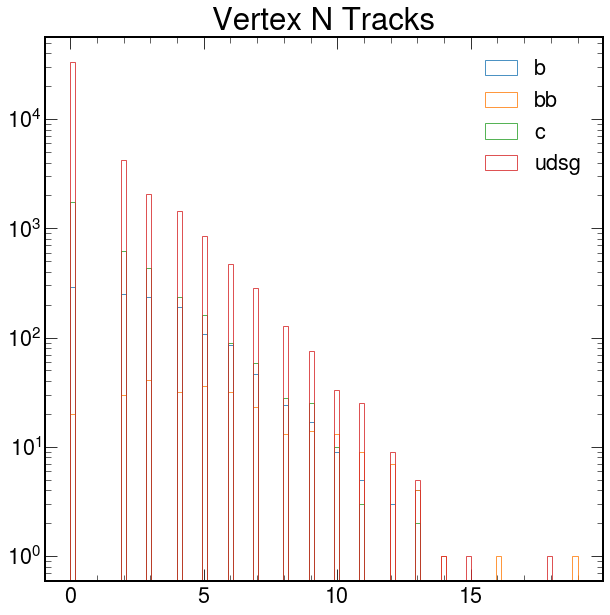

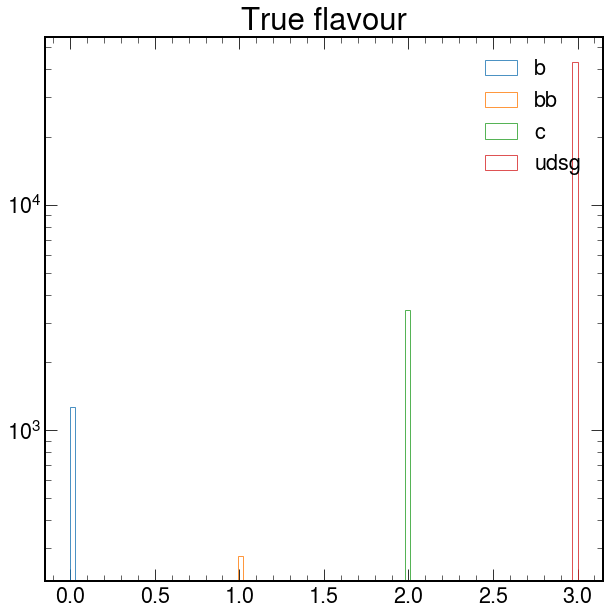

In [303]:
for i in range(len(QCDinputs_and_targets_clean[0])):
    for f in range(4):
        plt.hist(QCDinputs_and_targets_clean[:,i][QCDinputs_and_targets_clean[:,-1]==f],bins=100,range=(min(QCDinputs_and_targets_clean[:,i]),max(QCDinputs_and_targets_clean[:,i])),histtype='step',label=categorynames[f],log=True,alpha=0.8, )
    plt.title((display_names +['True flavour'])[i])
    plt.legend()
    plt.show()

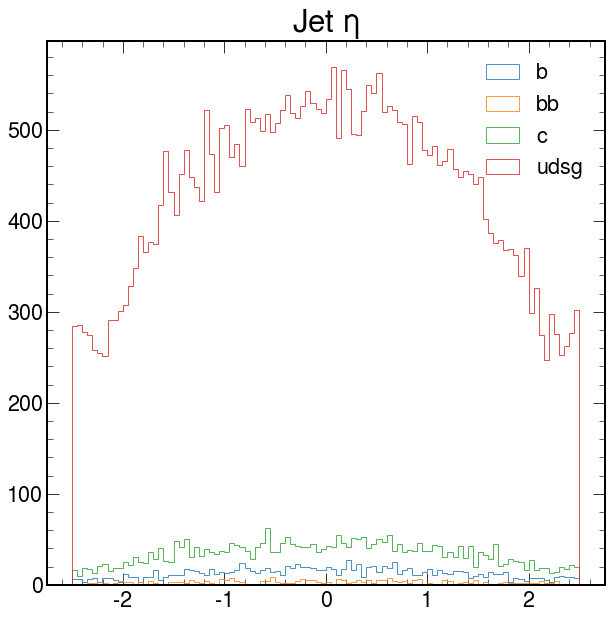

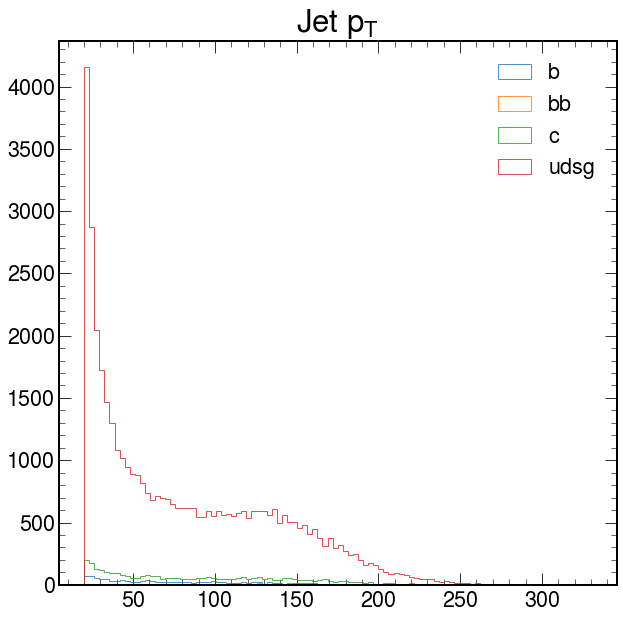

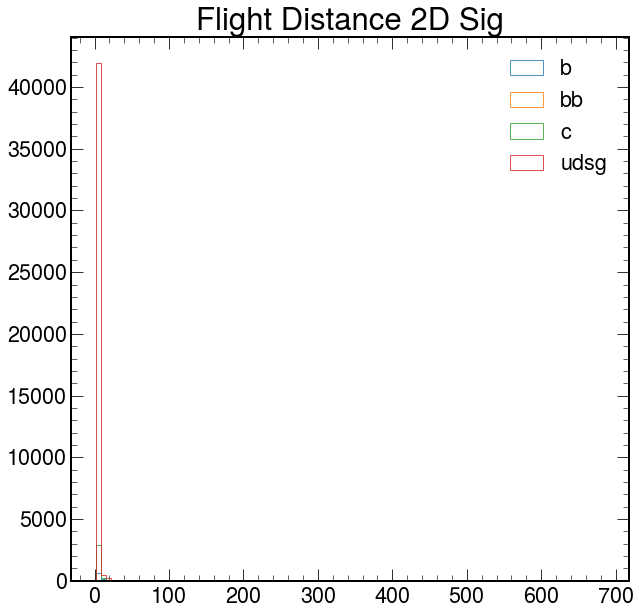

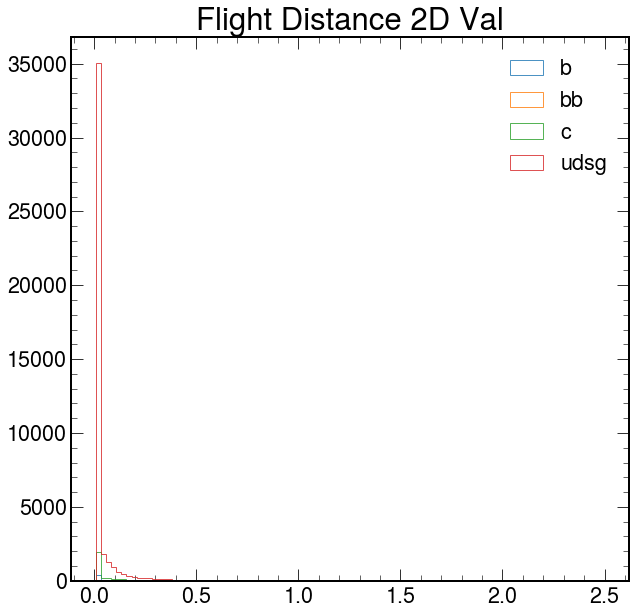

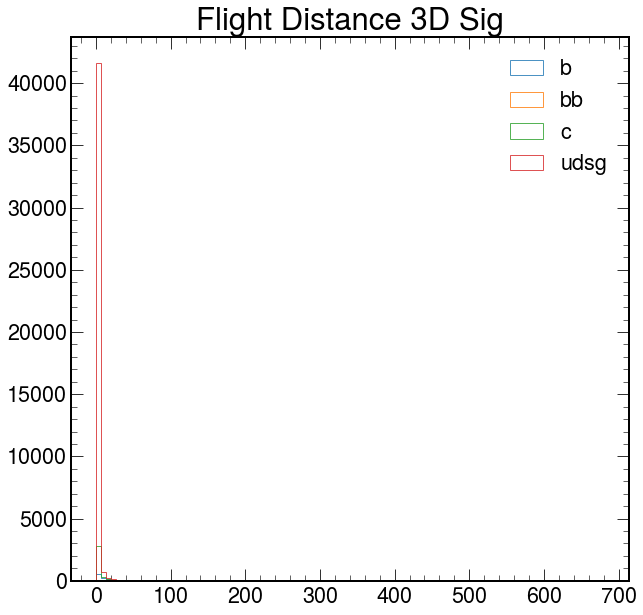

...

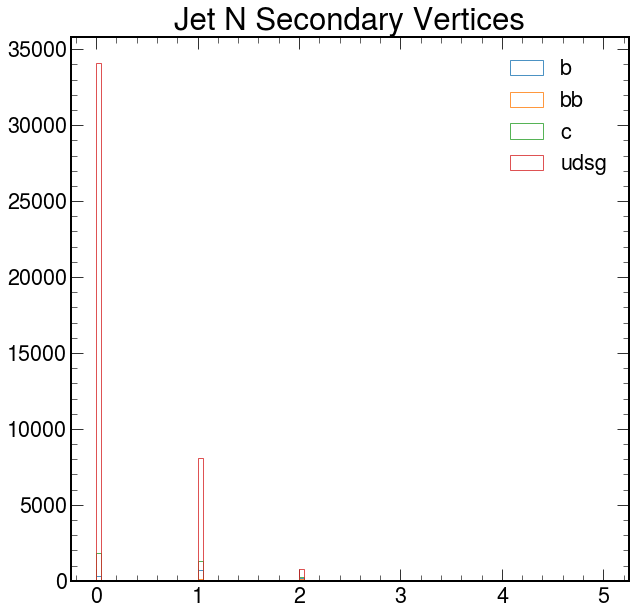

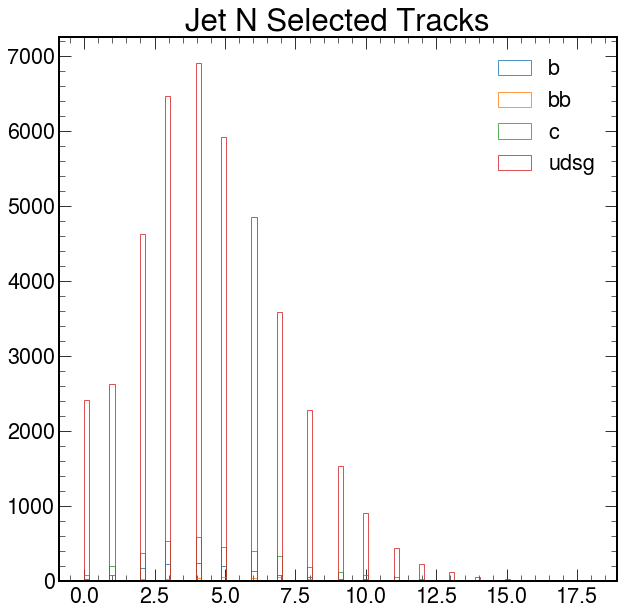

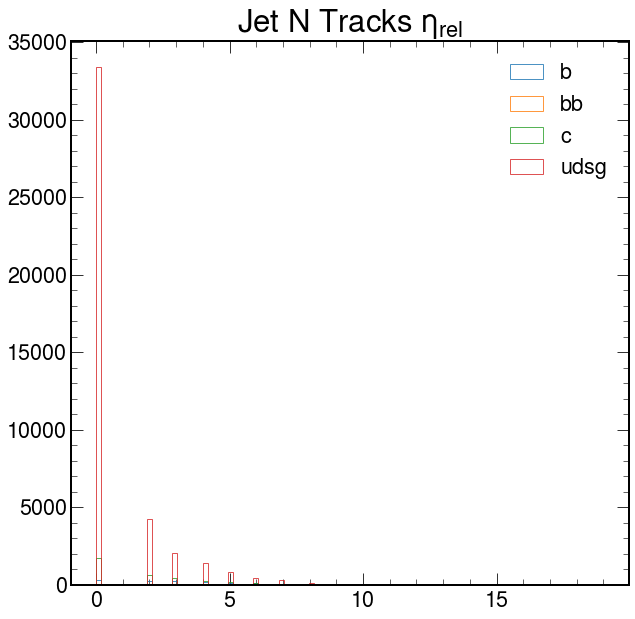

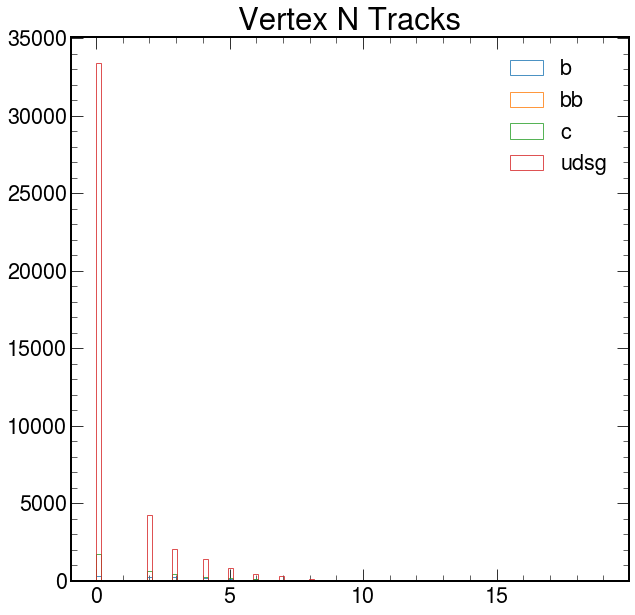

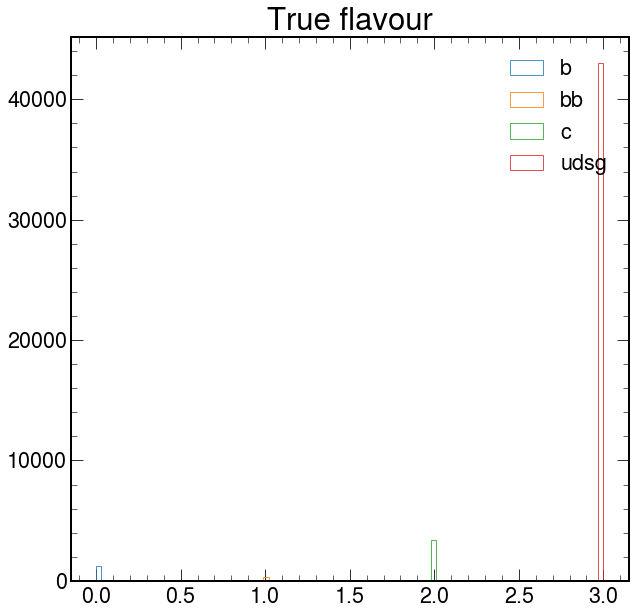

In [305]:
for i in range(len(QCDinputs_and_targets_clean[0])):
    for f in range(4):
        plt.hist(QCDinputs_and_targets_clean[:,i][QCDinputs_and_targets_clean[:,-1]==f],bins=100,range=(min(QCDinputs_and_targets_clean[:,i]),max(QCDinputs_and_targets_clean[:,i])),label=categorynames[f],histtype='step',alpha=0.8, )
    plt.title((display_names +['True flavour'])[i])
    plt.legend()
    plt.show()

some ideas to plot 2d histograms for eta / pt

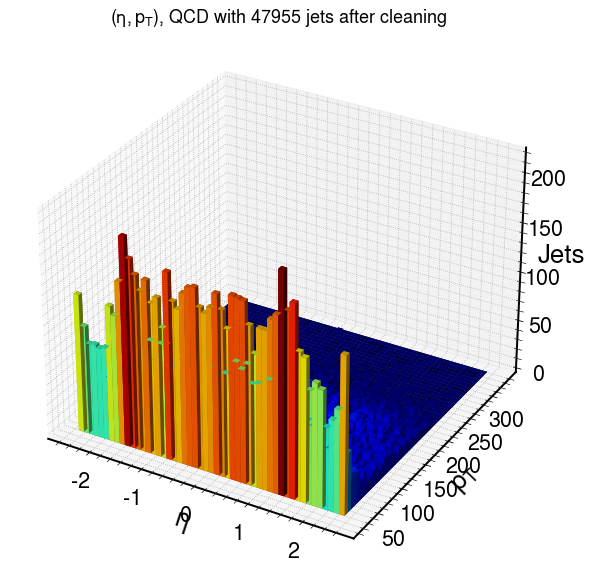

In [122]:
# https://stackoverflow.com/questions/8437788/how-to-correctly-generate-a-3d-histogram-using-numpy-or-matplotlib-built-in-func
x = QCDinputs_and_targets_clean[:,0]
y = QCDinputs_and_targets_clean[:,1]

fig = plt.figure()          #create a canvas, tell matplotlib it's 3d
ax = fig.add_subplot(111, projection='3d')

hist, xedges, yedges = np.histogram2d(x,y, bins=(50,50))
xpos, ypos = np.meshgrid(xedges[:-1]+xedges[1:], yedges[:-1]+yedges[1:])

xpos = xpos.flatten()/2.
ypos = ypos.flatten()/2.
zpos = np.zeros_like (xpos)

dx = xedges [1] - xedges [0]
dy = yedges [1] - yedges [0]
dz = hist.flatten(order='F')

cmap = plt.cm.get_cmap('jet') # Get desired colormap - you can change this!
max_height = np.max(dz)   # get range of colorbars so we can normalize
min_height = np.min(dz)
# scale each z to [0,1], and get their rgb values
rgba = [cmap((k-min_height)/max_height) for k in dz] 

ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=rgba, zsort='average')
plt.title(f'($\eta,p_T$), QCD with '+f'{len(x)} jets after cleaning',fontsize=18)
ax.set_xlabel(f'$\eta$', linespacing=3.4)
ax.set_ylabel(f'$p_T$', linespacing=3.4)
ax.set_zlabel('Jets', linespacing=3.4)
ax.dist = 10
#plt.savefig("Your_title_goes_here")
plt.show()

In [123]:
hist

array([[138.,  55.,  51., ...,   0.,   0.,   0.],
       [108.,  51.,  42., ...,   0.,   0.,   0.],
       [ 92.,  50.,  37., ...,   0.,   0.,   0.],
       ...,
       [ 91.,  54.,  53., ...,   0.,   0.,   0.],
       [103.,  57.,  38., ...,   0.,   0.,   0.],
       [157.,  60.,  36., ...,   0.,   0.,   0.]])

In [124]:
dz

array([138., 108.,  92., ...,   0.,   0.,   0.])

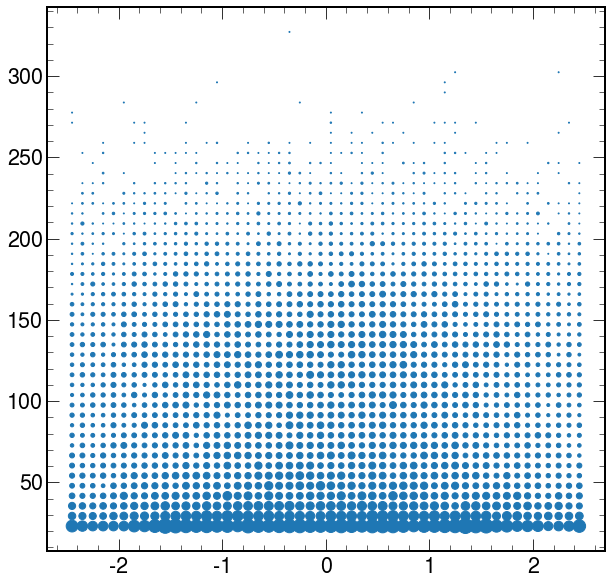

In [126]:
plt.scatter(xpos,ypos,dz)

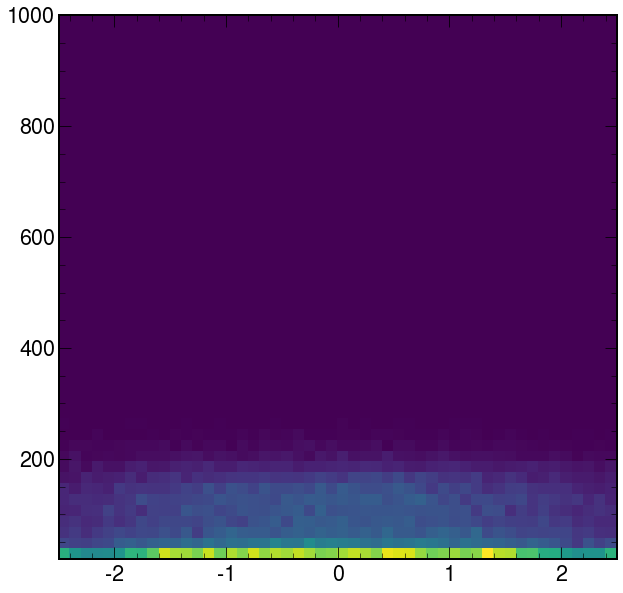

In [135]:
histo2d = plt.hist2d(x,y,bins=(50,50),range=((-2.5,2.5),(20,1000)))

In [136]:
histo2d

(array([[250.,  82.,  57., ...,   0.,   0.,   0.],
        [207.,  76.,  67., ...,   0.,   0.,   0.],
        [185.,  74.,  50., ...,   0.,   0.,   0.],
        ...,
        [203.,  98.,  68., ...,   0.,   0.,   0.],
        [203.,  76.,  54., ...,   0.,   0.,   0.],
        [255.,  90.,  52., ...,   0.,   0.,   0.]]),
 array([-2.5, -2.4, -2.3, -2.2, -2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5,
        -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4,
        -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,
         0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,
         1.9,  2. ,  2.1,  2.2,  2.3,  2.4,  2.5]),
 array([  20. ,   39.6,   59.2,   78.8,   98.4,  118. ,  137.6,  157.2,
         176.8,  196.4,  216. ,  235.6,  255.2,  274.8,  294.4,  314. ,
         333.6,  353.2,  372.8,  392.4,  412. ,  431.6,  451.2,  470.8,
         490.4,  510. ,  529.6,  549.2,  568.8,  588.4,  608. ,  627.6,
         647.2,  666.8,  686.4,  706. ,  72

In [138]:
histo2d[0]

array([[500., 164., 114., ...,   0.,   0.,   0.],
       [414., 152., 134., ...,   0.,   0.,   0.],
       [370., 148., 100., ...,   0.,   0.,   0.],
       ...,
       [406., 196., 136., ...,   0.,   0.,   0.],
       [406., 152., 108., ...,   0.,   0.,   0.],
       [510., 180., 104., ...,   0.,   0.,   0.]])

In [134]:
histo2d

(array([[250.,  82.,  57., ...,   0.,   0.,   0.],
        [207.,  76.,  67., ...,   0.,   0.,   0.],
        [185.,  74.,  50., ...,   0.,   0.,   0.],
        ...,
        [203.,  98.,  68., ...,   0.,   0.,   0.],
        [203.,  76.,  54., ...,   0.,   0.,   0.],
        [255.,  90.,  52., ...,   0.,   0.,   0.]]),
 array([-2.5, -2.4, -2.3, -2.2, -2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5,
        -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4,
        -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,
         0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,
         1.9,  2. ,  2.1,  2.2,  2.3,  2.4,  2.5]),
 array([  20. ,   39.6,   59.2,   78.8,   98.4,  118. ,  137.6,  157.2,
         176.8,  196.4,  216. ,  235.6,  255.2,  274.8,  294.4,  314. ,
         333.6,  353.2,  372.8,  392.4,  412. ,  431.6,  451.2,  470.8,
         490.4,  510. ,  529.6,  549.2,  568.8,  588.4,  608. ,  627.6,
         647.2,  666.8,  686.4,  706. ,  72

In [139]:
histo2d = np.histogram2d(x,y,bins=(50,50),range=((-2.5,2.5),(20,1000)))

In [140]:
histo2d

(array([[250.,  82.,  57., ...,   0.,   0.,   0.],
        [207.,  76.,  67., ...,   0.,   0.,   0.],
        [185.,  74.,  50., ...,   0.,   0.,   0.],
        ...,
        [203.,  98.,  68., ...,   0.,   0.,   0.],
        [203.,  76.,  54., ...,   0.,   0.,   0.],
        [255.,  90.,  52., ...,   0.,   0.,   0.]]),
 array([-2.5, -2.4, -2.3, -2.2, -2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5,
        -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4,
        -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,
         0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,
         1.9,  2. ,  2.1,  2.2,  2.3,  2.4,  2.5]),
 array([  20. ,   39.6,   59.2,   78.8,   98.4,  118. ,  137.6,  157.2,
         176.8,  196.4,  216. ,  235.6,  255.2,  274.8,  294.4,  314. ,
         333.6,  353.2,  372.8,  392.4,  412. ,  431.6,  451.2,  470.8,
         490.4,  510. ,  529.6,  549.2,  568.8,  588.4,  608. ,  627.6,
         647.2,  666.8,  686.4,  706. ,  72

In [22]:
starts = np.arange(0,2450,50)
# this will have all ends from 49 to 2399 as well as 2446 (this was the number of original .root-files)
ends = np.concatenate((np.arange(49,2449,50), np.arange(2446,2447)))             



#print(starts)
#print(ends)
NUM_DATASETS = len(starts)
print(NUM_DATASETS)


# TT to Semileptonic
dataset_paths = [f'/hpcwork/um106329/may_21/cleaned_TT/inputs_{starts[k]}_to_{ends[k]}_with_default_{default}.npy' for k in range(0, NUM_DATASETS)]
DeepCSV_paths = [f'/hpcwork/um106329/may_21/cleaned_TT/deepcsv_{starts[k]}_to_{ends[k]}_with_default_{default}.npy' for k in range(0, NUM_DATASETS)]

49


In [422]:
oneTT = np.load(dataset_paths[0])

(array([      0.,       0.,       0.,       0.,       0., 1182896.,
              0.,       0.,       0.,       0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <BarContainer object of 10 artists>)

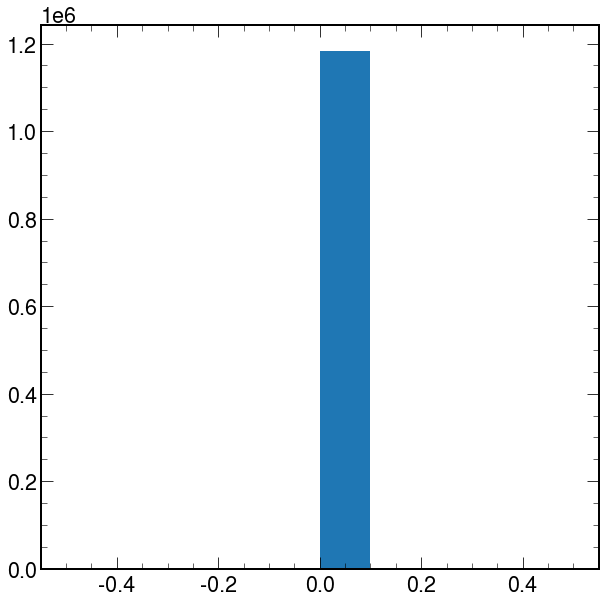

In [425]:
plt.hist(oneTT[:,59])

In [433]:
totaltt = 0
for f in dataset_paths:
    totaltt += len(np.load(f))

In [434]:
totaltt

224235788

In [435]:
ttfile0 = np.load(dataset_paths[0])
tt_b_histo, eta_edges, pt_edges = np.histogram2d(ttfile0[:,0][ttfile0[:,-1]==0],ttfile0[:,1][ttfile0[:,-1]==0],bins=(50,50),range=((-2.5,2.5),(20,1000)))
tt_bb_histo, eta_edges, pt_edges = np.histogram2d(ttfile0[:,0][ttfile0[:,-1]==1],ttfile0[:,1][ttfile0[:,-1]==1],bins=(50,50),range=((-2.5,2.5),(20,1000)))
tt_c_histo, eta_edges, pt_edges = np.histogram2d(ttfile0[:,0][ttfile0[:,-1]==2],ttfile0[:,1][ttfile0[:,-1]==2],bins=(50,50),range=((-2.5,2.5),(20,1000)))
tt_l_histo, eta_edges, pt_edges = np.histogram2d(ttfile0[:,0][ttfile0[:,-1]==3],ttfile0[:,1][ttfile0[:,-1]==3],bins=(50,50),range=((-2.5,2.5),(20,1000)))
for ttpath in dataset_paths[1:]:
    ttfile = np.load(ttpath)
    tt_b_histo += np.histogram2d(ttfile[:,0][ttfile[:,-1]==0],ttfile[:,1][ttfile[:,-1]==0],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    tt_bb_histo += np.histogram2d(ttfile[:,0][ttfile[:,-1]==1],ttfile[:,1][ttfile[:,-1]==1],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    tt_c_histo += np.histogram2d(ttfile[:,0][ttfile[:,-1]==2],ttfile[:,1][ttfile[:,-1]==2],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    tt_l_histo += np.histogram2d(ttfile[:,0][ttfile[:,-1]==3],ttfile[:,1][ttfile[:,-1]==3],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    

In [436]:
tt_b_histo

array([[144590., 124327.,  94270., ...,      0.,      0.,      0.],
       [151022., 136245., 102838., ...,      0.,      0.,      0.],
       [152714., 146809., 114292., ...,      0.,      0.,      0.],
       ...,
       [154866., 149254., 110975., ...,      0.,      0.,      0.],
       [148828., 139405., 100596., ...,      0.,      0.,      0.],
       [136117., 125260.,  90251., ...,      0.,      0.,      0.]])

In [437]:
tt_bb_histo

array([[ 984., 1001., 1066., ...,    0.,    0.,    0.],
       [ 967., 1162., 1224., ...,    0.,    0.,    0.],
       [1017., 1192., 1305., ...,    0.,    0.,    0.],
       ...,
       [1037., 1147., 1211., ...,    0.,    0.,    0.],
       [ 965., 1155., 1111., ...,    0.,    0.,    0.],
       [ 901., 1029., 1016., ...,    0.,    0.,    0.]])

In [438]:
tt_c_histo

array([[66818., 40189., 25573., ...,     0.,     0.,     0.],
       [66610., 42070., 27124., ...,     0.,     0.,     0.],
       [67421., 45792., 30160., ...,     0.,     0.,     0.],
       ...,
       [68169., 46395., 29642., ...,     0.,     0.,     0.],
       [65852., 43678., 26690., ...,     0.,     0.,     0.],
       [63285., 40264., 24778., ...,     0.,     0.,     0.]])

In [439]:
tt_l_histo

array([[7.42859e+05, 2.79077e+05, 1.56531e+05, ..., 0.00000e+00,
        0.00000e+00, 0.00000e+00],
       [6.58869e+05, 2.92600e+05, 1.67834e+05, ..., 0.00000e+00,
        0.00000e+00, 0.00000e+00],
       [6.35585e+05, 3.08766e+05, 1.82382e+05, ..., 0.00000e+00,
        0.00000e+00, 0.00000e+00],
       ...,
       [6.51813e+05, 3.16713e+05, 1.78775e+05, ..., 1.00000e+00,
        0.00000e+00, 0.00000e+00],
       [6.63703e+05, 3.03808e+05, 1.64556e+05, ..., 0.00000e+00,
        0.00000e+00, 0.00000e+00],
       [7.19404e+05, 2.84560e+05, 1.51058e+05, ..., 0.00000e+00,
        0.00000e+00, 0.00000e+00]])

In [440]:
np.save('tt_b_histo.npy',tt_b_histo)
np.save('tt_bb_histo.npy',tt_bb_histo)
np.save('tt_c_histo.npy',tt_c_histo)
np.save('tt_l_histo.npy',tt_l_histo)

In [46]:
qcdstarts = np.arange(0,11450,50)
# this will have all ends from 49 to 2399 as well as 2446 (this was the number of original .root-files)
qcdends = np.concatenate((np.arange(49,11449,50), np.arange(11407,11408)))             



#print(starts)
#print(ends)
qcdNUM_DATASETS = len(qcdstarts)
print(qcdNUM_DATASETS)


# QCD
qcddataset_paths = [f'/hpcwork/um106329/may_21/cleaned_QCD/inputs_{qcdstarts[k]}_to_{qcdends[k]}_with_default_{default}.npy' for k in range(0, qcdNUM_DATASETS)]
qcdDeepCSV_paths = [f'/hpcwork/um106329/may_21/cleaned_QCD/deepcsv_{qcdstarts[k]}_to_{qcdends[k]}_with_default_{default}.npy' for k in range(0, qcdNUM_DATASETS)]

229


In [427]:
newqcdexample = np.load(qcddataset_paths[0])

(array([2.353241e+06, 0.000000e+00, 0.000000e+00, 3.664490e+05,
        0.000000e+00, 2.013420e+05, 0.000000e+00, 1.361050e+05,
        0.000000e+00, 8.437000e+04, 0.000000e+00, 5.069100e+04,
        0.000000e+00, 2.851900e+04, 0.000000e+00, 1.536600e+04,
        0.000000e+00, 8.003000e+03, 0.000000e+00, 4.536000e+03,
        0.000000e+00, 2.480000e+03, 0.000000e+00, 1.346000e+03,
        0.000000e+00, 7.590000e+02, 4.240000e+02, 0.000000e+00,
        2.290000e+02, 0.000000e+00, 1.490000e+02, 0.000000e+00,
        8.100000e+01, 0.000000e+00, 4.200000e+01, 0.000000e+00,
        2.100000e+01, 0.000000e+00, 1.600000e+01, 0.000000e+00,
        6.000000e+00, 0.000000e+00, 5.000000e+00, 0.000000e+00,
        2.000000e+00, 0.000000e+00, 2.000000e+00, 0.000000e+00,
        2.000000e+00, 2.000000e+00]),
 array([ 0.  ,  0.52,  1.04,  1.56,  2.08,  2.6 ,  3.12,  3.64,  4.16,
         4.68,  5.2 ,  5.72,  6.24,  6.76,  7.28,  7.8 ,  8.32,  8.84,
         9.36,  9.88, 10.4 , 10.92, 11.44, 11.96, 12

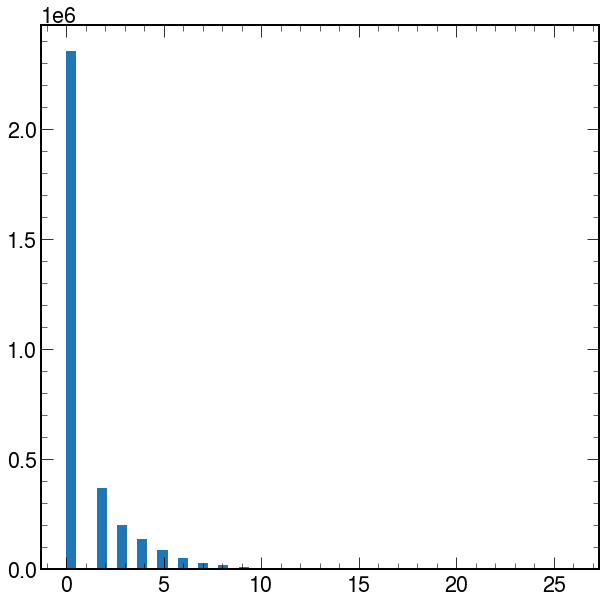

In [432]:
plt.hist(newqcdexample[:,65],bins=50)

(array([ 868346.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.,   59901.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.,       0.,       0.,
              0., 2325941.]),
 array([-1.00000e-03,  3.90200e-02,  7.90400e-02,  1.19060e-01,
         1.59080e-01,  1.99100e-01,  2.39120e-01,  2.79140e-01,
         3.19160e-01,  3.59180e-01,  3.99200e-01,  4.39220e-01,
         4.79240e-01,  5.19260e-01,  5.59280e-01,  5.99300e-01,
         6.39320e-01,  6.79340e-01,  7.19360e-01,  7.59380e-01,
         7.99400e-01,  8.39420e-01,  8.79440e-01,  9.19460e-01,
         9.59480e-01,  9.99500e-01,  1.039

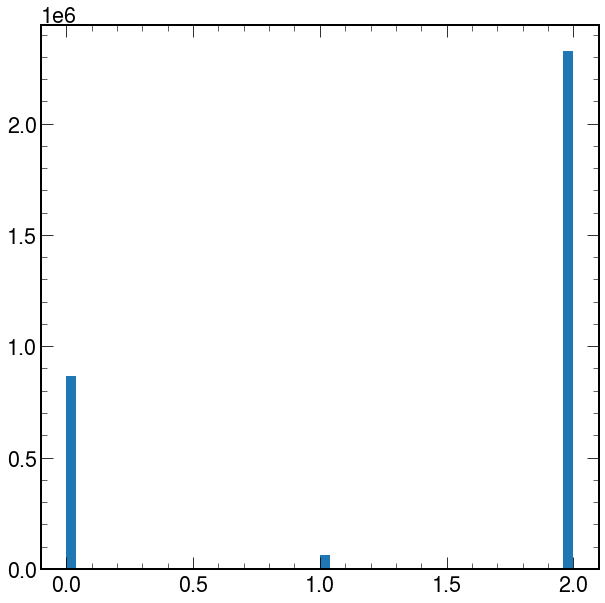

In [427]:
plt.hist(newqcdexample[:,59],bins=50)

In [47]:
qcdfile0 = np.load(qcddataset_paths[0])
qcd_b_histo, eta_edges, pt_edges = np.histogram2d(qcdfile0[:,0][qcdfile0[:,-1]==0],qcdfile0[:,1][qcdfile0[:,-1]==0],bins=(50,50),range=((-2.5,2.5),(20,1000)))
qcd_bb_histo, eta_edges, pt_edges = np.histogram2d(qcdfile0[:,0][qcdfile0[:,-1]==1],qcdfile0[:,1][qcdfile0[:,-1]==1],bins=(50,50),range=((-2.5,2.5),(20,1000)))
qcd_c_histo, eta_edges, pt_edges = np.histogram2d(qcdfile0[:,0][qcdfile0[:,-1]==2],qcdfile0[:,1][qcdfile0[:,-1]==2],bins=(50,50),range=((-2.5,2.5),(20,1000)))
qcd_l_histo, eta_edges, pt_edges = np.histogram2d(qcdfile0[:,0][qcdfile0[:,-1]==3],qcdfile0[:,1][qcdfile0[:,-1]==3],bins=(50,50),range=((-2.5,2.5),(20,1000)))

In [402]:
for qcdpath in qcddataset_paths[1:]:
    qcdfile = np.load(qcdpath)
    qcd_b_histo += np.histogram2d(qcdfile[:,0][qcdfile[:,-1]==0],qcdfile[:,1][qcdfile[:,-1]==0],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    qcd_bb_histo += np.histogram2d(qcdfile[:,0][qcdfile[:,-1]==1],qcdfile[:,1][qcdfile[:,-1]==1],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    qcd_c_histo += np.histogram2d(qcdfile[:,0][qcdfile[:,-1]==2],qcdfile[:,1][qcdfile[:,-1]==2],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    qcd_l_histo += np.histogram2d(qcdfile[:,0][qcdfile[:,-1]==3],qcdfile[:,1][qcdfile[:,-1]==3],bins=(50,50),range=((-2.5,2.5),(20,1000)))[0]
    

In [403]:
np.save('qcd_b_histo.npy', qcd_b_histo)
np.save('qcd_bb_histo.npy',qcd_bb_histo)
np.save('qcd_c_histo.npy', qcd_c_histo)
np.save('qcd_l_histo.npy', qcd_l_histo)

In [11]:
qcd_b_histo = np.load('qcd_b_histo.npy')
qcd_bb_histo = np.load('qcd_bb_histo.npy')
qcd_c_histo = np.load('qcd_c_histo.npy')
qcd_l_histo = np.load('qcd_l_histo.npy')

In [12]:
tt_b_histo = np.load('tt_b_histo.npy')
tt_bb_histo = np.load('tt_bb_histo.npy')
tt_c_histo = np.load('tt_c_histo.npy')
tt_l_histo = np.load('tt_l_histo.npy')

In [46]:
qcd_b_histo

array([[4.4311e+04, 2.2136e+04, 1.5552e+04, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.5037e+04, 2.3717e+04, 1.6775e+04, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.4478e+04, 2.5120e+04, 1.8240e+04, ..., 0.0000e+00, 0.0000e+00,
        1.0000e+00],
       ...,
       [4.5269e+04, 2.5687e+04, 1.7540e+04, ..., 0.0000e+00, 1.0000e+00,
        0.0000e+00],
       [4.4412e+04, 2.4129e+04, 1.6513e+04, ..., 1.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.2169e+04, 2.2340e+04, 1.5189e+04, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [47]:
qcd_bb_histo

array([[2.939e+03, 2.694e+03, 2.709e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [3.117e+03, 2.828e+03, 3.110e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [3.003e+03, 3.040e+03, 3.261e+03, ..., 1.000e+00, 3.000e+00,
        3.000e+00],
       ...,
       [3.092e+03, 3.203e+03, 3.091e+03, ..., 3.000e+00, 2.000e+00,
        0.000e+00],
       [3.074e+03, 3.026e+03, 2.949e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [2.844e+03, 2.804e+03, 2.635e+03, ..., 1.000e+00, 0.000e+00,
        0.000e+00]])

In [48]:
qcd_c_histo

array([[1.21317e+05, 5.29930e+04, 3.86920e+04, ..., 1.00000e+00,
        2.00000e+00, 0.00000e+00],
       [1.16936e+05, 5.54380e+04, 4.11260e+04, ..., 2.00000e+00,
        3.00000e+00, 3.00000e+00],
       [1.16200e+05, 5.89550e+04, 4.40400e+04, ..., 1.10000e+01,
        1.30000e+01, 1.00000e+01],
       ...,
       [1.18173e+05, 6.01380e+04, 4.28330e+04, ..., 1.30000e+01,
        1.40000e+01, 7.00000e+00],
       [1.16866e+05, 5.72110e+04, 4.03450e+04, ..., 4.00000e+00,
        3.00000e+00, 0.00000e+00],
       [1.16654e+05, 5.40680e+04, 3.71360e+04, ..., 0.00000e+00,
        0.00000e+00, 1.00000e+00]])

In [49]:
qcd_l_histo

array([[2.359445e+06, 7.697680e+05, 5.303780e+05, ..., 2.100000e+01,
        1.300000e+01, 8.000000e+00],
       [2.051304e+06, 7.872330e+05, 5.559460e+05, ..., 6.900000e+01,
        4.800000e+01, 4.800000e+01],
       [1.980287e+06, 8.198070e+05, 5.808140e+05, ..., 2.020000e+02,
        1.890000e+02, 1.540000e+02],
       ...,
       [2.043122e+06, 8.315510e+05, 5.610640e+05, ..., 2.050000e+02,
        1.590000e+02, 1.670000e+02],
       [2.080715e+06, 8.107400e+05, 5.381850e+05, ..., 6.100000e+01,
        5.800000e+01, 3.700000e+01],
       [2.302246e+06, 7.848110e+05, 5.114320e+05, ..., 3.500000e+01,
        1.500000e+01, 6.000000e+00]])

In [13]:
total_qcd = sum(qcd_b_histo.flatten()+qcd_bb_histo.flatten()+qcd_c_histo.flatten()+qcd_l_histo.flatten())
total_qcd

709686958.0

In [14]:
total_tt = sum(tt_b_histo.flatten()+tt_bb_histo.flatten()+tt_c_histo.flatten()+tt_l_histo.flatten())
total_tt

224235788.0

In [15]:
total_everything = total_qcd + total_tt
total_everything

933922746.0

In [16]:
both_b_histo = tt_b_histo + qcd_b_histo

In [17]:
both_bb_histo = tt_bb_histo + qcd_bb_histo
both_c_histo = tt_c_histo + qcd_c_histo
both_l_histo = tt_l_histo + qcd_l_histo

In [445]:
np.save('both_b_histo.npy',both_b_histo)
np.save('both_bb_histo.npy',both_bb_histo)
np.save('both_c_histo.npy',both_c_histo)
np.save('both_l_histo.npy',both_l_histo)

In [18]:
all_b = sum(both_b_histo.flatten())
all_b

90508914.0

In [19]:
all_bb = sum(both_bb_histo.flatten())
all_bb

6735524.0

In [20]:
all_c = sum(both_c_histo.flatten())
all_c

75777358.0

In [21]:
all_l = sum(both_l_histo.flatten())
all_l

760900950.0

In [22]:
factor_b = total_everything/all_b
factor_bb = total_everything/all_bb
factor_c = total_everything/all_c
factor_l = total_everything/all_l

In [446]:
both_b_histo.flatten(order='F')

array([188901., 196059., 197192., ...,      0.,      0.,      0.])

In [447]:
len(both_b_histo.flatten(order='F'))

2500

In [448]:
len(eta_edges[:-2])

49

In [449]:
xpos, ypos = np.meshgrid(eta_edges[:-1]+eta_edges[1:], pt_edges[:-1]+pt_edges[1:])

xpos = xpos.flatten()/2.
ypos = ypos.flatten()/2.

Text(0.5, 0.98, '$(\\eta, p_T)$ for b jets before reweighting,\nbased on TTToSemileptonic and QCD')

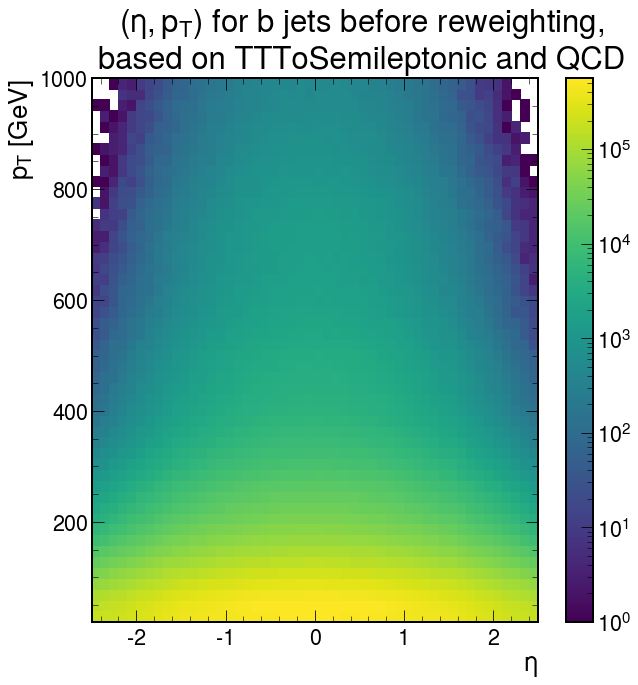

In [450]:
fig, ax = plt.subplots()
counts, xedges, yedges, im = ax.hist2d(xpos, ypos,range=((-2.5,2.5),(20,1000)),bins=(50,50),weights=both_b_histo.flatten(order='F'), norm=LogNorm())
fig.colorbar(im, ax=ax)
ax.set_xlabel(r'$\eta$')
ax.set_ylabel(r'$p_T$ [GeV]')
fig.suptitle(r'$(\eta, p_T)$'+' for b jets before reweighting,\nbased on TTToSemileptonic and QCD')

Text(0.5, 0.98, '$(\\eta, p_T)$ for bb jets before reweighting,\nbased on TTToSemileptonic and QCD')

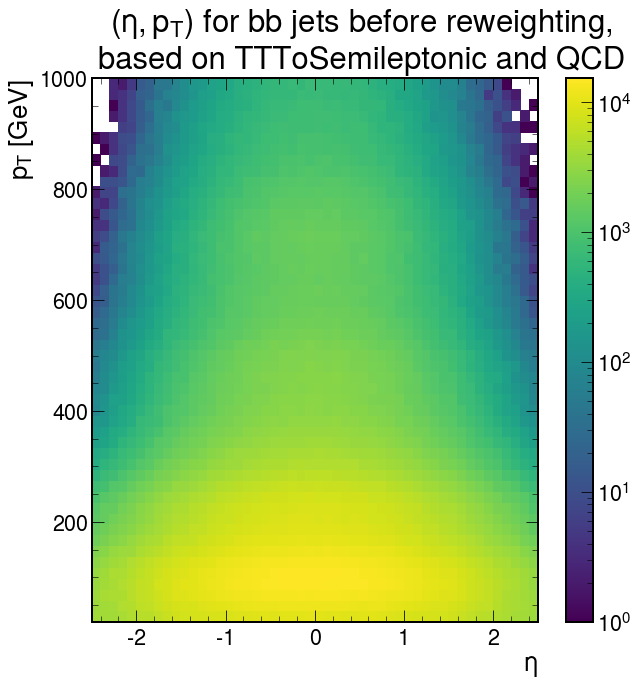

In [451]:
fig, ax = plt.subplots()
counts, xedges, yedges, im = ax.hist2d(xpos, ypos,range=((-2.5,2.5),(20,1000)),bins=(50,50),weights=both_bb_histo.flatten(order='F'), norm=LogNorm())
fig.colorbar(im, ax=ax)
ax.set_xlabel(r'$\eta$')
ax.set_ylabel(r'$p_T$ [GeV]')
fig.suptitle(r'$(\eta, p_T)$'+' for bb jets before reweighting,\nbased on TTToSemileptonic and QCD')

Text(0.5, 0.98, '$(\\eta, p_T)$ for c jets before reweighting,\nbased on TTToSemileptonic and QCD')

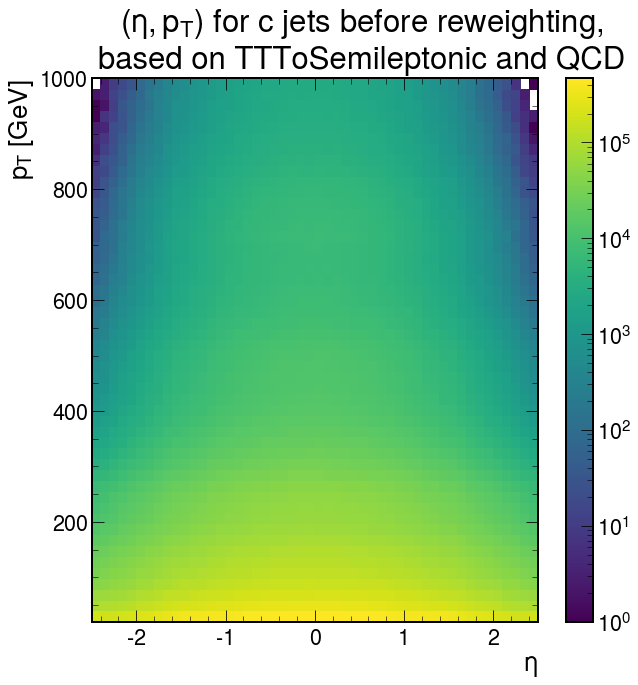

In [452]:
fig, ax = plt.subplots()
counts, xedges, yedges, im = ax.hist2d(xpos, ypos,range=((-2.5,2.5),(20,1000)),bins=(50,50),weights=both_c_histo.flatten(order='F'), norm=LogNorm())
fig.colorbar(im, ax=ax)
ax.set_xlabel(r'$\eta$')
ax.set_ylabel(r'$p_T$ [GeV]')
fig.suptitle(r'$(\eta, p_T)$'+' for c jets before reweighting,\nbased on TTToSemileptonic and QCD')

Text(0.5, 0.98, '$(\\eta, p_T)$ for udsg jets before reweighting,\nbased on TTToSemileptonic and QCD')

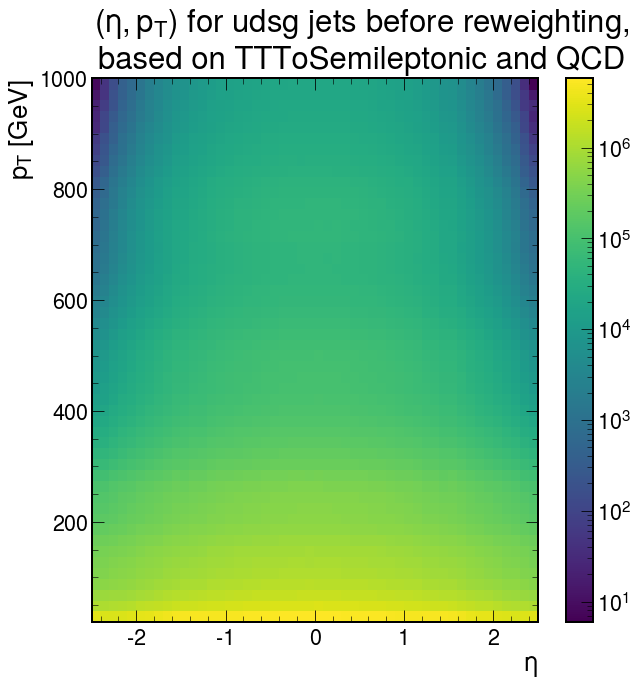

In [453]:
fig, ax = plt.subplots()
counts, xedges, yedges, im = ax.hist2d(xpos, ypos,range=((-2.5,2.5),(20,1000)),bins=(50,50),weights=both_l_histo.flatten(order='F'), norm=LogNorm())
fig.colorbar(im, ax=ax)
ax.set_xlabel(r'$\eta$')
ax.set_ylabel(r'$p_T$ [GeV]')
fig.suptitle(r'$(\eta, p_T)$'+' for udsg jets before reweighting,\nbased on TTToSemileptonic and QCD')

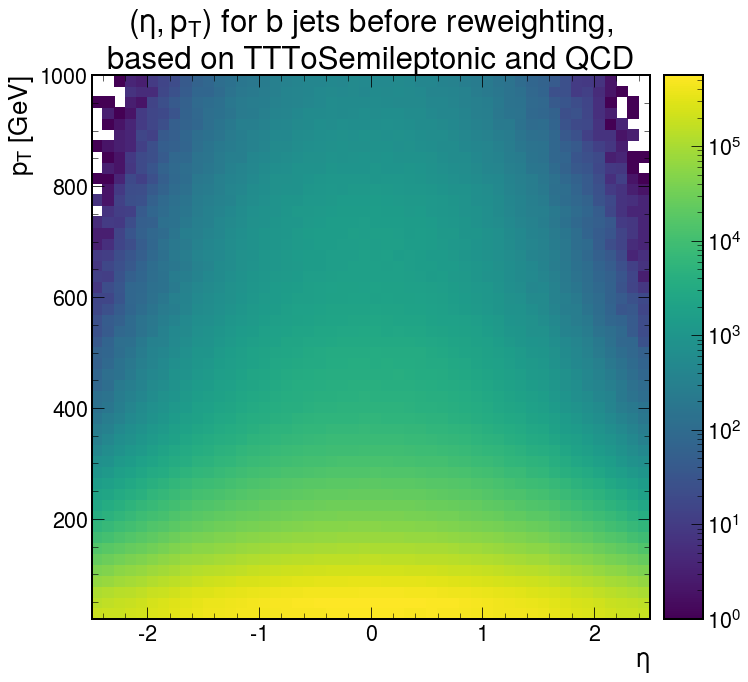

In [454]:
ax = hep.hist2dplot(both_b_histo, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for b jets before reweighting,\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_b_histo.png',dpi=400,transparent=False,facecolor='white')

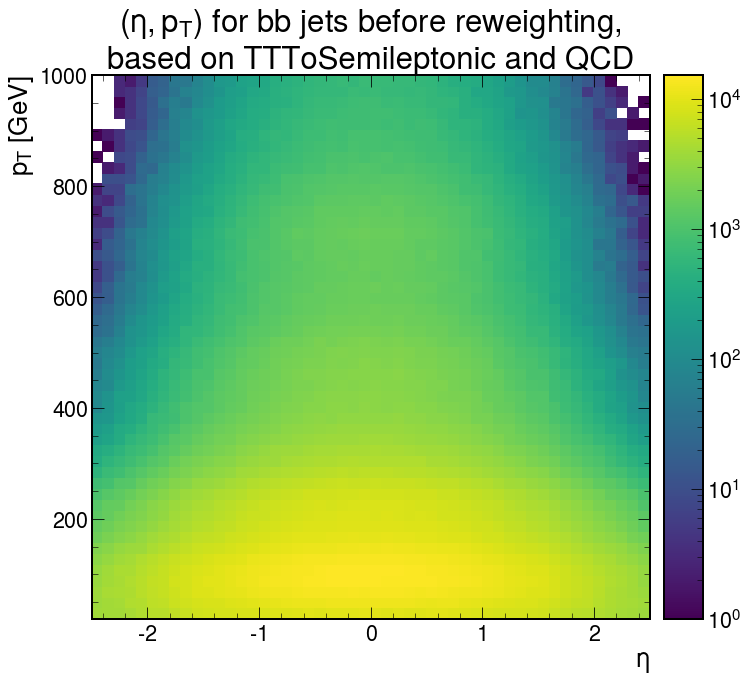

In [455]:
ax = hep.hist2dplot(both_bb_histo, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for bb jets before reweighting,\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_bb_histo.png',dpi=400,transparent=False,facecolor='white')

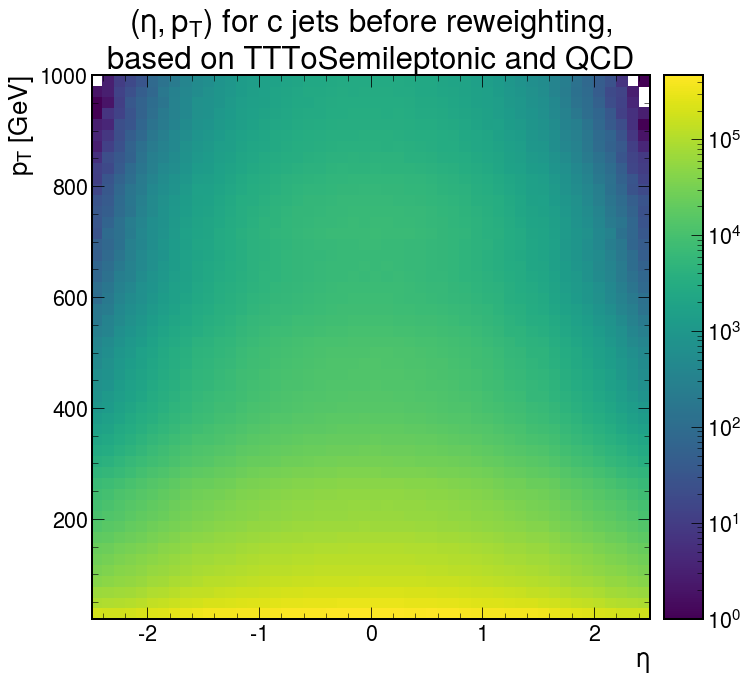

In [456]:
ax = hep.hist2dplot(both_c_histo, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for c jets before reweighting,\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_c_histo.png',dpi=400,transparent=False,facecolor='white')

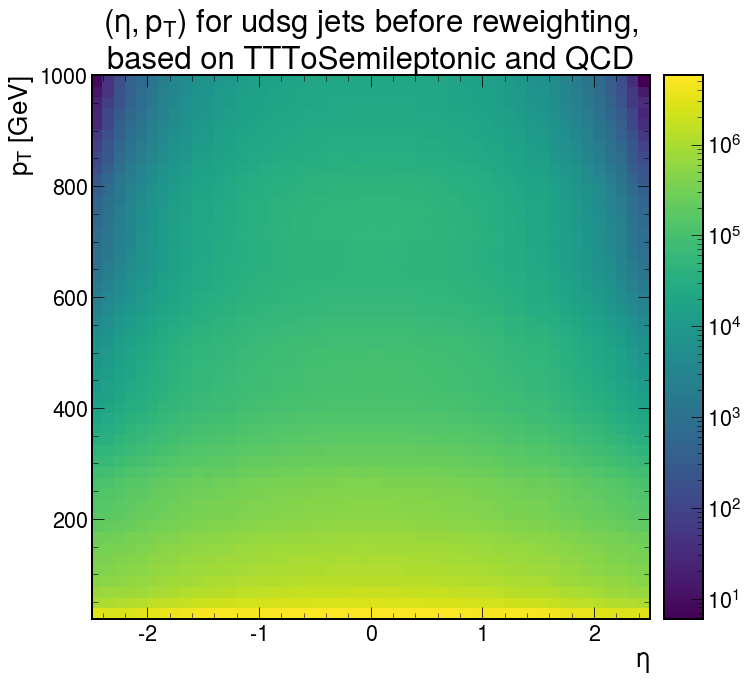

In [457]:
ax = hep.hist2dplot(both_l_histo, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for udsg jets before reweighting,\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_l_histo.png',dpi=400,transparent=False,facecolor='white')

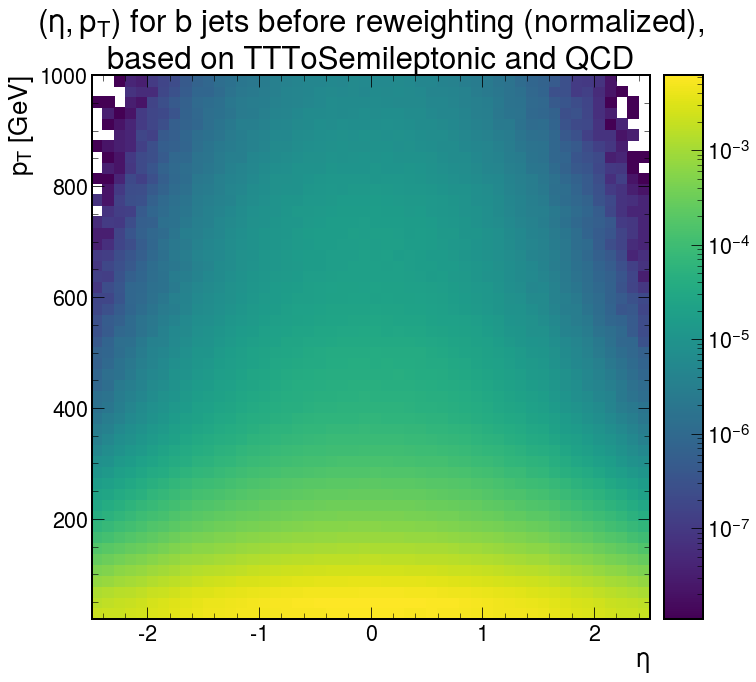

In [458]:
ax = hep.hist2dplot(both_b_histo/(sum(both_b_histo.flatten())), eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for b jets before reweighting (normalized),\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_b_histo_normalized.png',dpi=400,transparent=False,facecolor='white')

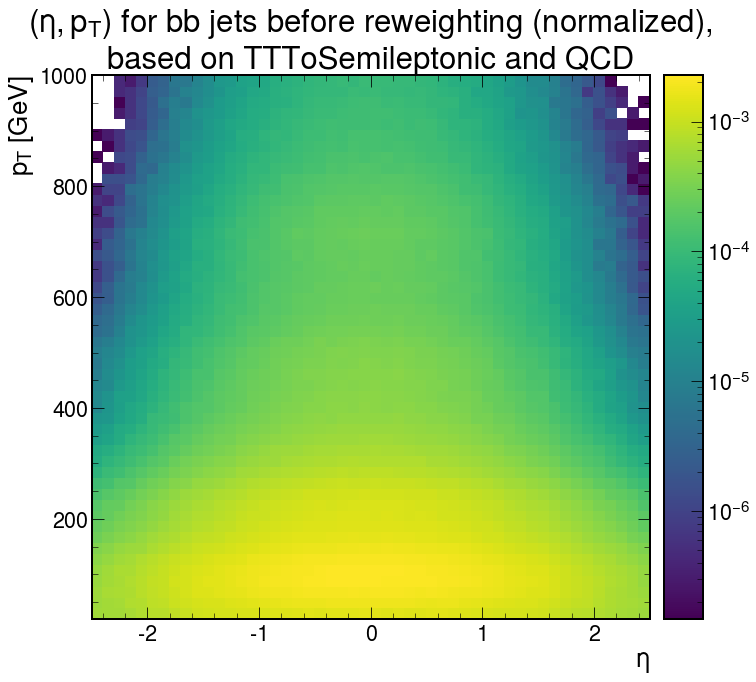

In [459]:
ax = hep.hist2dplot(both_bb_histo/(sum(both_bb_histo.flatten())), eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for bb jets before reweighting (normalized),\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_bb_histo_normalized.png',dpi=400,transparent=False,facecolor='white')

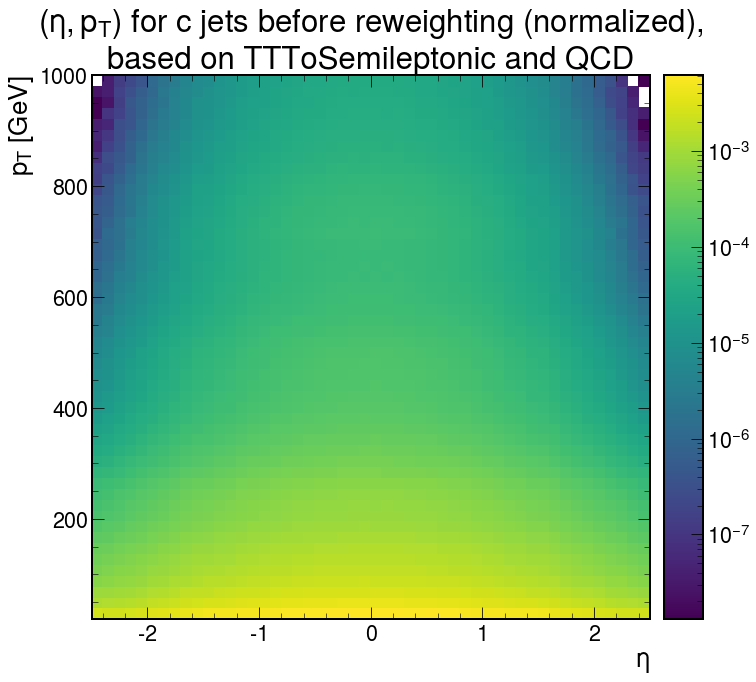

In [460]:
ax = hep.hist2dplot(both_c_histo/(sum(both_c_histo.flatten())), eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for c jets before reweighting (normalized),\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_c_histo_normalized.png',dpi=400,transparent=False,facecolor='white')

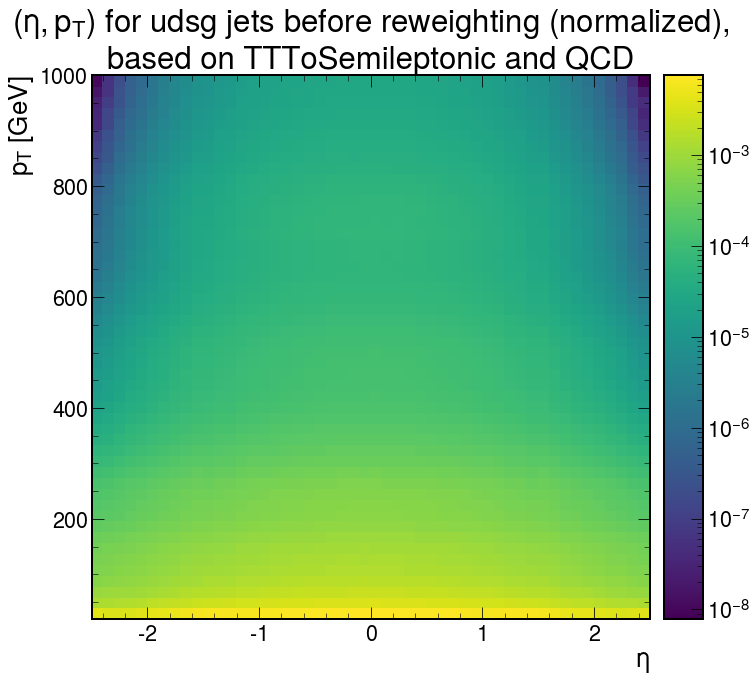

In [461]:
ax = hep.hist2dplot(both_l_histo/(sum(both_l_histo.flatten())), eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$'+' for udsg jets before reweighting (normalized),\nbased on TTToSemileptonic and QCD')
plt.savefig('preparations/both_l_histo_normalized.png',dpi=400,transparent=False,facecolor='white')

In [462]:
np.save('b_norm.npy',both_b_histo/(sum(both_b_histo.flatten())))
np.save('bb_norm.npy',both_bb_histo/(sum(both_bb_histo.flatten())))
np.save('c_norm.npy',both_b_histo/(sum(both_c_histo.flatten())))
np.save('l_norm.npy',both_b_histo/(sum(both_l_histo.flatten())))

In [463]:
average_histo = (both_b_histo/(sum(both_b_histo.flatten())) + both_bb_histo/(sum(both_bb_histo.flatten())) + both_c_histo/(sum(both_c_histo.flatten())) + both_l_histo/(sum(both_l_histo.flatten())))/4
average_histo

array([[2.30735298e-03, 1.19372666e-03, 8.81169615e-04, ...,
        1.29610128e-08, 1.08695294e-08, 2.62846301e-09],
       [2.18912281e-03, 1.26641587e-03, 9.54223437e-04, ...,
        3.20309293e-08, 2.56681936e-08, 2.56681936e-08],
       [2.15914097e-03, 1.34834923e-03, 1.03109914e-03, ...,
        1.39775852e-07, 2.16336151e-07, 1.97701368e-07],
       ...,
       [2.20626945e-03, 1.37341051e-03, 9.96839615e-04, ...,
        2.21921634e-07, 1.75424075e-07, 7.79631349e-08],
       [2.18818582e-03, 1.30593186e-03, 9.26216051e-04, ...,
        3.60007434e-08, 2.89537723e-08, 1.21566414e-08],
       [2.21788665e-03, 1.21252732e-03, 8.48684043e-04, ...,
        4.86161628e-08, 4.92836814e-09, 5.27048577e-09]])

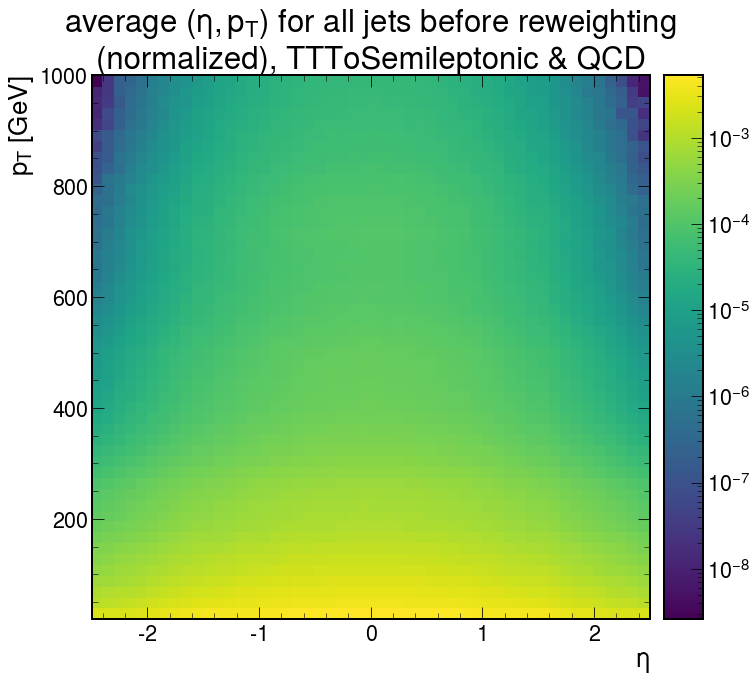

In [464]:
ax = hep.hist2dplot(average_histo, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'average $(\eta, p_T)$'+' for all jets before reweighting\n(normalized), TTToSemileptonic & QCD')
plt.savefig('preparations/average_histo.png',dpi=400,transparent=False,facecolor='white')

In [465]:
np.save('average_histo.npy',average_histo)

In [466]:
b_weights_per_bin = average_histo / (both_b_histo/(sum(both_b_histo.flatten())))
b_weights_per_bin

<ipython-input-466-944173d87318>:1: RuntimeWarning: divide by zero encountered in true_divide
  b_weights_per_bin = average_histo / (both_b_histo/(sum(both_b_histo.flatten())))


array([[ 1.10553153,  0.73768053,  0.72620882, ...,  1.17308719,
                inf,         inf],
       [ 1.0105893 ,  0.71655722,  0.72204298, ...,  2.89908463,
                inf,         inf],
       [ 0.99102147,  0.70981408,  0.70415947, ...,         inf,
                inf, 17.89373613],
       ...,
       [ 0.99776177,  0.71055895,  0.70204156, ...,         inf,
        15.87744247,         inf],
       [ 1.02489299,  0.72277615,  0.71583575, ...,  3.25838818,
                inf,         inf],
       [ 1.12593536,  0.74352663,  0.72850409, ...,         inf,
                inf,         inf]])

In [467]:
bb_weights_per_bin = average_histo / (both_bb_histo/(sum(both_bb_histo.flatten())))
bb_weights_per_bin

<ipython-input-467-ed2c589dc00e>:1: RuntimeWarning: divide by zero encountered in true_divide
  bb_weights_per_bin = average_histo / (both_bb_histo/(sum(both_bb_histo.flatten())))


array([[3.96156802, 2.17601477, 1.57222228, ...,        inf,        inf,
               inf],
       [3.61040383, 2.13783823, 1.48297067, ...,        inf,        inf,
               inf],
       [3.61764822, 2.14599211, 1.52102343, ..., 0.9414636 , 0.48571244,
        0.4438741 ],
       ...,
       [3.5990266 , 2.12658378, 1.56072458, ..., 0.49825283, 0.59078653,
               inf],
       [3.64906613, 2.1038353 , 1.53658878, ...,        inf,        inf,
               inf],
       [3.98895295, 2.13070881, 1.56568933, ..., 0.32745533,        inf,
               inf]])

In [468]:
c_weights_per_bin = average_histo / (both_c_histo/(sum(both_c_histo.flatten())))
c_weights_per_bin

<ipython-input-468-aaf1b54d6bf4>:1: RuntimeWarning: divide by zero encountered in true_divide
  c_weights_per_bin = average_histo / (both_c_histo/(sum(both_c_histo.flatten())))


array([[0.92935984, 0.97076101, 1.03902132, ..., 0.98215131, 0.41183211,
               inf],
       [0.90378403, 0.98418231, 1.05946566, ..., 1.2136096 , 0.64835596,
        0.64835596],
       [0.89104187, 0.97543932, 1.05301844, ..., 0.96289498, 1.26102938,
        1.49812874],
       ...,
       [0.89719585, 0.97691251, 1.04226109, ..., 1.29358732, 0.94951235,
        0.8439772 ],
       [0.907491  , 0.98088063, 1.04700836, ..., 0.6820103 , 0.73134679,
               inf],
       [0.93401425, 0.97402914, 1.03871555, ...,        inf,        inf,
        0.39938349]])

In [469]:
l_weights_per_bin = average_histo / (both_l_histo/(sum(both_l_histo.flatten())))
l_weights_per_bin

array([[0.56592361, 0.86600761, 0.97608679, ..., 0.46962128, 0.63620271,
        0.25      ],
       [0.61461229, 0.89237599, 1.00316328, ..., 0.35322267, 0.40689485,
        0.40689485],
       [0.62804771, 0.9090774 , 1.02799846, ..., 0.52651276, 0.8709544 ,
        0.97682571],
       ...,
       [0.62292876, 0.91009503, 1.02521793, ..., 0.81971059, 0.83949902,
        0.35522289],
       [0.60668334, 0.89155854, 1.00287115, ..., 0.44906557, 0.37984402,
        0.25      ],
       [0.55850018, 0.86276249, 0.97475357, ..., 1.0569167 , 0.25      ,
        0.66838627]])

In [470]:
allmin = min(min(b_weights_per_bin.flatten()),min(bb_weights_per_bin.flatten()),min(c_weights_per_bin.flatten()),min(l_weights_per_bin.flatten()))
allmax = max(max(b_weights_per_bin.flatten()),max(bb_weights_per_bin.flatten()),max(c_weights_per_bin.flatten()),max(l_weights_per_bin.flatten()))

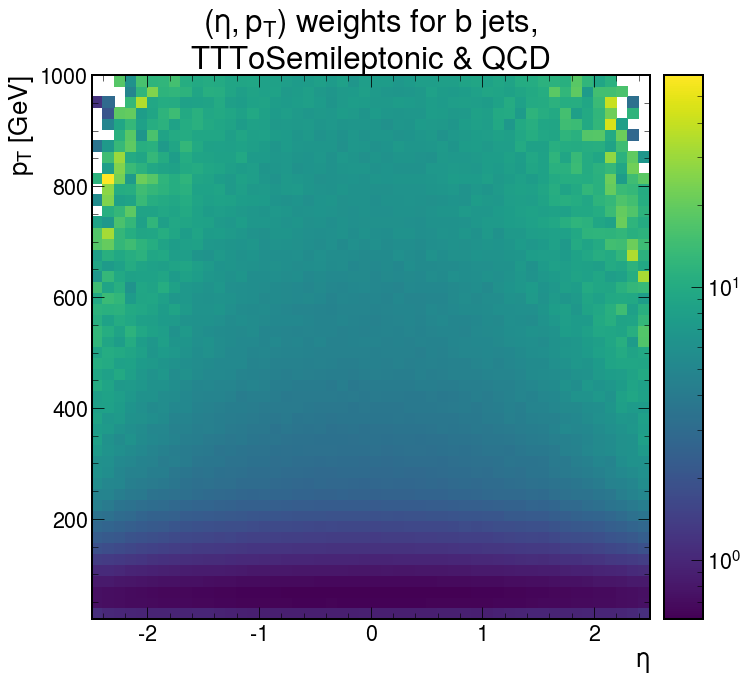

In [471]:
ax = hep.hist2dplot(b_weights_per_bin, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ weights'+' for b jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/b_weights_per_bin.png',dpi=400,transparent=False,facecolor='white')

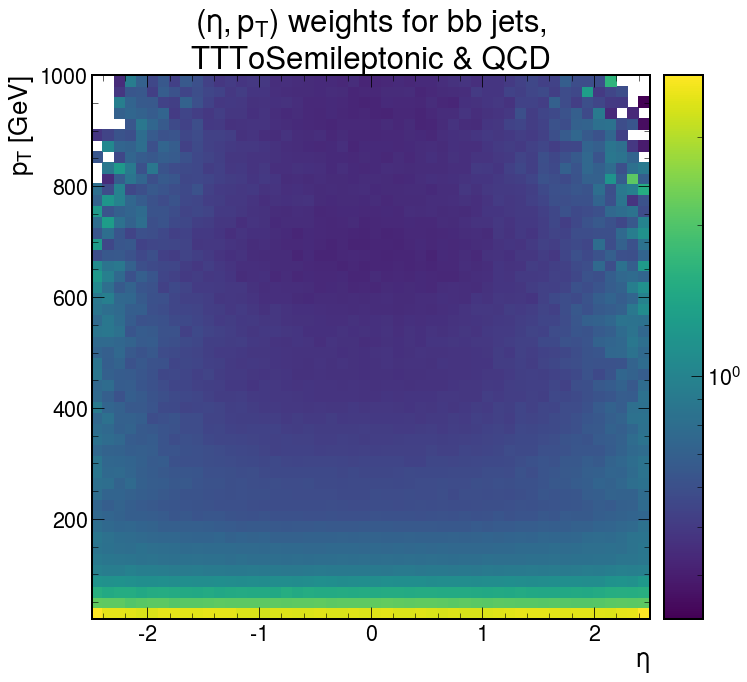

In [472]:
ax = hep.hist2dplot(bb_weights_per_bin, eta_edges, pt_edges, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ weights'+' for bb jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/bb_weights_per_bin.png',dpi=400,transparent=False,facecolor='white')

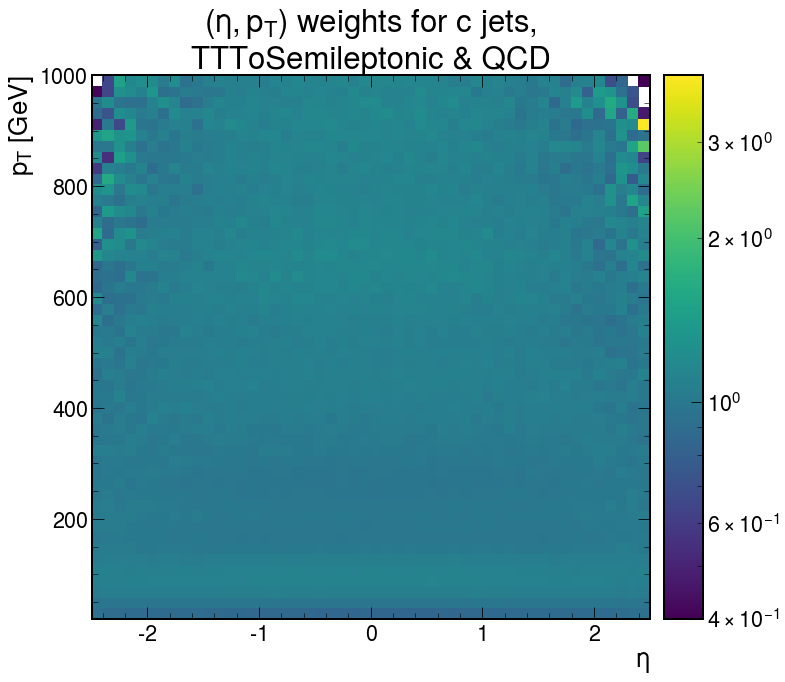

In [473]:
ax = hep.hist2dplot(c_weights_per_bin, eta_edges, pt_edges, norm=LogNorm(),cmin=allmin,cmax=allmax)
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ weights'+' for c jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/c_weights_per_bin.png',dpi=400,transparent=False,facecolor='white')

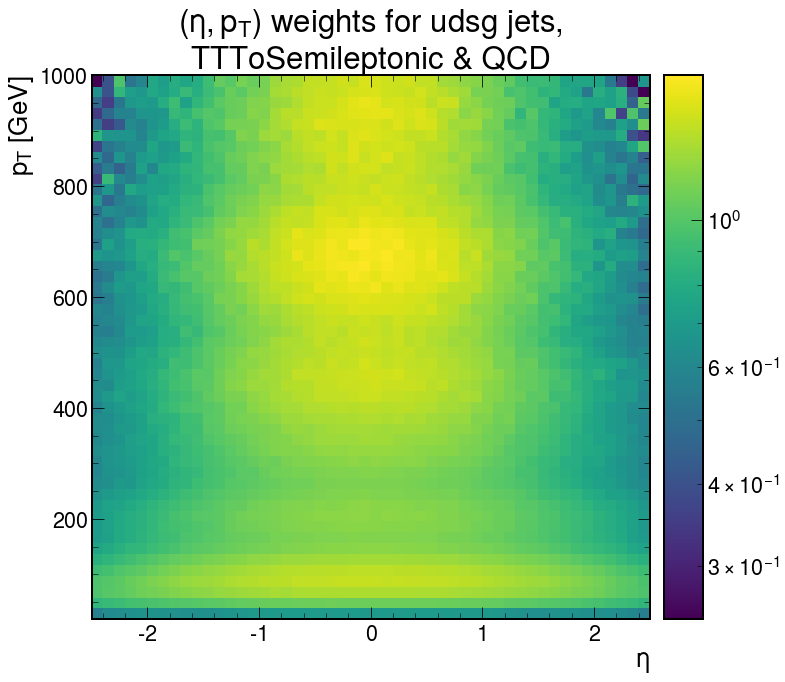

In [474]:
ax = hep.hist2dplot(l_weights_per_bin, eta_edges, pt_edges,cmin=allmin,cmax=allmax, norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ weights'+' for udsg jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/l_weights_per_bin.png',dpi=400,transparent=False,facecolor='white')

In [475]:
np.save('b_weights_per_bin.npy',b_weights_per_bin)
np.save('bb_weights_per_bin.npy',bb_weights_per_bin)
np.save('c_weights_per_bin.npy',c_weights_per_bin)
np.save('l_weights_per_bin.npy',l_weights_per_bin)

In [476]:
b_relative_reweighted = b_weights_per_bin * both_b_histo
b_relative_reweighted

<ipython-input-476-567ef05f7f58>:1: RuntimeWarning: invalid value encountered in multiply
  b_relative_reweighted = b_weights_per_bin * both_b_histo


array([[2.08836012e+05, 1.08042904e+05, 7.97537049e+04, ...,
        1.17308719e+00,            nan,            nan],
       [1.98135129e+05, 1.14621925e+05, 8.63657270e+04, ...,
        2.89908463e+00,            nan,            nan],
       [1.95421505e+05, 1.22037625e+05, 9.33236633e+04, ...,
                   nan,            nan, 1.78937361e+01],
       ...,
       [1.99687052e+05, 1.24305894e+05, 9.02228709e+04, ...,
                   nan, 1.58774425e+01,            nan],
       [1.98050322e+05, 1.18198474e+05, 8.38308089e+04, ...,
        3.25838818e+00,            nan,            nan],
       [2.00738512e+05, 1.09744531e+05, 7.68134710e+04, ...,
                   nan,            nan,            nan]])

In [477]:
bb_relative_reweighted = bb_weights_per_bin * both_bb_histo
bb_relative_reweighted

<ipython-input-477-abeb92097194>:1: RuntimeWarning: invalid value encountered in multiply
  bb_relative_reweighted = bb_weights_per_bin * both_bb_histo


array([[1.55412314e+04, 8.04037456e+03, 5.93513909e+03, ...,
                   nan,            nan,            nan],
       [1.47448893e+04, 8.52997452e+03, 6.42719486e+03, ...,
                   nan,            nan,            nan],
       [1.45429459e+04, 9.08183860e+03, 6.94499300e+03, ...,
        9.41463604e-01, 1.45713733e+00, 1.33162231e+00],
       ...,
       [1.48603808e+04, 9.25063946e+03, 6.71423715e+03, ...,
        1.49475849e+00, 1.18157306e+00,            nan],
       [1.47385781e+04, 8.79613537e+03, 6.23855044e+03, ...,
                   nan,            nan,            nan],
       [1.49386288e+04, 8.16700685e+03, 5.71633174e+03, ...,
        3.27455331e-01,            nan,            nan]])

In [478]:
c_relative_reweighted = c_weights_per_bin * both_c_histo
c_relative_reweighted

<ipython-input-478-1bb43b7c169c>:1: RuntimeWarning: invalid value encountered in multiply
  c_relative_reweighted = c_weights_per_bin * both_c_histo


array([[1.74845113e+05, 9.04574524e+04, 6.67727054e+04, ...,
        9.82151306e-01, 8.23664221e-01,            nan],
       [1.65885943e+05, 9.59656491e+04, 7.23085310e+04, ...,
        2.42721920e+00, 1.94506789e+00, 1.94506789e+00],
       [1.63613999e+05, 1.02174342e+05, 7.81339686e+04, ...,
        1.05918448e+01, 1.63933819e+01, 1.49812874e+01],
       ...,
       [1.67185270e+05, 1.04073420e+05, 7.55378723e+04, ...,
        1.68166351e+01, 1.32931729e+01, 5.90784038e+00],
       [1.65814940e+05, 9.89600659e+04, 7.01862053e+04, ...,
        2.72804122e+00, 2.19404037e+00,            nan],
       [1.68065591e+05, 9.18821167e+04, 6.43110345e+04, ...,
                   nan,            nan, 3.99383487e-01]])

In [479]:
l_relative_reweighted = l_weights_per_bin * both_l_histo
l_relative_reweighted

array([[1.75566707e+06, 9.08307749e+05, 6.70482797e+05, ...,
        9.86204694e+00, 8.27063525e+00, 2.00000000e+00],
       [1.66570563e+06, 9.63617042e+05, 7.26069520e+05, ...,
        2.43723646e+01, 1.95309529e+01, 1.95309529e+01],
       [1.64289242e+06, 1.02596021e+06, 7.84564315e+05, ...,
        1.06355578e+02, 1.64610382e+02, 1.50431159e+02],
       ...,
       [1.67875252e+06, 1.04502936e+06, 7.58496210e+05, ...,
        1.68860382e+02, 1.33480345e+02, 5.93222234e+01],
       [1.66499267e+06, 9.93684791e+05, 7.04758673e+05, ...,
        2.73929998e+01, 2.20309529e+01, 9.25000000e+00],
       [1.68759206e+06, 9.22613188e+05, 6.45764494e+05, ...,
        3.69920844e+01, 3.75000000e+00, 4.01031763e+00]])

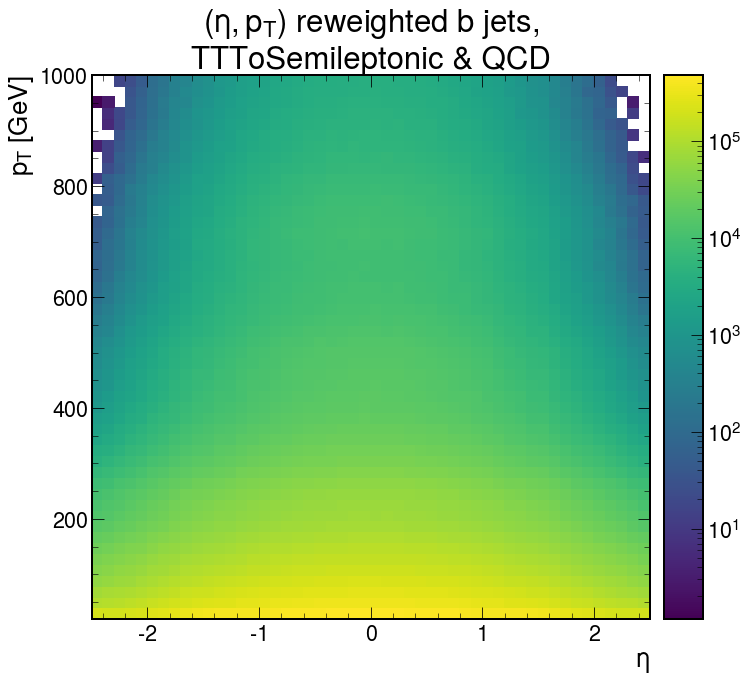

In [480]:
ax = hep.hist2dplot(b_relative_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' b jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/b_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

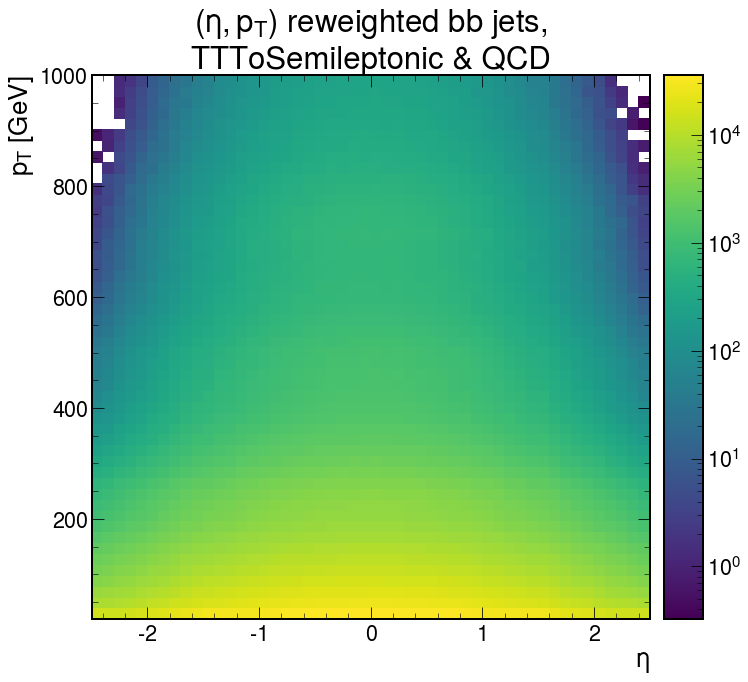

In [481]:
ax = hep.hist2dplot(bb_relative_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' bb jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/bb_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

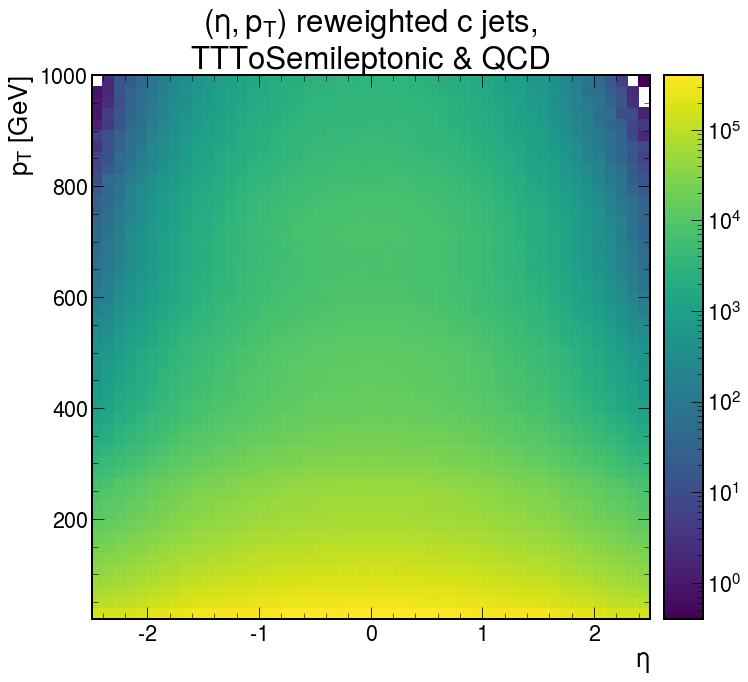

In [482]:
ax = hep.hist2dplot(c_relative_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' c jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/c_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

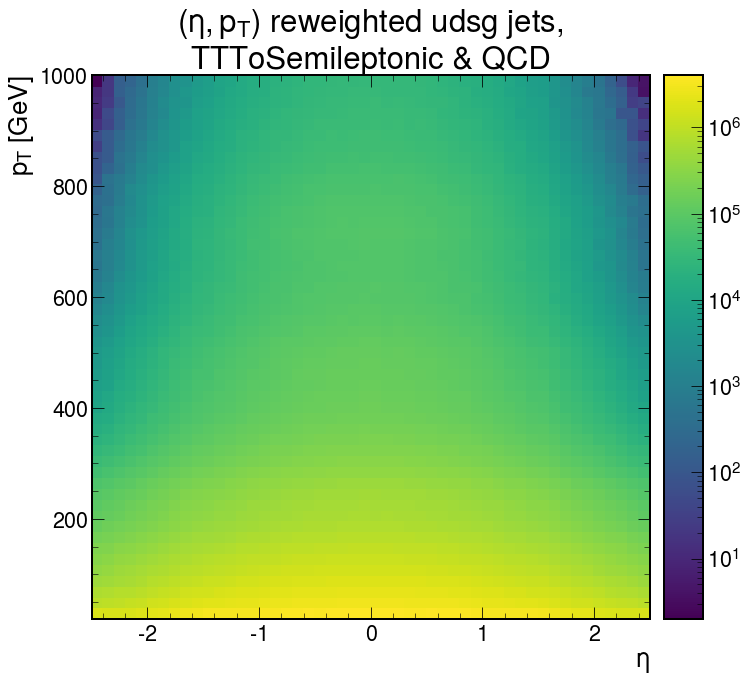

In [483]:
ax = hep.hist2dplot(l_relative_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' udsg jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/l_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

In [484]:
np.save('b_relative_reweighted.npy',b_relative_reweighted)
np.save('bb_relative_reweighted.npy',bb_relative_reweighted)
np.save('c_relative_reweighted.npy',c_relative_reweighted)
np.save('l_relative_reweighted.npy',l_relative_reweighted)

In [518]:
b_absolute_reweighted = b_weights_per_bin * both_b_histo * factor_b
b_absolute_reweighted

<ipython-input-518-b8b93ed33ae5>:1: RuntimeWarning: invalid value encountered in multiply
  b_absolute_reweighted = b_weights_per_bin * both_b_histo * factor_b


array([[2.15488943e+06, 1.11484848e+06, 8.22944347e+05, ...,
        1.21045846e+01,            nan,            nan],
       [2.04447159e+06, 1.18273459e+06, 8.91170973e+05, ...,
        2.99144135e+01,            nan,            nan],
       [2.01647087e+06, 1.25925402e+06, 9.62966939e+05, ...,
                   nan,            nan, 1.84637805e+02],
       ...,
       [2.06048522e+06, 1.28265932e+06, 9.30971190e+05, ...,
                   nan, 1.63832533e+02,            nan],
       [2.04359651e+06, 1.21963947e+06, 8.65014237e+05, ...,
        3.36219131e+01,            nan,            nan],
       [2.07133479e+06, 1.13240684e+06, 7.92605332e+05, ...,
                   nan,            nan,            nan]])

In [519]:
bb_absolute_reweighted = bb_weights_per_bin * both_bb_histo * factor_bb
bb_absolute_reweighted

<ipython-input-519-d34b41b3cc14>:1: RuntimeWarning: invalid value encountered in multiply
  bb_absolute_reweighted = bb_weights_per_bin * both_bb_histo * factor_bb


array([[2.15488943e+06, 1.11484848e+06, 8.22944347e+05, ...,
                   nan,            nan,            nan],
       [2.04447159e+06, 1.18273459e+06, 8.91170973e+05, ...,
                   nan,            nan,            nan],
       [2.01647087e+06, 1.25925402e+06, 9.62966939e+05, ...,
        1.30539847e+02, 2.02041252e+02, 1.84637805e+02],
       ...,
       [2.06048522e+06, 1.28265932e+06, 9.30971190e+05, ...,
        2.07257662e+02, 1.63832533e+02,            nan],
       [2.04359651e+06, 1.21963947e+06, 8.65014237e+05, ...,
                   nan,            nan,            nan],
       [2.07133479e+06, 1.13240684e+06, 7.92605332e+05, ...,
        4.54037402e+01,            nan,            nan]])

In [520]:
c_absolute_reweighted = c_weights_per_bin * both_c_histo * factor_c
c_absolute_reweighted

<ipython-input-520-cbab2dca5b0f>:1: RuntimeWarning: invalid value encountered in multiply
  c_absolute_reweighted = c_weights_per_bin * both_c_histo * factor_c


array([[2.15488943e+06, 1.11484848e+06, 8.22944347e+05, ...,
        1.21045846e+01, 1.01513008e+01,            nan],
       [2.04447159e+06, 1.18273459e+06, 8.91170973e+05, ...,
        2.99144135e+01, 2.39721098e+01, 2.39721098e+01],
       [2.01647087e+06, 1.25925402e+06, 9.62966939e+05, ...,
        1.30539847e+02, 2.02041252e+02, 1.84637805e+02],
       ...,
       [2.06048522e+06, 1.28265932e+06, 9.30971190e+05, ...,
        2.07257662e+02, 1.63832533e+02, 7.28115450e+01],
       [2.04359651e+06, 1.21963947e+06, 8.65014237e+05, ...,
        3.36219131e+01, 2.70405866e+01,            nan],
       [2.07133479e+06, 1.13240684e+06, 7.92605332e+05, ...,
                   nan,            nan, 4.92222654e+00]])

In [521]:
l_absolute_reweighted = l_weights_per_bin * both_l_histo * factor_l
l_absolute_reweighted

array([[2.15488943e+06, 1.11484848e+06, 8.22944347e+05, ...,
        1.21045846e+01, 1.01513008e+01, 2.45478139e+00],
       [2.04447159e+06, 1.18273459e+06, 8.91170973e+05, ...,
        2.99144135e+01, 2.39721098e+01, 2.39721098e+01],
       [2.01647087e+06, 1.25925402e+06, 9.62966939e+05, ...,
        1.30539847e+02, 2.02041252e+02, 1.84637805e+02],
       ...,
       [2.06048522e+06, 1.28265932e+06, 9.30971190e+05, ...,
        2.07257662e+02, 1.63832533e+02, 7.28115450e+01],
       [2.04359651e+06, 1.21963947e+06, 8.65014237e+05, ...,
        3.36219131e+01, 2.70405866e+01, 1.13533639e+01],
       [2.07133479e+06, 1.13240684e+06, 7.92605332e+05, ...,
        4.54037402e+01, 4.60271511e+00, 4.92222654e+00]])

In [552]:
norm_factors = (factor_b+factor_bb+factor_c+factor_l)
normed_factor_b = factor_b / norm_factors
normed_factor_bb = factor_bb / norm_factors
normed_factor_c = factor_c / norm_factors
normed_factor_l = factor_l / norm_factors

In [557]:
absweights_b = b_weights_per_bin * normed_factor_b
absweights_bb = bb_weights_per_bin * normed_factor_bb
absweights_c = c_weights_per_bin * normed_factor_c
absweights_l = l_weights_per_bin * normed_factor_l

In [558]:
absweights_b

array([[0.07018846, 0.04683418, 0.04610586, ..., 0.07447746,        inf,
               inf],
       [0.06416073, 0.04549309, 0.04584137, ..., 0.18405833,        inf,
               inf],
       [0.0629184 , 0.04506498, 0.04470598, ...,        inf,        inf,
        1.13604521],
       ...,
       [0.06334633, 0.04511227, 0.04457152, ...,        inf, 1.00803389,
               inf],
       [0.06506885, 0.04588792, 0.04544729, ..., 0.20686995,        inf,
               inf],
       [0.07148387, 0.04720534, 0.04625158, ...,        inf,        inf,
               inf]])

In [562]:
absweights_bb

array([[3.37972736, 1.85642064, 1.34130794, ...,        inf,        inf,
               inf],
       [3.08013911, 1.82385114, 1.26516483, ...,        inf,        inf,
               inf],
       [3.08631951, 1.83080745, 1.29762874, ..., 0.80318962, 0.41437522,
        0.37868174],
       ...,
       [3.07043287, 1.81424965, 1.33149893, ..., 0.42507379, 0.50401694,
               inf],
       [3.11312303, 1.79484226, 1.31090798, ...,        inf,        inf,
               inf],
       [3.40309023, 1.81776883, 1.3357345 , ..., 0.27936154,        inf,
               inf]])

In [563]:
absweights_c

array([[0.07047424, 0.07361373, 0.07878997, ..., 0.07447746, 0.03122962,
               inf],
       [0.0685348 , 0.07463148, 0.08034028, ..., 0.09202917, 0.04916545,
        0.04916545],
       [0.06756855, 0.07396849, 0.07985139, ..., 0.07301724, 0.09562505,
        0.11360452],
       ...,
       [0.06803521, 0.0740802 , 0.07903565, ..., 0.09809395, 0.07200242,
        0.06399959],
       [0.0688159 , 0.07438111, 0.07939564, ..., 0.05171749, 0.05545872,
               inf],
       [0.07082719, 0.07386155, 0.07876678, ...,        inf,        inf,
        0.03028563]])

In [564]:
absweights_l

array([[0.00427381, 0.00654003, 0.00737134, ..., 0.00354655, 0.00480456,
        0.00188798],
       [0.00464151, 0.00673916, 0.00757582, ..., 0.00266751, 0.00307284,
        0.00307284],
       [0.00474297, 0.00686529, 0.00776337, ..., 0.00397619, 0.00657738,
        0.00737692],
       ...,
       [0.00470431, 0.00687297, 0.00774237, ..., 0.00619039, 0.00633984,
        0.00268262],
       [0.00458163, 0.00673299, 0.00757361, ..., 0.00339131, 0.00286855,
        0.00188798],
       [0.00421775, 0.00651552, 0.00736127, ..., 0.00798176, 0.00188798,
        0.0050476 ]])

In [559]:
#norm_abs_weights = sum(np.nan_to_num(absweights_b).flatten()+np.nan_to_num(absweights_bb).flatten()+np.nan_to_num(absweights_c).flatten()+np.nan_to_num(absweights_l).flatten())

<ipython-input-559-eb7d005e5562>:1: RuntimeWarning: overflow encountered in add
  norm_abs_weights = sum(np.nan_to_num(absweights_b).flatten()+np.nan_to_num(absweights_bb).flatten()+np.nan_to_num(absweights_c).flatten()+np.nan_to_num(absweights_l).flatten())
<ipython-input-559-eb7d005e5562>:1: RuntimeWarning: overflow encountered in double_scalars
  norm_abs_weights = sum(np.nan_to_num(absweights_b).flatten()+np.nan_to_num(absweights_bb).flatten()+np.nan_to_num(absweights_c).flatten()+np.nan_to_num(absweights_l).flatten())


In [560]:
#norm_abs_weights

inf

In [537]:
#normalized_absweights_b = np.nan_to_num(absweights_b  / norm_abs_weights)
#normalized_absweights_bb =np.nan_to_num(absweights_bb / norm_abs_weights)
#normalized_absweights_c = np.nan_to_num(absweights_c  / norm_abs_weights)
#normalized_absweights_l = np.nan_to_num(absweights_l  / norm_abs_weights)

<ipython-input-537-4d466fb4d1b8>:1: RuntimeWarning: invalid value encountered in true_divide
  normalized_absweights_b = np.nan_to_num(absweights_b  / norm_abs_weights)
<ipython-input-537-4d466fb4d1b8>:2: RuntimeWarning: invalid value encountered in true_divide
  normalized_absweights_bb =np.nan_to_num(absweights_bb / norm_abs_weights)
<ipython-input-537-4d466fb4d1b8>:3: RuntimeWarning: invalid value encountered in true_divide
  normalized_absweights_c = np.nan_to_num(absweights_c  / norm_abs_weights)


In [541]:
#b_weights_per_bin

array([[ 1.10553153,  0.73768053,  0.72620882, ...,  1.17308719,
                inf,         inf],
       [ 1.0105893 ,  0.71655722,  0.72204298, ...,  2.89908463,
                inf,         inf],
       [ 0.99102147,  0.70981408,  0.70415947, ...,         inf,
                inf, 17.89373613],
       ...,
       [ 0.99776177,  0.71055895,  0.70204156, ...,         inf,
        15.87744247,         inf],
       [ 1.02489299,  0.72277615,  0.71583575, ...,  3.25838818,
                inf,         inf],
       [ 1.12593536,  0.74352663,  0.72850409, ...,         inf,
                inf,         inf]])

In [571]:
np.save('absweights_b.npy',absweights_b)
np.save('absweights_bb.npy',absweights_bb)
np.save('absweights_c.npy',absweights_c)
np.save('absweights_l.npy',absweights_l)

In [572]:
new_b_reweighted = both_b_histo * absweights_b
new_bb_reweighted = both_bb_histo * absweights_bb
new_c_reweighted = both_c_histo * absweights_c
new_l_reweighted = both_l_histo * absweights_l

<ipython-input-572-d8493115df92>:1: RuntimeWarning: invalid value encountered in multiply
  new_b_reweighted = both_b_histo * absweights_b
<ipython-input-572-d8493115df92>:2: RuntimeWarning: invalid value encountered in multiply
  new_bb_reweighted = both_bb_histo * absweights_bb
<ipython-input-572-d8493115df92>:3: RuntimeWarning: invalid value encountered in multiply
  new_c_reweighted = both_c_histo * absweights_c


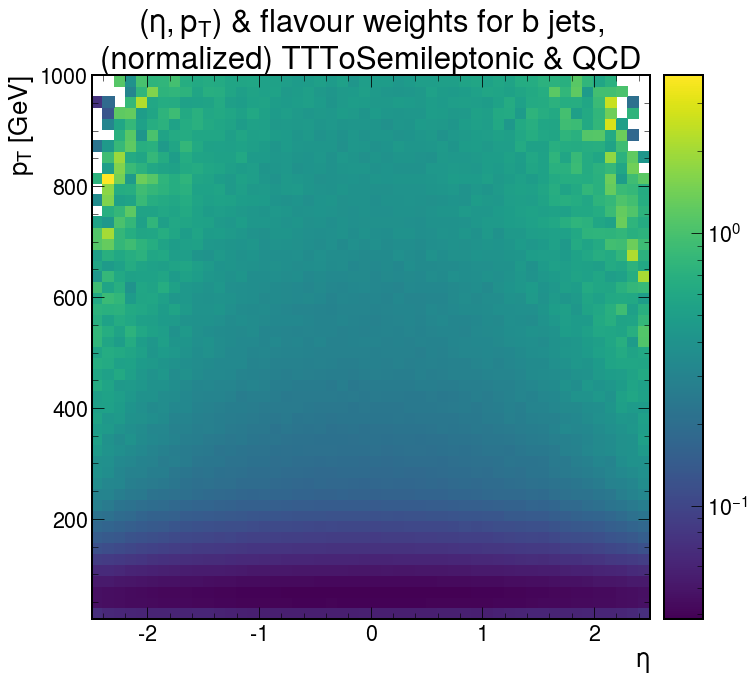

In [617]:
ax = hep.hist2dplot(absweights_b, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' for b jets,\n(normalized) TTToSemileptonic & QCD')
plt.savefig('preparations/b_norm_abs_weights.png',dpi=400,transparent=False,facecolor='white')

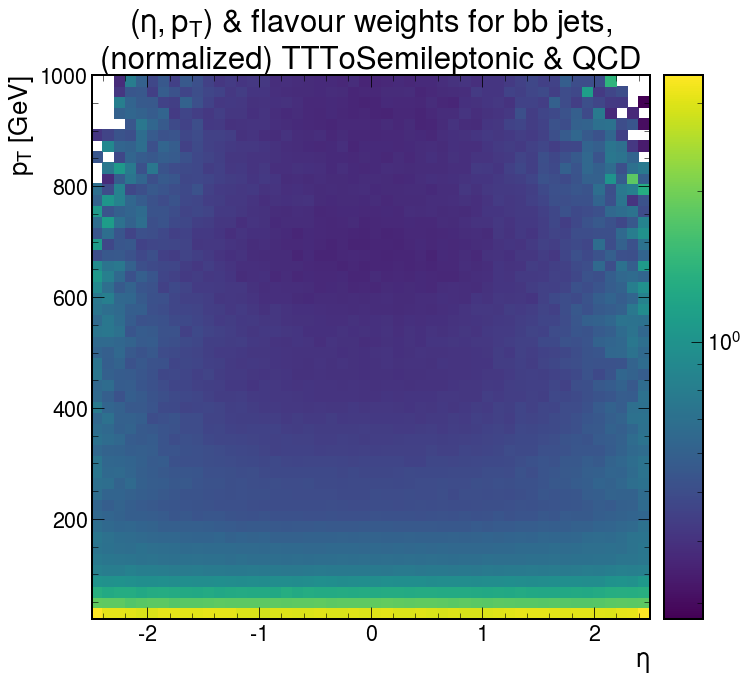

In [618]:
ax = hep.hist2dplot(absweights_bb, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' for bb jets,\n(normalized) TTToSemileptonic & QCD')
plt.savefig('preparations/bb_norm_abs_weights.png',dpi=400,transparent=False,facecolor='white')

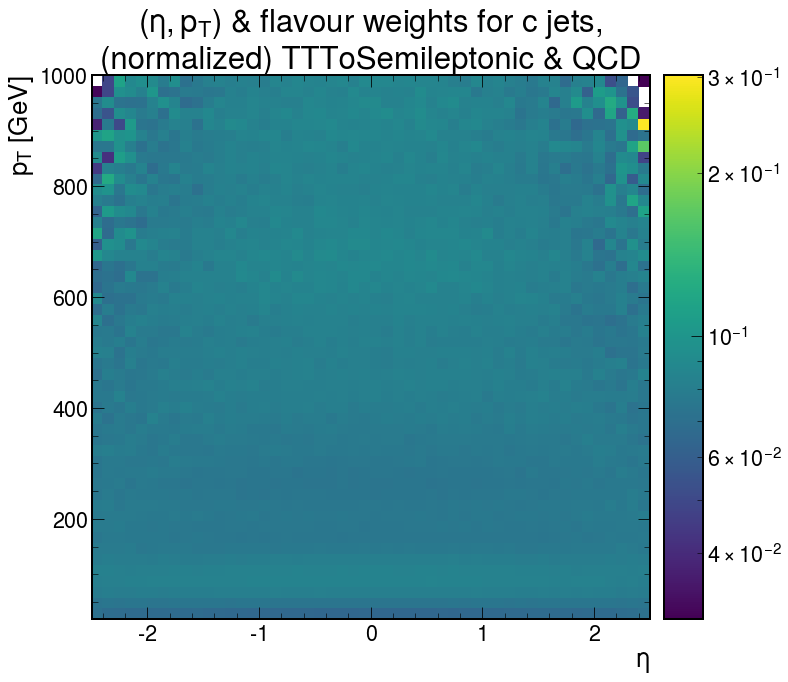

In [619]:
ax = hep.hist2dplot(absweights_c, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' for c jets,\n(normalized) TTToSemileptonic & QCD')
plt.savefig('preparations/c_norm_abs_weights.png',dpi=400,transparent=False,facecolor='white')

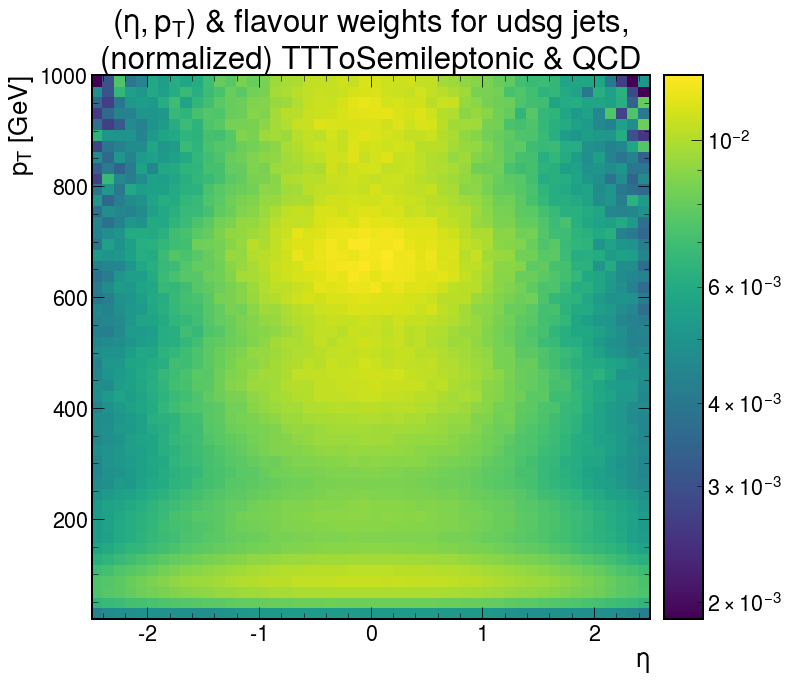

In [620]:
ax = hep.hist2dplot(absweights_l, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' for udsg jets,\n(normalized) TTToSemileptonic & QCD')
plt.savefig('preparations/l_norm_abs_weights.png',dpi=400,transparent=False,facecolor='white')

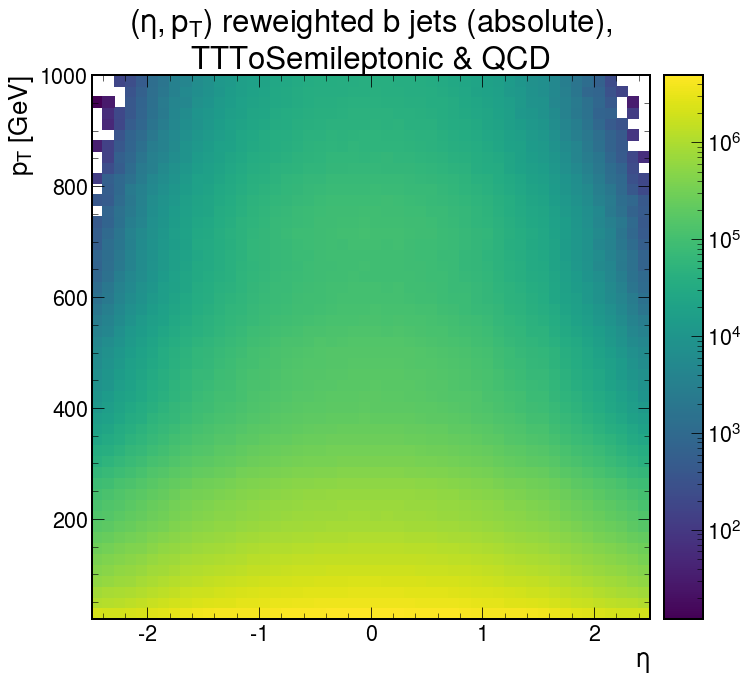

In [522]:
ax = hep.hist2dplot(b_absolute_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' b jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/b_absolute_reweighted.png',dpi=400,transparent=False,facecolor='white')

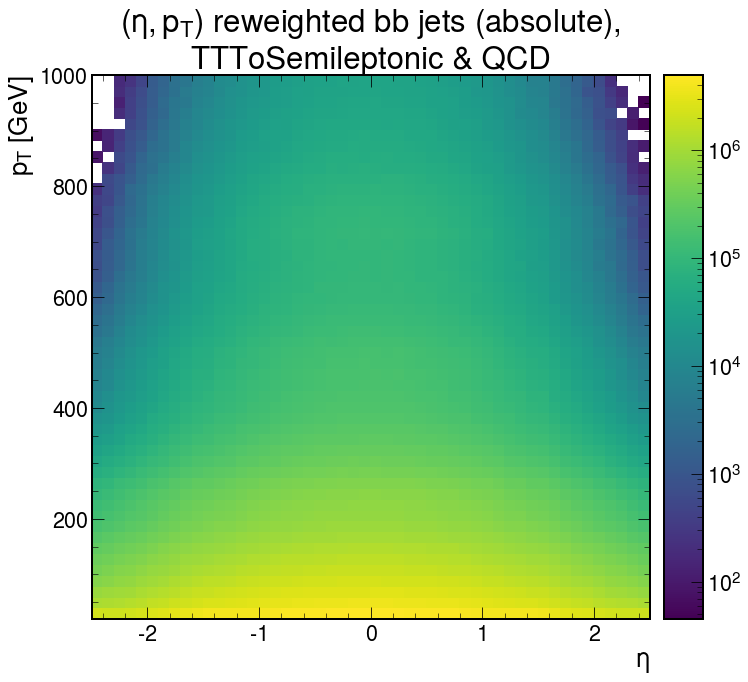

In [523]:
ax = hep.hist2dplot(bb_absolute_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' bb jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/bb_absolute_reweighted.png',dpi=400,transparent=False,facecolor='white')

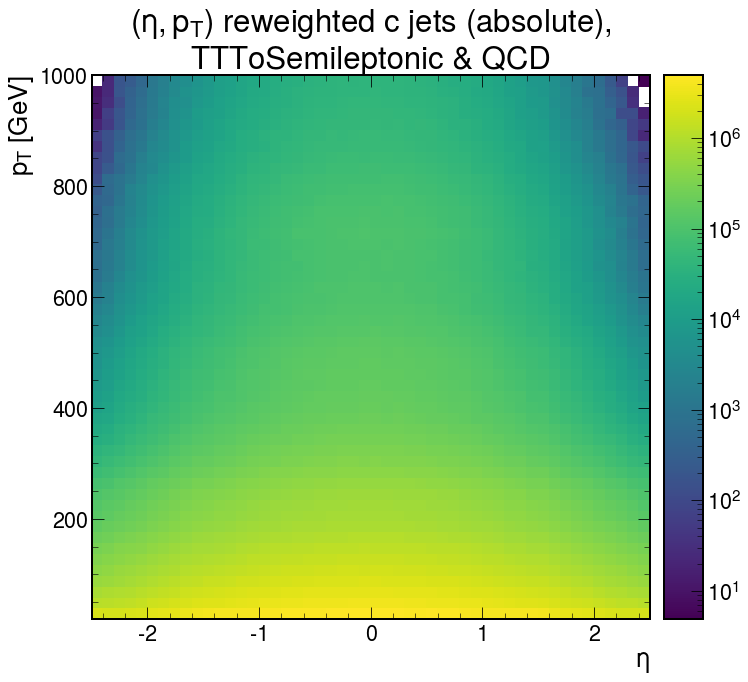

In [525]:
ax = hep.hist2dplot(c_absolute_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' c jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/c_absolute_reweighted.png',dpi=400,transparent=False,facecolor='white')

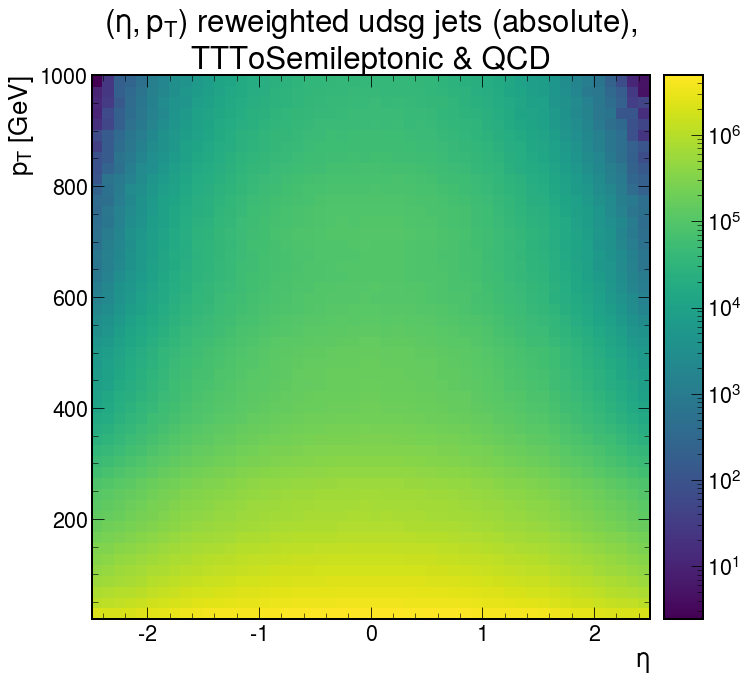

In [526]:
ax = hep.hist2dplot(l_absolute_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ reweighted'+' udsg jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/l_absolute_reweighted.png',dpi=400,transparent=False,facecolor='white')

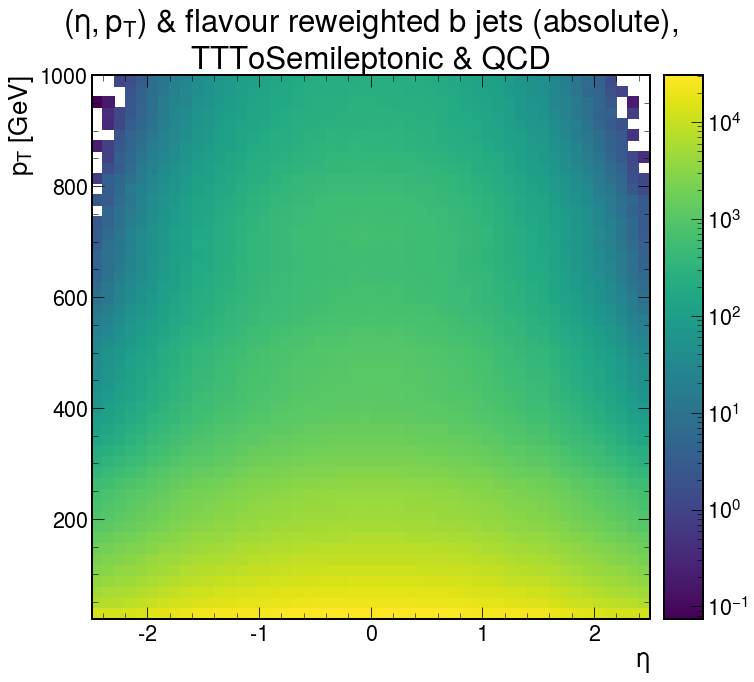

In [607]:
ax = hep.hist2dplot(new_b_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour reweighted'+' b jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/new_b_reweighted.png',dpi=400,transparent=False,facecolor='white')

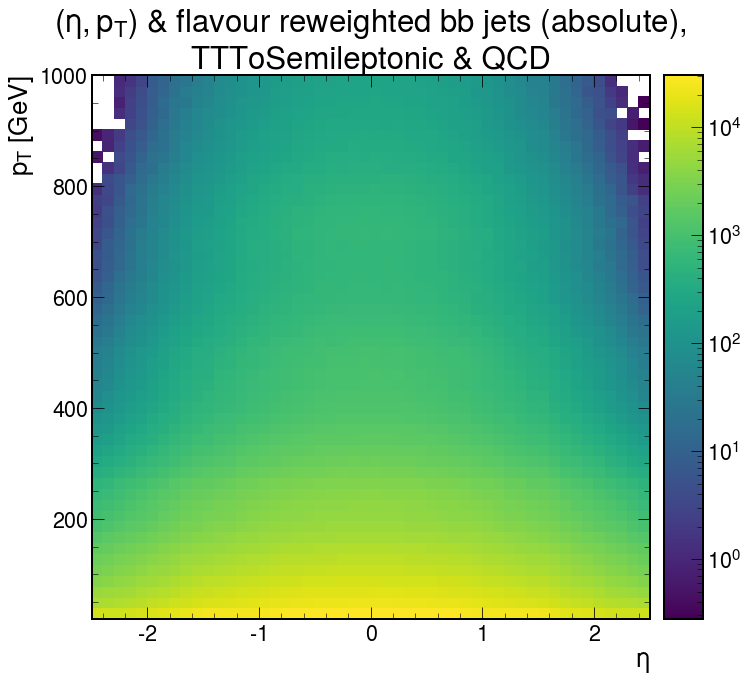

In [608]:
ax = hep.hist2dplot(new_bb_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour reweighted'+' bb jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/new_bb_reweighted.png',dpi=400,transparent=False,facecolor='white')

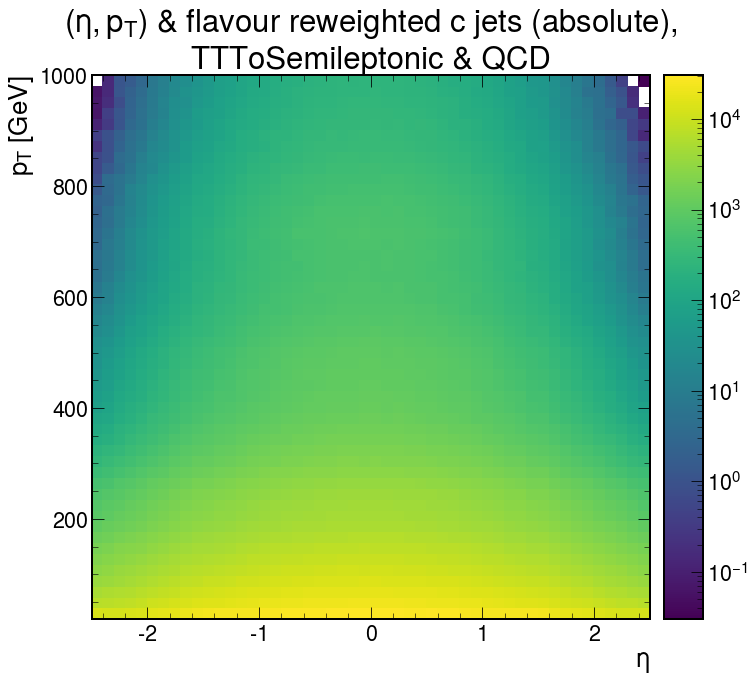

In [609]:
ax = hep.hist2dplot(new_c_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour reweighted'+' c jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/new_c_reweighted.png',dpi=400,transparent=False,facecolor='white')

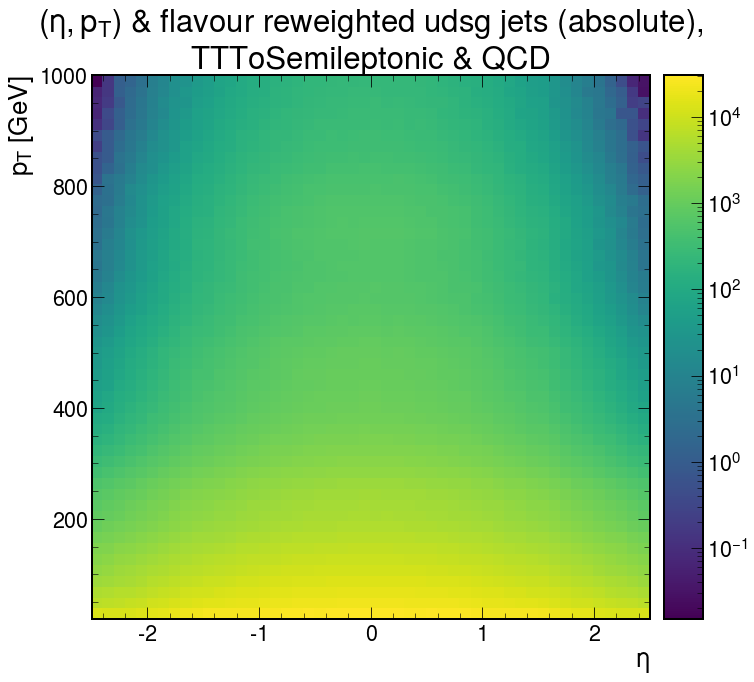

In [610]:
ax = hep.hist2dplot(new_l_reweighted, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour reweighted'+' udsg jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/new_l_reweighted.png',dpi=400,transparent=False,facecolor='white')

In [577]:
np.save('new_b_reweighted.npy',new_b_reweighted)
np.save('new_bb_reweighted.npy',new_bb_reweighted)
np.save('new_c_reweighted.npy',new_c_reweighted)
np.save('new_l_reweighted.npy',new_l_reweighted)

In [485]:
np.nan_to_num(b_relative_reweighted)

array([[2.08836012e+05, 1.08042904e+05, 7.97537049e+04, ...,
        1.17308719e+00, 0.00000000e+00, 0.00000000e+00],
       [1.98135129e+05, 1.14621925e+05, 8.63657270e+04, ...,
        2.89908463e+00, 0.00000000e+00, 0.00000000e+00],
       [1.95421505e+05, 1.22037625e+05, 9.33236633e+04, ...,
        0.00000000e+00, 0.00000000e+00, 1.78937361e+01],
       ...,
       [1.99687052e+05, 1.24305894e+05, 9.02228709e+04, ...,
        0.00000000e+00, 1.58774425e+01, 0.00000000e+00],
       [1.98050322e+05, 1.18198474e+05, 8.38308089e+04, ...,
        3.25838818e+00, 0.00000000e+00, 0.00000000e+00],
       [2.00738512e+05, 1.09744531e+05, 7.68134710e+04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [486]:
np.where(b_relative_reweighted==np.nan,0,np.where(b_relative_reweighted==np.infty,0,b_relative_reweighted))

array([[2.08836012e+05, 1.08042904e+05, 7.97537049e+04, ...,
        1.17308719e+00,            nan,            nan],
       [1.98135129e+05, 1.14621925e+05, 8.63657270e+04, ...,
        2.89908463e+00,            nan,            nan],
       [1.95421505e+05, 1.22037625e+05, 9.33236633e+04, ...,
                   nan,            nan, 1.78937361e+01],
       ...,
       [1.99687052e+05, 1.24305894e+05, 9.02228709e+04, ...,
                   nan, 1.58774425e+01,            nan],
       [1.98050322e+05, 1.18198474e+05, 8.38308089e+04, ...,
        3.25838818e+00,            nan,            nan],
       [2.00738512e+05, 1.09744531e+05, 7.68134710e+04, ...,
                   nan,            nan,            nan]])

In [487]:
pt_marginalb_dist = np.nan_to_num(b_relative_reweighted).sum(axis=0)

eta_marginalb_dist = np.nan_to_num(b_relative_reweighted).sum(axis=1)

In [488]:
pt_marginalbb_dist = np.nan_to_num(bb_relative_reweighted).sum(axis=0)

eta_marginalbb_dist = np.nan_to_num(bb_relative_reweighted).sum(axis=1)

In [489]:
pt_marginalc_dist = np.nan_to_num(c_relative_reweighted).sum(axis=0)

eta_marginalc_dist = np.nan_to_num(c_relative_reweighted).sum(axis=1)

In [490]:
pt_marginall_dist = np.nan_to_num(l_relative_reweighted).sum(axis=0)

eta_marginall_dist = np.nan_to_num(l_relative_reweighted).sum(axis=1)

In [491]:
pt_marginalb_dist_before = np.nan_to_num(both_b_histo).sum(axis=0)

eta_marginalb_dist_before = np.nan_to_num(both_b_histo).sum(axis=1)

In [492]:
pt_marginalbb_dist_before = np.nan_to_num(both_bb_histo).sum(axis=0)

eta_marginalbb_dist_before = np.nan_to_num(both_bb_histo).sum(axis=1)

In [493]:
pt_marginalc_dist_before = np.nan_to_num(both_c_histo).sum(axis=0)

eta_marginalc_dist_before = np.nan_to_num(both_c_histo).sum(axis=1)

In [494]:
pt_marginall_dist_before = np.nan_to_num(both_l_histo).sum(axis=0)

eta_marginall_dist_before = np.nan_to_num(both_l_histo).sum(axis=1)

In [527]:
pt_marginalb_dist_absolute = np.nan_to_num(b_absolute_reweighted).sum(axis=0)

eta_marginalb_dist_absolute = np.nan_to_num(b_absolute_reweighted).sum(axis=1)

In [528]:
pt_marginalbb_dist_absolute = np.nan_to_num(bb_absolute_reweighted).sum(axis=0)

eta_marginalbb_dist_absolute = np.nan_to_num(bb_absolute_reweighted).sum(axis=1)

In [529]:
pt_marginalc_dist_absolute = np.nan_to_num(c_absolute_reweighted).sum(axis=0)

eta_marginalc_dist_absolute = np.nan_to_num(c_absolute_reweighted).sum(axis=1)

In [530]:
pt_marginall_dist_absolute = np.nan_to_num(l_absolute_reweighted).sum(axis=0)

eta_marginall_dist_absolute = np.nan_to_num(l_absolute_reweighted).sum(axis=1)

In [611]:
pt_marginalb_dist_ptetaflav_reweighted = np.nan_to_num(new_b_reweighted).sum(axis=0)

eta_marginalb_dist_ptetaflav_reweighted = np.nan_to_num(new_b_reweighted).sum(axis=1)

In [612]:
pt_marginalbb_dist_ptetaflav_reweighted = np.nan_to_num(new_bb_reweighted).sum(axis=0)

eta_marginalbb_dist_ptetaflav_reweighted = np.nan_to_num(new_bb_reweighted).sum(axis=1)

In [613]:
pt_marginalc_dist_ptetaflav_reweighted = np.nan_to_num(new_c_reweighted).sum(axis=0)

eta_marginalc_dist_ptetaflav_reweighted = np.nan_to_num(new_c_reweighted).sum(axis=1)

In [614]:
pt_marginall_dist_ptetaflav_reweighted = np.nan_to_num(new_l_reweighted).sum(axis=0)

eta_marginall_dist_ptetaflav_reweighted = np.nan_to_num(new_l_reweighted).sum(axis=1)

(array([0.00737827, 0.00778769, 0.00846739, 0.00916226, 0.01021507,
        0.01174737, 0.01281409, 0.01437051, 0.01609314, 0.01770365,
        0.01876292, 0.01985658, 0.02074156, 0.02222836, 0.02323763,
        0.02434456, 0.02558411, 0.02656796, 0.02740026, 0.0280959 ,
        0.0286083 , 0.02910804, 0.02959475, 0.02989315, 0.03010319,
        0.03001788, 0.02981432, 0.02958215, 0.02897407, 0.02854704,
        0.0281527 , 0.02745143, 0.02675887, 0.02563392, 0.02428586,
        0.02319311, 0.0221931 , 0.02067527, 0.01993202, 0.01879341,
        0.01792444, 0.01604886, 0.01417911, 0.0128147 , 0.01184533,
        0.01040616, 0.00927174, 0.00856047, 0.00782702, 0.00725029]),
 array([-2.5, -2.4, -2.3, -2.2, -2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5,
        -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4,
        -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,
         0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,
         1.9,  2. ,  2

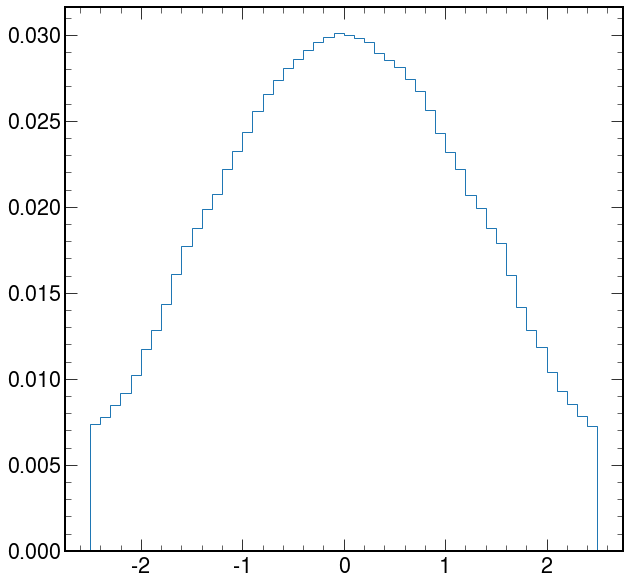

In [495]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist/sum(eta_marginalb_dist),histtype='step',label='b')

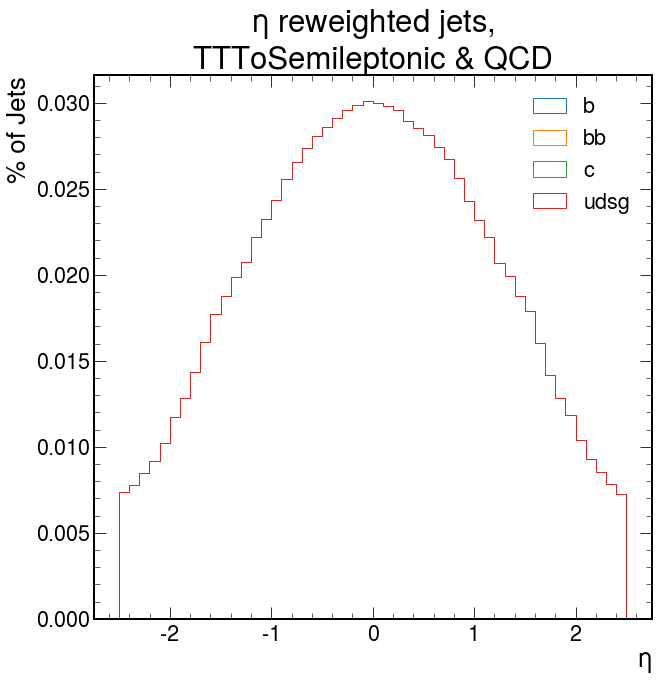

In [496]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist/sum(eta_marginalb_dist),histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist/sum(eta_marginalbb_dist),histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist/sum(eta_marginalc_dist),histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist/sum(eta_marginall_dist),histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'% of Jets')
plt.title(r'$\eta$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

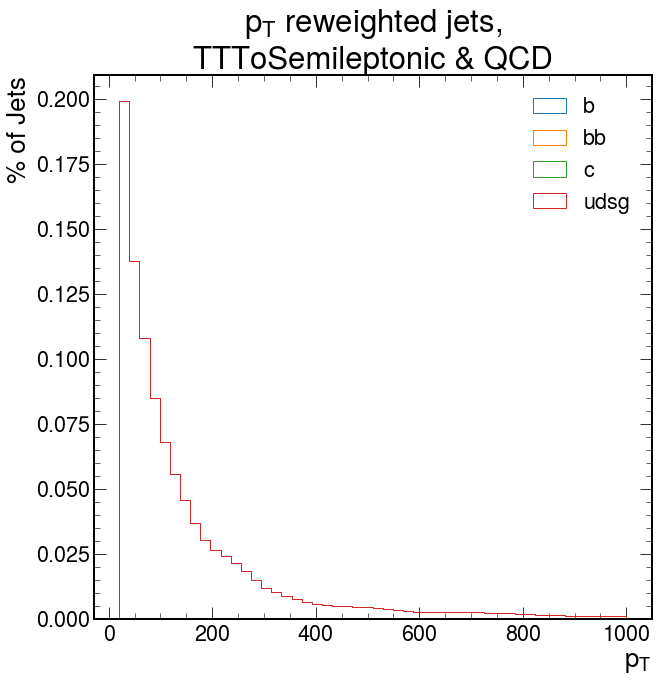

In [497]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist/sum(pt_marginalb_dist),histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist/sum(pt_marginalbb_dist),histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist/sum(pt_marginalc_dist),histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist/sum(pt_marginall_dist),histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'% of Jets')
plt.title(r'$p_T$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_relative_reweighted.png',dpi=400,transparent=False,facecolor='white')

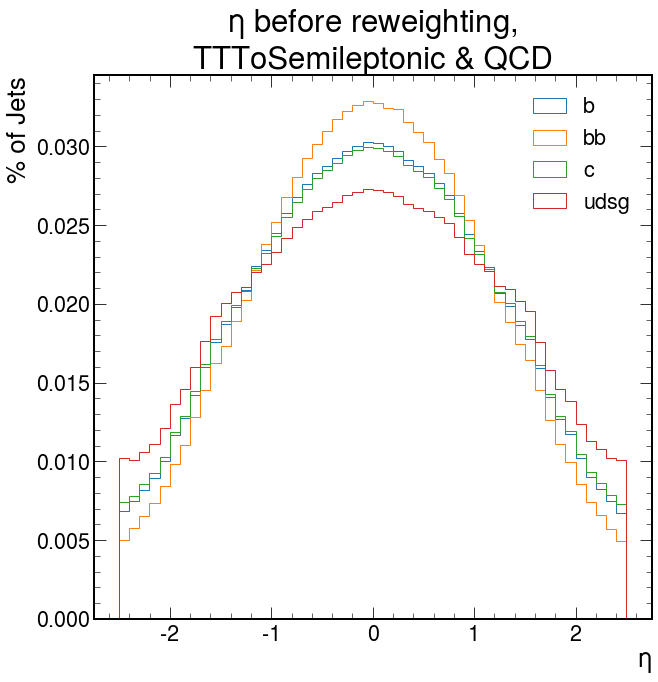

In [498]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_before/sum(eta_marginalb_dist_before),histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_before/sum(eta_marginalbb_dist_before),histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_before/sum(eta_marginalc_dist_before),histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_before/sum(eta_marginall_dist_before),histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'% of Jets')
plt.title(r'$\eta$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_relative_before.png',dpi=400,transparent=False,facecolor='white')

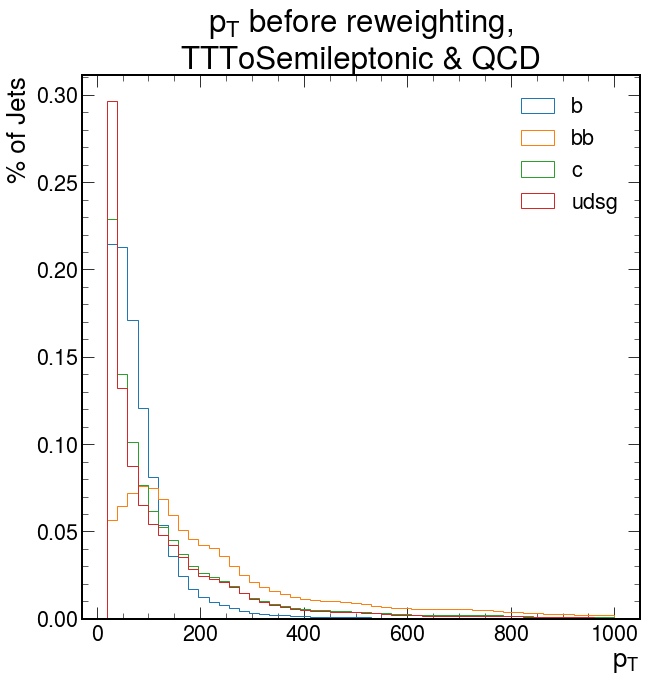

In [499]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_before/sum(pt_marginalb_dist_before),histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_before/sum(pt_marginalbb_dist_before),histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_before/sum(pt_marginalc_dist_before),histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_before/sum(pt_marginall_dist_before),histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'% of Jets')
plt.title(r'$p_T$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_relative_before.png',dpi=400,transparent=False,facecolor='white')

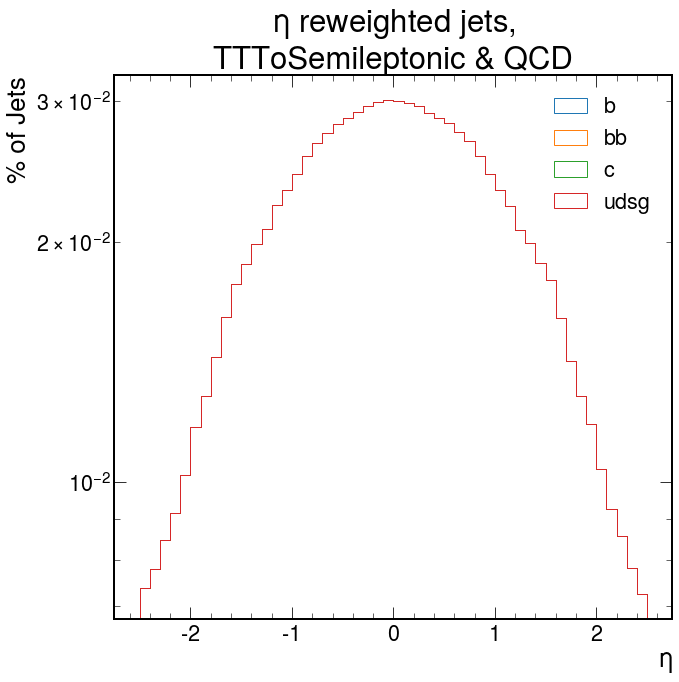

In [500]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist/sum(eta_marginalb_dist),log=True,histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist/sum(eta_marginalbb_dist),log=True,histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist/sum(eta_marginalc_dist),log=True,histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist/sum(eta_marginall_dist),log=True,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'% of Jets')
plt.title(r'$\eta$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_relative_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

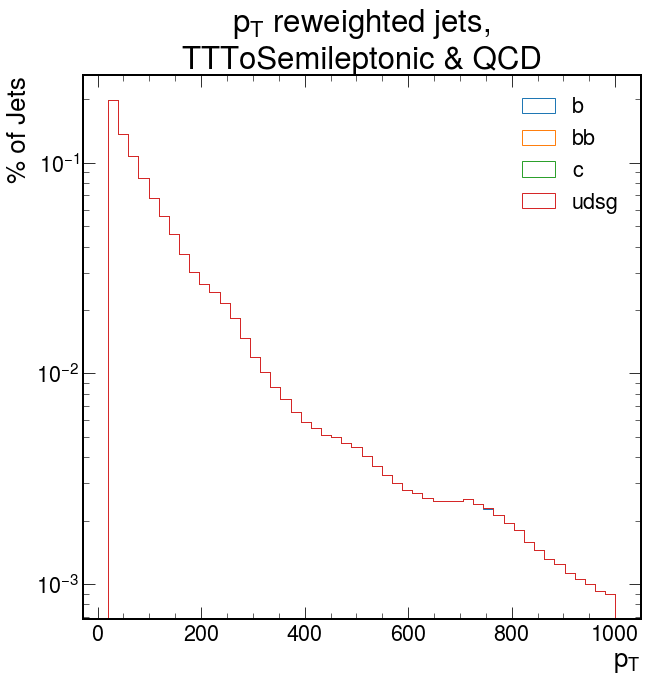

In [501]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist/sum(pt_marginalb_dist),log=True,histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist/sum(pt_marginalbb_dist),log=True,histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist/sum(pt_marginalc_dist),log=True,histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist/sum(pt_marginall_dist),log=True,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'% of Jets')
plt.title(r'$p_T$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_relative_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

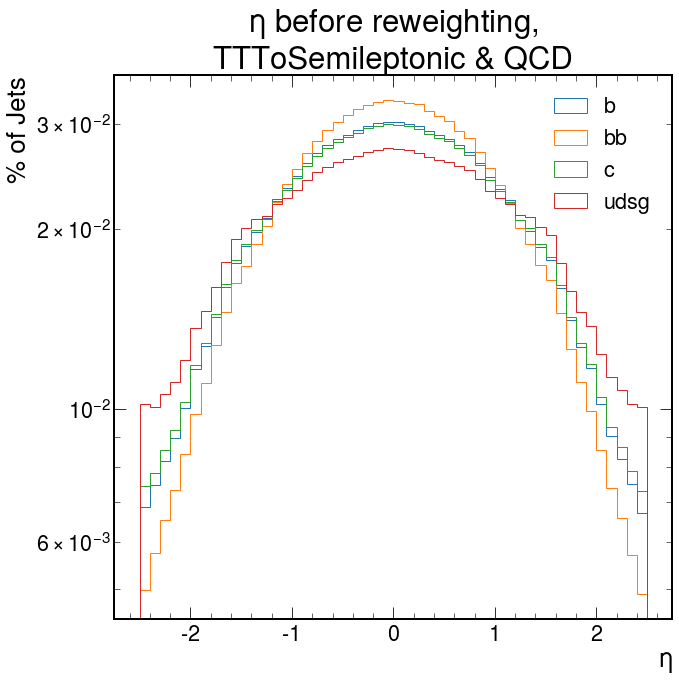

In [502]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_before/sum(eta_marginalb_dist_before),log=True,histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_before/sum(eta_marginalbb_dist_before),log=True,histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_before/sum(eta_marginalc_dist_before),log=True,histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_before/sum(eta_marginall_dist_before),log=True,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'% of Jets')
plt.title(r'$\eta$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_relative_before_log.png',dpi=400,transparent=False,facecolor='white')

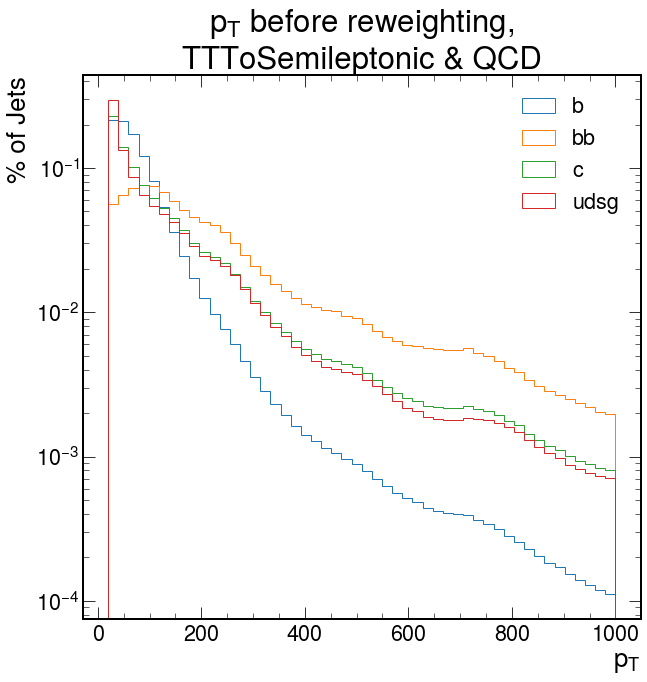

In [503]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_before/sum(pt_marginalb_dist_before),log=True,histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_before/sum(pt_marginalbb_dist_before),log=True,histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_before/sum(pt_marginalc_dist_before),log=True,histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_before/sum(pt_marginall_dist_before),log=True,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'% of Jets')
plt.title(r'$p_T$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_relative_before_log.png',dpi=400,transparent=False,facecolor='white')

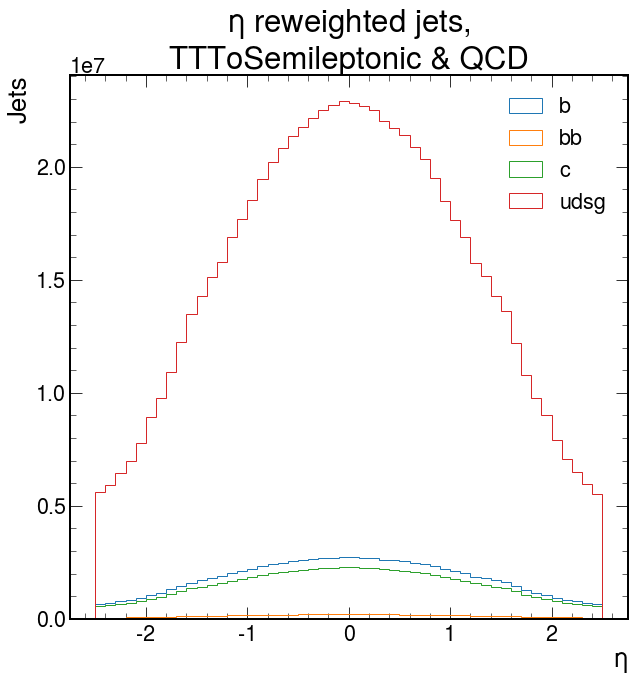

In [504]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist,histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist,histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist,histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_abs_reweighted.png',dpi=400,transparent=False,facecolor='white')

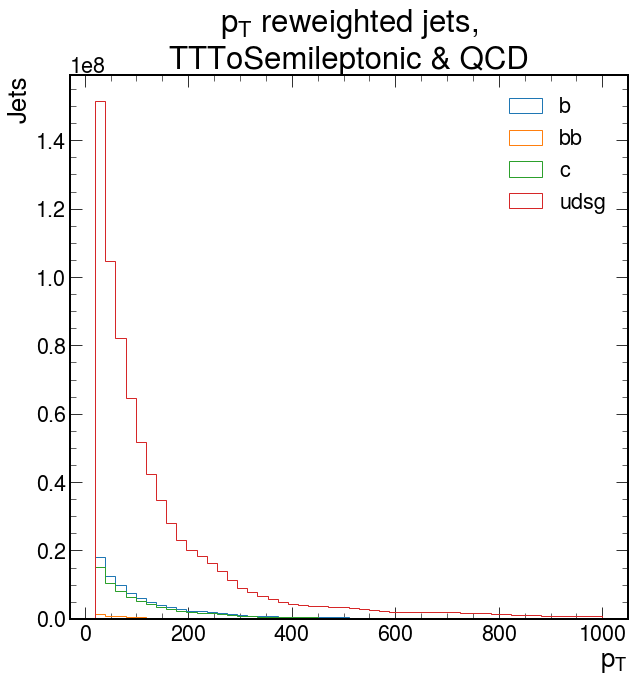

In [505]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist,histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist,histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist,histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_abs_reweighted.png',dpi=400,transparent=False,facecolor='white')

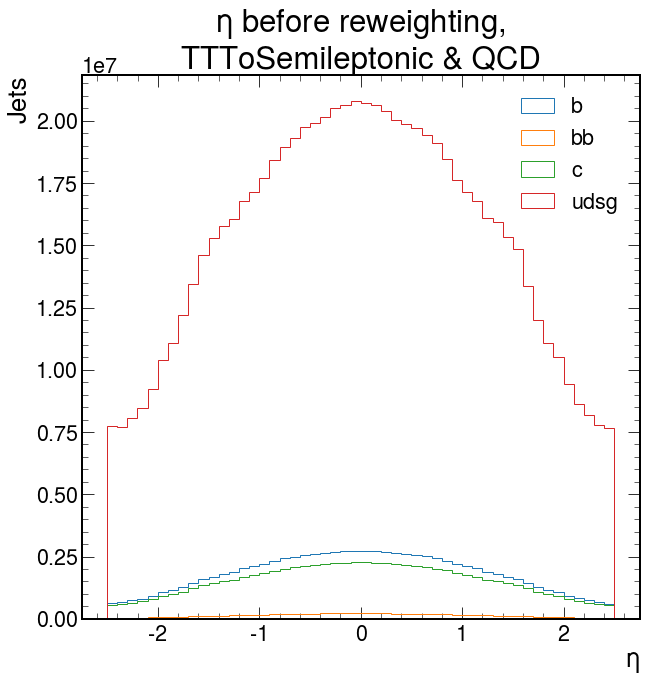

In [506]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_before,histtype='step',label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_before,histtype='step',label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_before,histtype='step',label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_before,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_abs_before.png',dpi=400,transparent=False,facecolor='white')

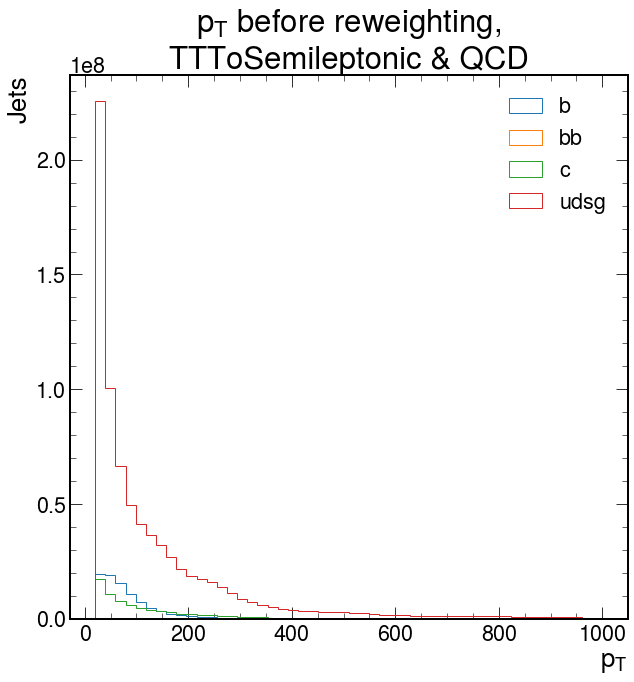

In [507]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_before,histtype='step',label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_before,histtype='step',label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_before,histtype='step',label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_before,histtype='step',label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_abs_before.png',dpi=400,transparent=False,facecolor='white')

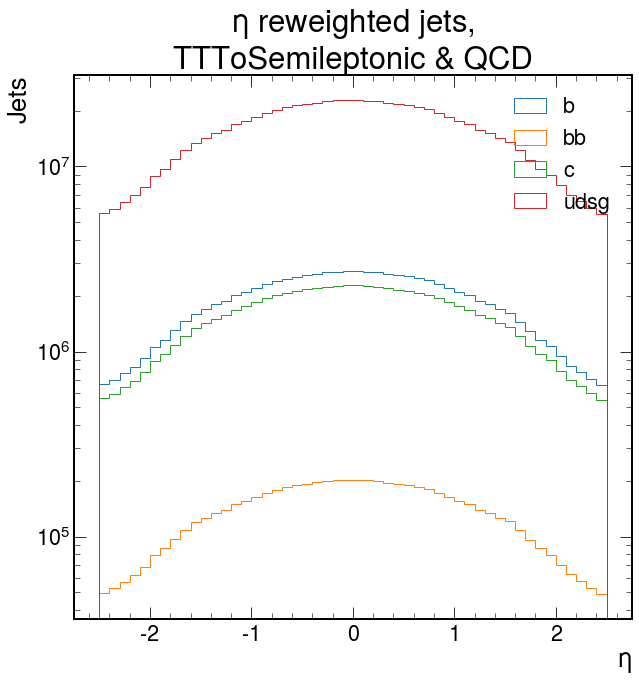

In [508]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_abs_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

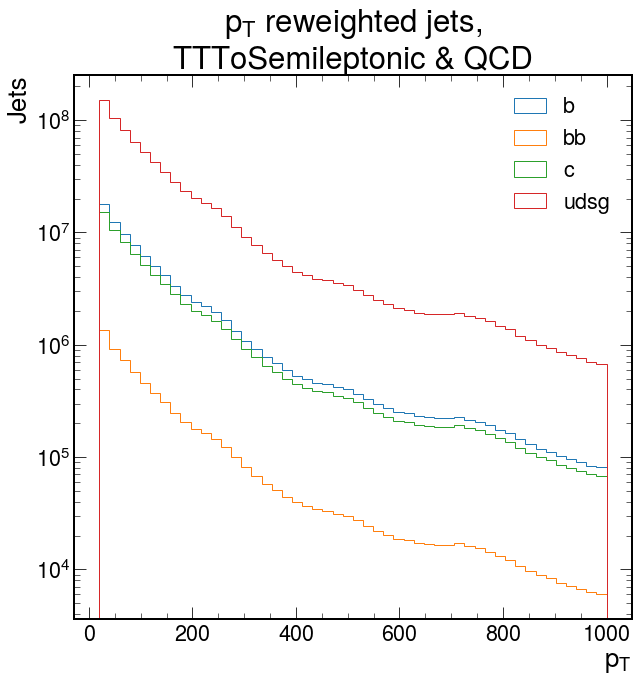

In [509]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ reweighted'+' jets,\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_abs_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

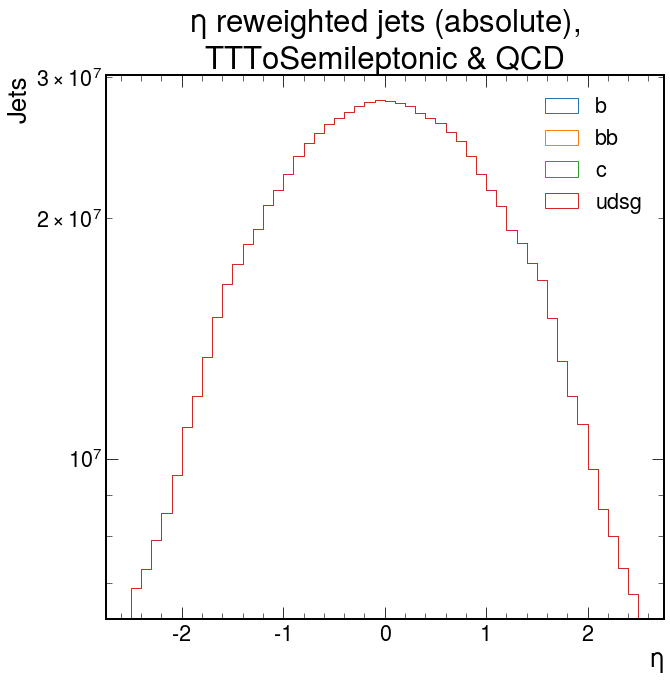

In [531]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_absolute,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_absolute,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_absolute,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_absolute,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ reweighted'+' jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_absolute_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

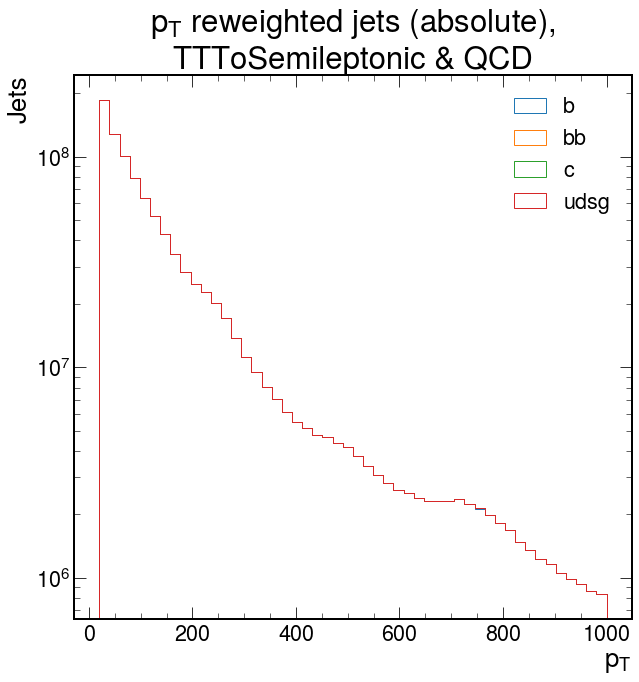

In [532]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_absolute,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_absolute,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_absolute,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_absolute,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ reweighted'+' jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_absolute_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

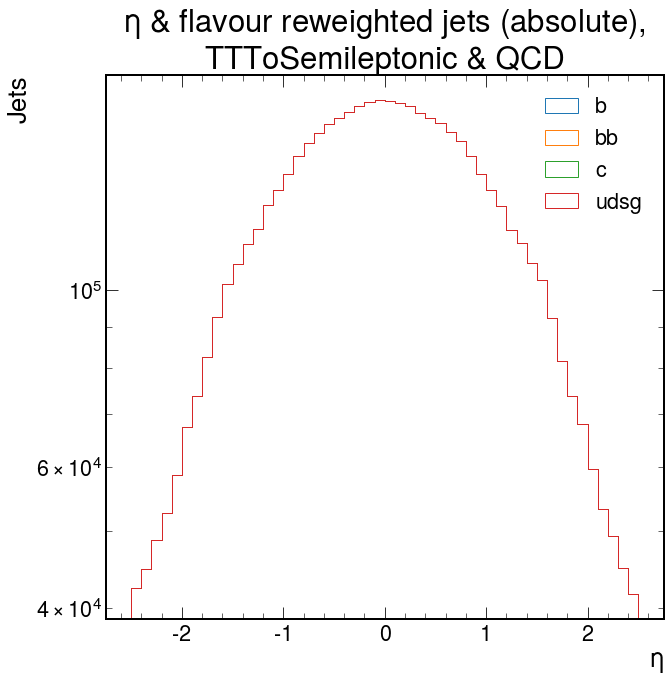

In [615]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_ptetaflav_reweighted,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_ptetaflav_reweighted,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_ptetaflav_reweighted,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_ptetaflav_reweighted,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ & flavour reweighted'+' jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_ptetaflav_reweighted_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

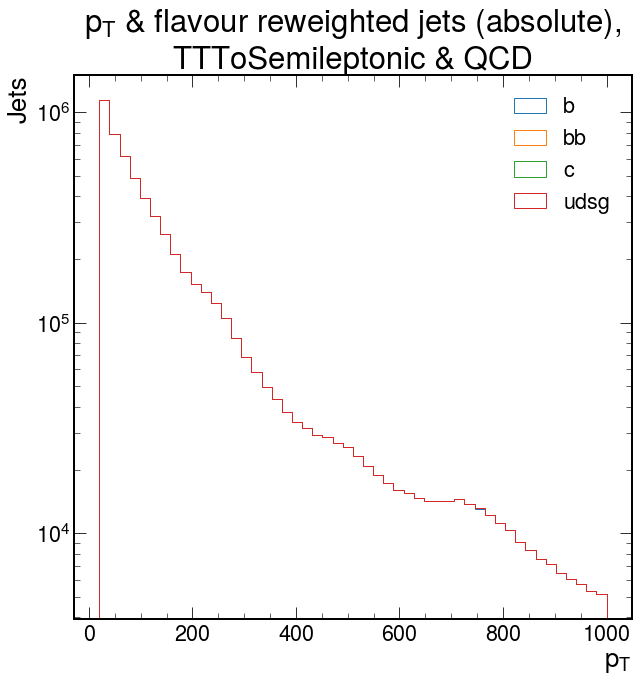

In [616]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_ptetaflav_reweighted,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_ptetaflav_reweighted,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_ptetaflav_reweighted,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_ptetaflav_reweighted,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ & flavour reweighted'+' jets (absolute),\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_ptetaflav_reweighted_reweighted_log.png',dpi=400,transparent=False,facecolor='white')

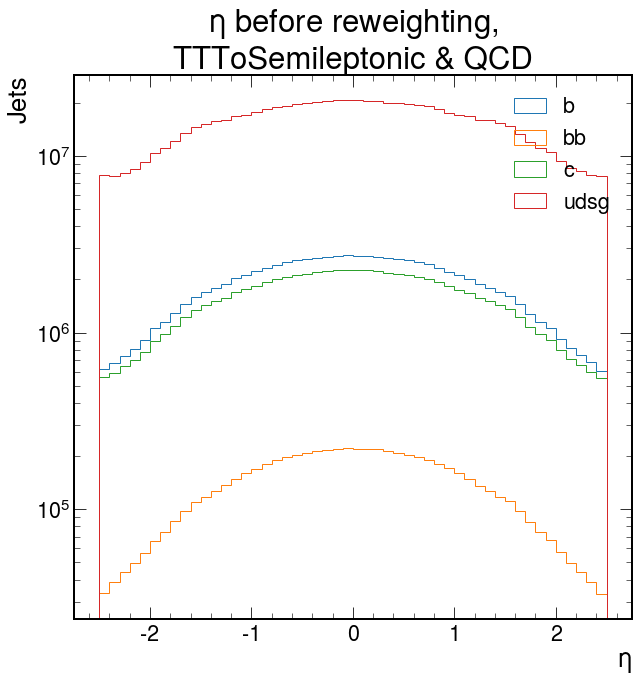

In [510]:
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalb_dist_before,histtype='step',log=True,label='b')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalbb_dist_before,histtype='step',log=True,label='bb')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginalc_dist_before,histtype='step',log=True,label='c')
plt.hist(eta_edges[:-1],bins=50,range=(-2.5,2.5),weights=eta_marginall_dist_before,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$\eta$')
plt.ylabel(r'Jets')
plt.title(r'$\eta$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/eta_abs_before_log.png',dpi=400,transparent=False,facecolor='white')

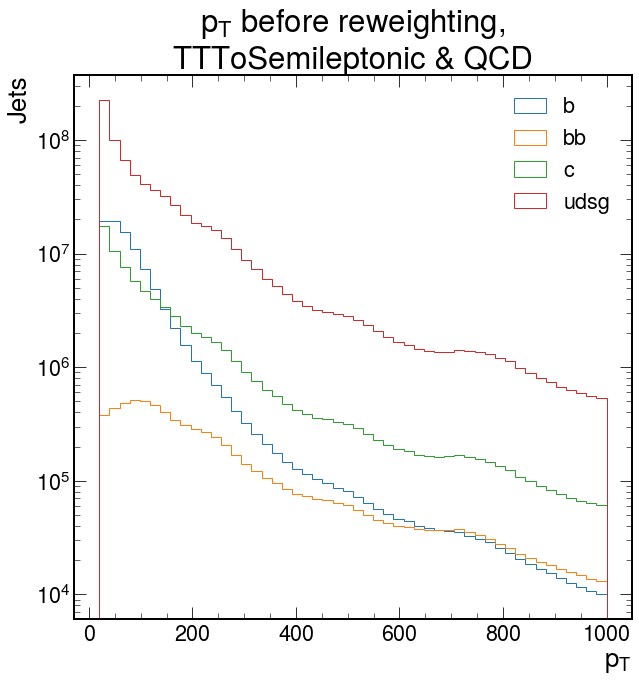

In [511]:
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalb_dist_before,histtype='step',log=True,label='b')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalbb_dist_before,histtype='step',log=True,label='bb')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginalc_dist_before,histtype='step',log=True,label='c')
plt.hist(pt_edges[:-1],bins=50,range=(20,1000),weights=pt_marginall_dist_before,histtype='step',log=True,label='udsg')
plt.legend()
plt.xlabel(r'$p_T$')
plt.ylabel(r'Jets')
plt.title(r'$p_T$ before reweighting,'+'\nTTToSemileptonic & QCD')
plt.savefig('preparations/pT_abs_before_log.png',dpi=400,transparent=False,facecolor='white')

## Creating a 'look-up-table' with bins for each jet

In [581]:
binnedstat = binned_statistic_2d(ttfile0[:,0],ttfile0[:,1],None,'count',bins=(50,50),range=((-2.5,2.5),(20,1000)),expand_binnumbers=True)
binnedstat

BinnedStatistic2dResult(statistic=array([[13175.,  6236.,  3760., ...,     0.,     0.,     0.],
       [12179.,  6534.,  4047., ...,     0.,     0.,     0.],
       [11801.,  7204.,  4522., ...,     0.,     0.,     0.],
       ...,
       [11905.,  7120.,  4451., ...,     0.,     0.,     0.],
       [12099.,  6824.,  3938., ...,     0.,     0.,     0.],
       [12768.,  6184.,  3690., ...,     0.,     0.,     0.]]), x_edge=array([-2.5, -2.4, -2.3, -2.2, -2.1, -2. , -1.9, -1.8, -1.7, -1.6, -1.5,
       -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4,
       -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,
        0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,
        1.9,  2. ,  2.1,  2.2,  2.3,  2.4,  2.5]), y_edge=array([  20. ,   39.6,   59.2,   78.8,   98.4,  118. ,  137.6,  157.2,
        176.8,  196.4,  216. ,  235.6,  255.2,  274.8,  294.4,  314. ,
        333.6,  353.2,  372.8,  392.4,  412. ,  431.6,  451.2,  470.8,
        49

some tests to check the memory consumption

In [590]:
binnedstat.binnumber[0].astype(np.ubyte).nbytes

3097095

In [591]:
binnedstat.binnumber[0].nbytes

24776760

In [592]:
_,_,_,binnedstat = binned_statistic_2d(ttfile0[:,0],ttfile0[:,1],None,'count',bins=(50,50),range=((-2.5,2.5),(20,1000)),expand_binnumbers=True)
binnedstat

array([[33,  3, 20, ..., 32, 31, 47],
       [ 4,  3,  2, ...,  1,  1,  1]])

In [595]:
len(binnedstat[1])

3097095

In [596]:
binnedstat.nbytes

49553520

In [601]:
binnedstat.astype(np.ubyte).nbytes

6194190

In [603]:
ttfile0[:,1]

array([82.1875  , 70.125   , 49.375   , ..., 29.25    , 27.296875,
       21.25    ])

In [606]:
defaults_per_variable

array([-3.24953516e+00,  1.49990000e+01,  1.99900000e+00,  9.02502441e-03,
        2.30323242e-01,  9.82611084e-03, -9.93566424e-04, -9.97688457e-04,
       -9.84294176e-04, -9.92437661e-04, -9.90716577e-04, -9.96261671e-04,
       -9.98326413e-04, -9.51183796e-04, -9.55773354e-04, -9.64118004e-04,
       -8.98135662e-04, -9.36819077e-04, -4.78225000e+00, -4.66506250e+00,
       -3.91506250e+00, -4.29787500e+00, -7.10073242e-02, -7.10073242e-02,
       -7.10073242e-02, -7.10073242e-02, -7.10073242e-02, -7.10073242e-02,
       -1.00000000e-03, -9.99480788e-04, -9.84852970e-04, -9.72313643e-04,
       -9.74146485e-04, -9.48143959e-04, -9.38428402e-04, -9.74042177e-04,
       -9.09102917e-04, -9.21083450e-04, -8.09503555e-04, -3.82495880e-04,
       -7.31540680e-04, -7.64310000e+01, -5.54178750e+01, -6.22472500e+01,
       -6.75872500e+01, -6.95335000e+01, -7.17491250e+01, -6.58385000e+01,
       -1.00100000e+00, -4.75383653e+02, -3.71798500e+02, -3.32328500e+02,
       -3.23907250e+02, -

In [11]:
NUM_DATASETS = 278

In [12]:
train_bins_file_paths = [f'/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_%d_with_default_{default}.npy' % k for k in range(0,min(NUM_DATASETS,229))] + [f'/hpcwork/um106329/may_21/scaled_TT/train_pt_eta_bins_%d_with_default_{default}.npy' % k for k in range(0,max(NUM_DATASETS-229,0))]
val_bins_file_paths = [f'/hpcwork/um106329/may_21/scaled_QCD/val_pt_eta_bins_%d_with_default_{default}.npy' % k for k in range(0,min(NUM_DATASETS,229))] + [f'/hpcwork/um106329/may_21/scaled_TT/val_pt_eta_bins_%d_with_default_{default}.npy' % k for k in range(0,max(NUM_DATASETS-229,0))]
# after the paths have been defined, no need to keep track of qcd and tt paths anymore

In [13]:
train_bins_file_paths

['/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_0_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_1_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_2_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_3_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_4_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_5_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_6_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_7_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_8_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_9_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_10_with_default_0.001.npy',
 '/hpcwork/um106329/may_21/scaled_QCD/train_pt_eta_bins_11_with_default_0.001.npy',
 '

In [20]:
concat2 = np.hstack([np.load(train_bins_path) for train_bins_path in train_bins_file_paths])

In [17]:
concat2

array([[48, 45, 24, ..., 27, 19, 13],
       [ 3,  7,  2, ...,  7,  2,  3]], dtype=uint8)

In [18]:
len(concat2[0])

4643782

In [40]:
first15qcdlen = sum([len(np.load(path)) for path in qcddataset_paths[:15]])

In [41]:
first15qcdlen

50728521

In [42]:
first5ttlen = sum([len(np.load(path)) for path in dataset_paths[:5]])
first5ttlen

15686790

In [55]:
minimal_fraction = (first15qcdlen+first5ttlen)/total_everything
minimal_fraction

0.07111435210723521

In [56]:
1/minimal_fraction

14.061859109565866

In [57]:
train_input_file_paths = [f'/hpcwork/um106329/may_21/scaled_QCD/train_inputs_%d_with_default_{default}.pt' % k for k in range(0,15)] + [f'/hpcwork/um106329/may_21/scaled_TT/train_inputs_%d_with_default_{default}.pt' % k for k in range(0,5)]
train_target_file_paths = [f'/hpcwork/um106329/may_21/scaled_QCD/train_targets_%d_with_default_{default}.pt' % k for k in range(0,15)] + [f'/hpcwork/um106329/may_21/scaled_TT/train_targets_%d_with_default_{default}.pt' % k for k in range(0,5)]
train_sample_weights_file_paths = [f'/hpcwork/um106329/may_21/scaled_QCD/train_sample_weights_%d_with_default_{default}.npy' % k for k in range(0,15)] + [f'/hpcwork/um106329/may_21/scaled_TT/train_sample_weights_%d_with_default_{default}.npy' % k for k in range(0,5)]

In [87]:
catinputs = torch.cat((torch.load(train_input_file_paths[0]), torch.from_numpy(np.load(train_sample_weights_file_paths[0])).to(torch.float16).unsqueeze(1)), dim=1)
catinputs

tensor([[ 1.7119e+00, -2.3450e-01, -3.0444e-01,  ..., -5.2686e-01,
         -5.2686e-01,  1.7881e-07],
        [ 1.5049e+00,  9.9756e-01, -1.9373e-01,  ...,  2.2246e+00,
          2.2246e+00,  1.1921e-07],
        [-1.1676e-01, -6.7188e-01, -3.0444e-01,  ..., -5.2686e-01,
         -5.2686e-01,  1.7881e-07],
        ...,
        [ 7.2021e-01, -1.0957e+00, -1.8359e-01,  ...,  5.7373e-01,
          5.7373e-01,  1.1921e-07],
        [ 4.2896e-01,  1.1846e+00, -3.0444e-01,  ..., -5.2686e-01,
         -5.2686e-01,  1.7881e-07],
        [-1.2666e+00,  1.0625e+00, -3.0444e-01,  ..., -5.2686e-01,
         -5.2686e-01,  1.7881e-07]], dtype=torch.float16)

In [83]:
weightstensor = torch.from_numpy(np.load(train_sample_weights_file_paths[0])).to(torch.float16).unsqueeze(1)
weightstensor

tensor([[1.7881e-07],
        [1.1921e-07],
        [1.7881e-07],
        ...,
        [1.1921e-07],
        [1.7881e-07],
        [1.7881e-07]], dtype=torch.float16)

In [70]:
tensor = torch.load(train_input_file_paths[0])
tensor

tensor([[ 1.7119, -0.2345, -0.3044,  ..., -0.2771, -0.5269, -0.5269],
        [ 1.5049,  0.9976, -0.1937,  ...,  0.5229,  2.2246,  2.2246],
        [-0.1168, -0.6719, -0.3044,  ...,  0.9233, -0.5269, -0.5269],
        ...,
        [ 0.7202, -1.0957, -0.1836,  ..., -1.0771,  0.5737,  0.5737],
        [ 0.4290,  1.1846, -0.3044,  ..., -1.4775, -0.5269, -0.5269],
        [-1.2666,  1.0625, -0.3044,  ...,  0.9233, -0.5269, -0.5269]],
       dtype=torch.float16)

In [71]:
tensor.dim()

2

In [79]:
weightstensor.dim()

1

In [85]:
tensor.shape

torch.Size([2343015, 67])

In [84]:
weightstensor.shape

torch.Size([2343015, 1])

In [88]:
catinputs.dim()

2

In [89]:
catinputs.shape

torch.Size([2343015, 68])

## Another approach:
#### Flat distributions in $p_T$ and $\eta$

In [25]:
b_hist_mean = both_b_histo.flatten().mean()
b_hist_mean

36203.5656

In [26]:
bb_hist_mean = both_bb_histo.flatten().mean()
bb_hist_mean

2694.2096

In [27]:
c_hist_mean = both_c_histo.flatten().mean()
c_hist_mean

30310.9432

In [28]:
l_hist_mean = both_l_histo.flatten().mean()
l_hist_mean

304360.38

In [37]:
weights_flat_b = factor_b * b_hist_mean/both_b_histo
weights_flat_b

<ipython-input-37-fa8168c35b80>:1: RuntimeWarning: divide by zero encountered in true_divide
  weights_flat_b = factor_b * b_hist_mean/both_b_histo


array([[1.97759196e+00, 2.55060390e+00, 3.40158710e+00, ...,
        3.73569098e+05,            inf,            inf],
       [1.90539123e+00, 2.33536151e+00, 3.12314797e+00, ...,
        3.73569098e+05,            inf,            inf],
       [1.89444348e+00, 2.17281028e+00, 2.81870868e+00, ...,
                   inf,            inf, 3.73569098e+05],
       ...,
       [1.86658555e+00, 2.13540050e+00, 2.90681320e+00, ...,
                   inf, 3.73569098e+05,            inf],
       [1.93318722e+00, 2.28435126e+00, 3.18992647e+00, ...,
        3.73569098e+05,            inf,            inf],
       [2.09533614e+00, 2.53095595e+00, 3.54295427e+00, ...,
                   inf,            inf,            inf]])

In [38]:
weights_flat_bb = factor_bb * bb_hist_mean/both_bb_histo
weights_flat_bb

<ipython-input-38-18276dc3d800>:1: RuntimeWarning: divide by zero encountered in true_divide
  weights_flat_bb = factor_bb * bb_hist_mean/both_bb_histo


array([[9.52253628e+01, 1.01101244e+02, 9.89587016e+01, ...,
                   inf,            inf,            inf],
       [9.14713757e+01, 9.36263405e+01, 8.61949927e+01, ...,
                   inf,            inf,            inf],
       [9.29276364e+01, 8.82724713e+01, 8.18153961e+01, ...,
        3.73569098e+05, 1.24523033e+05, 1.24523033e+05],
       ...,
       [9.04744729e+01, 8.58779537e+01, 8.68361456e+01, ...,
        1.24523033e+05, 1.86784549e+05,            inf],
       [9.24904923e+01, 8.93492223e+01, 9.20120932e+01, ...,
                   inf,            inf,            inf],
       [9.97514281e+01, 9.74612832e+01, 1.02319665e+02, ...,
        3.73569098e+05,            inf,            inf]])

In [35]:
weights_flat_c = factor_c * c_hist_mean/both_c_histo
weights_flat_c

<ipython-input-35-222501cf2a45>:1: RuntimeWarning: divide by zero encountered in true_divide
  weights_flat_c = factor_c * c_hist_mean/both_c_histo


array([[1.98564381e+00, 4.00902640e+00, 5.81294792e+00, ...,
        3.73569098e+05, 1.86784549e+05,            inf],
       [2.03528869e+00, 3.83116358e+00, 5.47353990e+00, ...,
        1.86784549e+05, 1.24523033e+05, 1.24523033e+05],
       [2.03445738e+00, 3.56639425e+00, 5.03462397e+00, ...,
        3.39608271e+04, 2.87360845e+04, 3.73569098e+04],
       ...,
       [2.00474986e+00, 3.50660451e+00, 5.15445462e+00, ...,
        2.87360845e+04, 2.66835070e+04, 5.33670141e+04],
       [2.04451175e+00, 3.70277333e+00, 5.57274705e+00, ...,
        9.33922746e+04, 1.24523033e+05,            inf],
       [2.07608744e+00, 3.96015242e+00, 6.03367733e+00, ...,
                   inf,            inf, 3.73569098e+05]])

In [36]:
weights_flat_l = factor_l * l_hist_mean/both_l_histo
weights_flat_l

array([[1.20416664e-01, 3.56171883e-01, 5.43840739e-01, ...,
        1.77890047e+04, 2.87360845e+04, 4.66961373e+04],
       [1.37839576e-01, 3.45950808e-01, 5.16136255e-01, ...,
        5.41404490e+03, 7.78268955e+03, 7.78268955e+03],
       [1.42808631e-01, 3.31010133e-01, 4.89479896e-01, ...,
        1.84935197e+03, 1.97655608e+03, 2.42577337e+03],
       ...,
       [1.38618964e-01, 3.25333807e-01, 5.04932963e-01, ...,
        1.81344223e+03, 2.34949118e+03, 2.23694071e+03],
       [1.36119607e-01, 3.35175424e-01, 5.31588592e-01, ...,
        6.12408358e+03, 6.44084652e+03, 1.00964621e+04],
       [1.23630830e-01, 3.49335355e-01, 5.63886396e-01, ...,
        1.06734028e+04, 2.49046066e+04, 6.22615164e+04]])

In [80]:
np.save('weights_flat_b.npy',weights_flat_b)
np.save('weights_flat_bb.npy',weights_flat_bb)
np.save('weights_flat_c.npy',weights_flat_c)
np.save('weights_flat_l.npy',weights_flat_l)

In [61]:
flat_reweighted_b = both_b_histo * weights_flat_b
flat_reweighted_b

<ipython-input-61-b01465302997>:1: RuntimeWarning: invalid value encountered in multiply
  flat_reweighted_b = both_b_histo * weights_flat_b


array([[373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan, 373569.0984],
       ...,
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
        373569.0984,         nan],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan,         nan]])

In [64]:
flat_reweighted_bb = both_bb_histo * weights_flat_bb
flat_reweighted_bb

<ipython-input-64-a8e97800b1f1>:1: RuntimeWarning: invalid value encountered in multiply
  flat_reweighted_bb = both_bb_histo * weights_flat_bb


array([[373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       ...,
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984,         nan],
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan,         nan],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
                nan,         nan]])

In [63]:
flat_reweighted_c = both_c_histo * weights_flat_c
flat_reweighted_c

<ipython-input-63-0cc1427b69d3>:1: RuntimeWarning: invalid value encountered in multiply
  flat_reweighted_c = both_c_histo * weights_flat_c


array([[373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984,         nan],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       ...,
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984,         nan],
       [373569.0984, 373569.0984, 373569.0984, ...,         nan,
                nan, 373569.0984]])

In [62]:
flat_reweighted_l = both_l_histo * weights_flat_l
flat_reweighted_l

array([[373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       ...,
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984],
       [373569.0984, 373569.0984, 373569.0984, ..., 373569.0984,
        373569.0984, 373569.0984]])

In [81]:
np.save('flat_reweighted_b.npy',flat_reweighted_b)
np.save('flat_reweighted_bb.npy',flat_reweighted_bb)
np.save('flat_reweighted_c.npy',flat_reweighted_c)
np.save('flat_reweighted_l.npy',flat_reweighted_l)

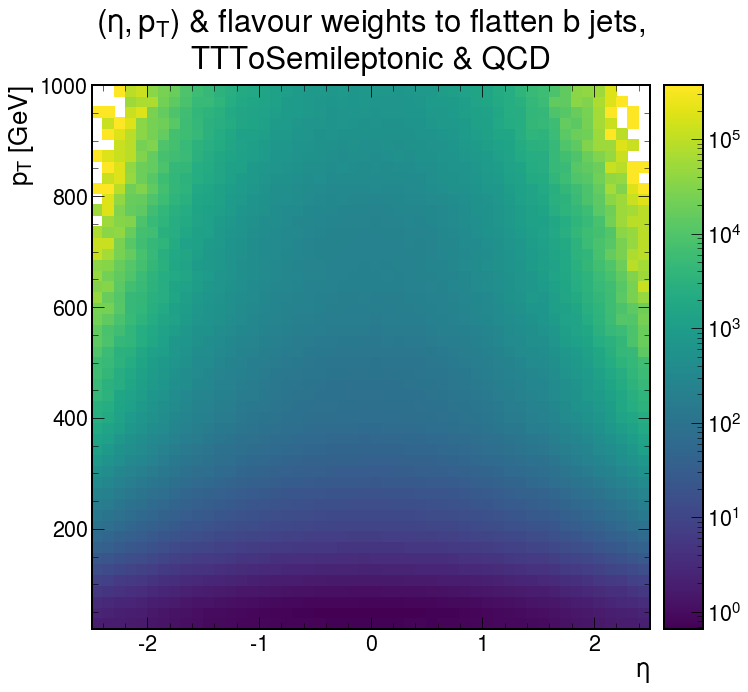

In [71]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(weights_flat_b, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' to flatten b jets,\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/b_flat_weights.png',dpi=400,transparent=False,facecolor='white')

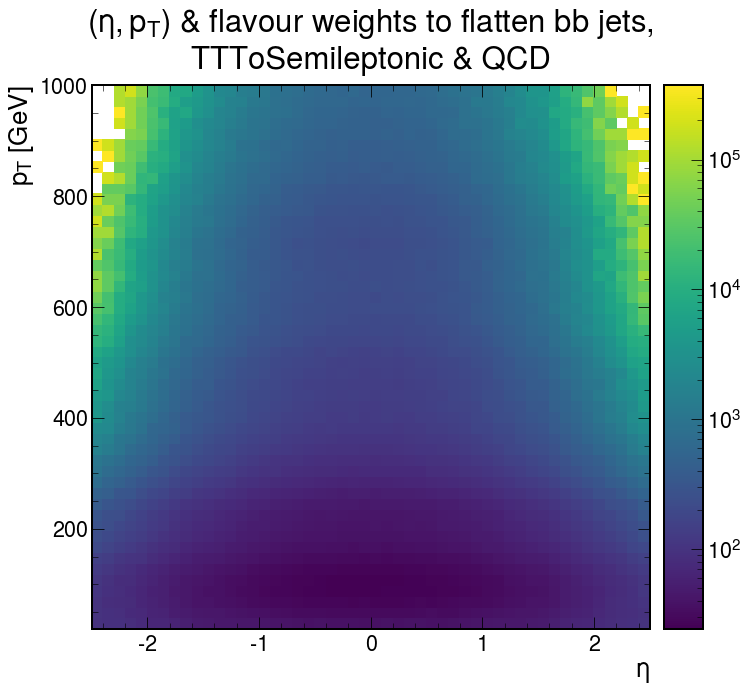

In [72]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(weights_flat_bb, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' to flatten bb jets,\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/bb_flat_weights.png',dpi=400,transparent=False,facecolor='white')

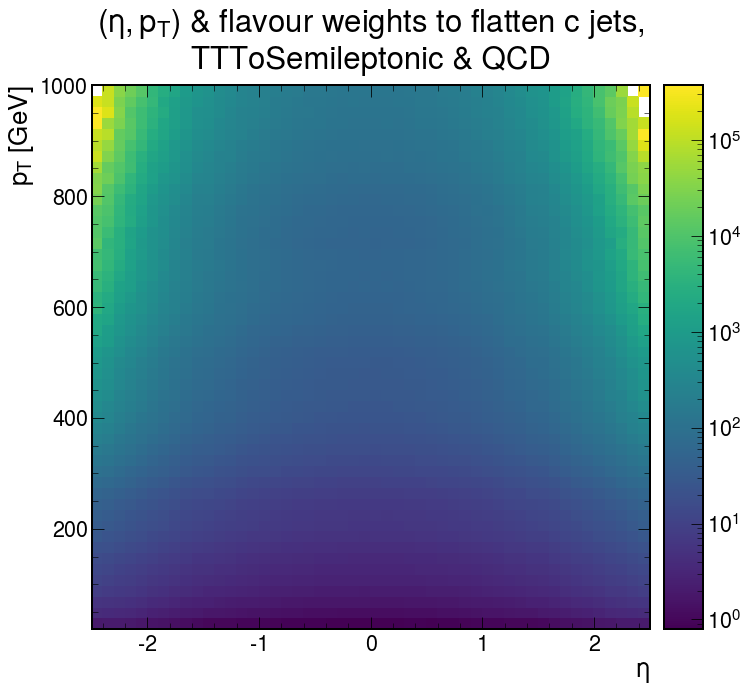

In [73]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(weights_flat_c, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' to flatten c jets,\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/c_flat_weights.png',dpi=400,transparent=False,facecolor='white')

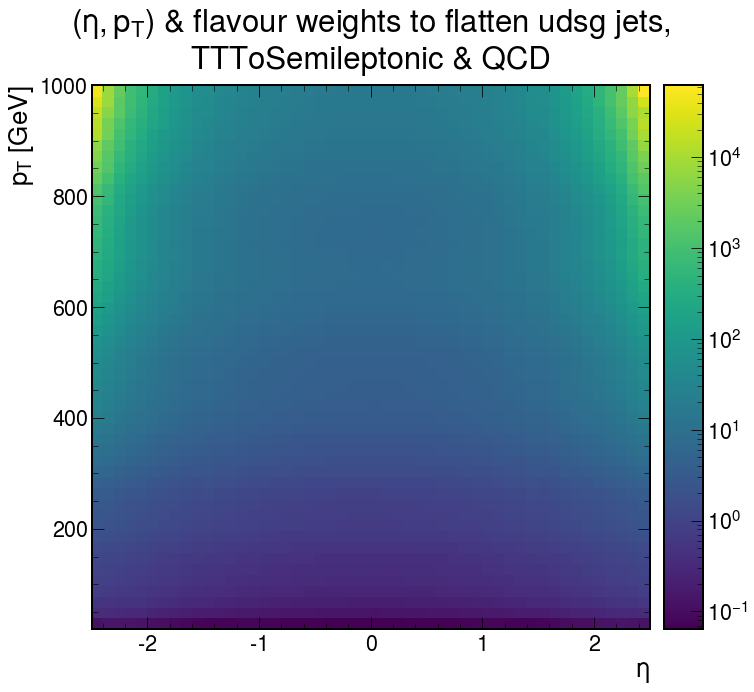

In [74]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(weights_flat_l, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'$(\eta, p_T)$ & flavour weights'+' to flatten udsg jets,\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/l_flat_weights.png',dpi=400,transparent=False,facecolor='white')

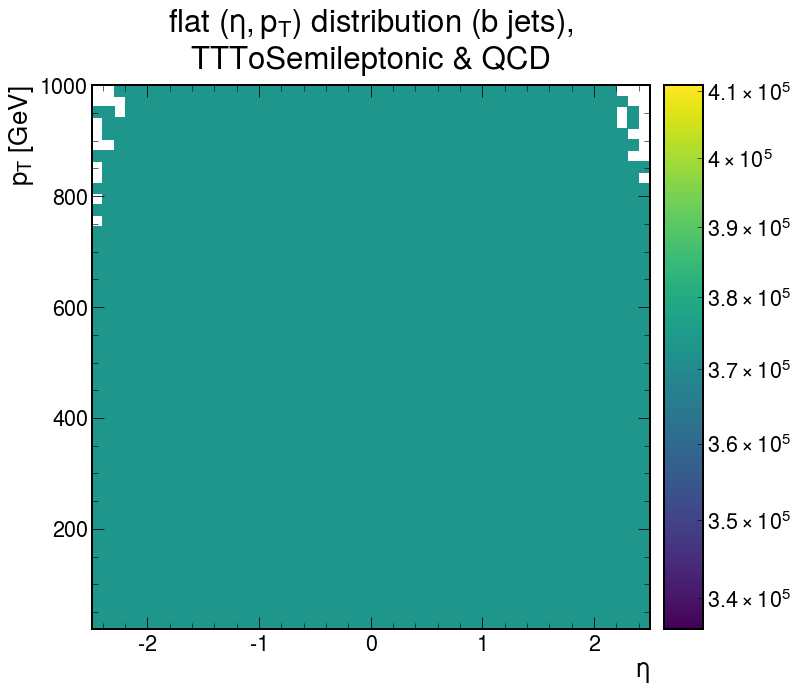

In [75]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(flat_reweighted_b, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'flat $(\eta, p_T)$ distribution'+' (b jets),\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/flat_reweighted_b.png',dpi=400,transparent=False,facecolor='white')

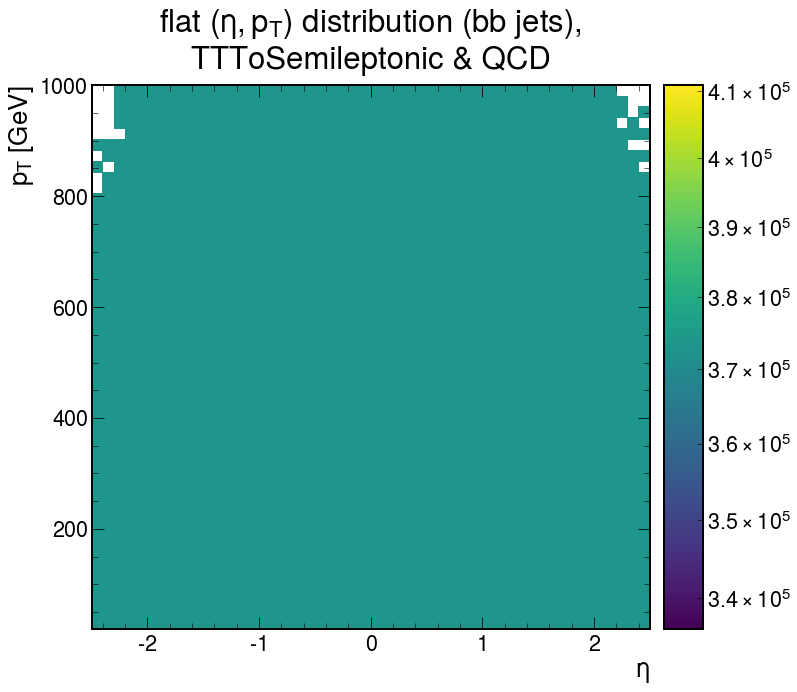

In [76]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(flat_reweighted_bb, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'flat $(\eta, p_T)$ distribution'+' (bb jets),\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/flat_reweighted_bb.png',dpi=400,transparent=False,facecolor='white')

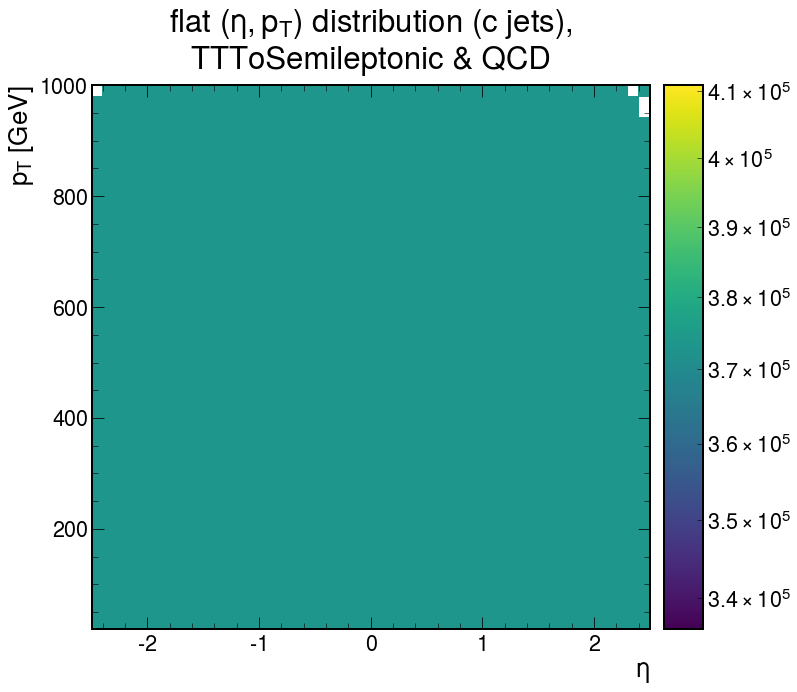

In [77]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(flat_reweighted_c, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'flat $(\eta, p_T)$ distribution'+' (c jets),\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/flat_reweighted_c.png',dpi=400,transparent=False,facecolor='white')

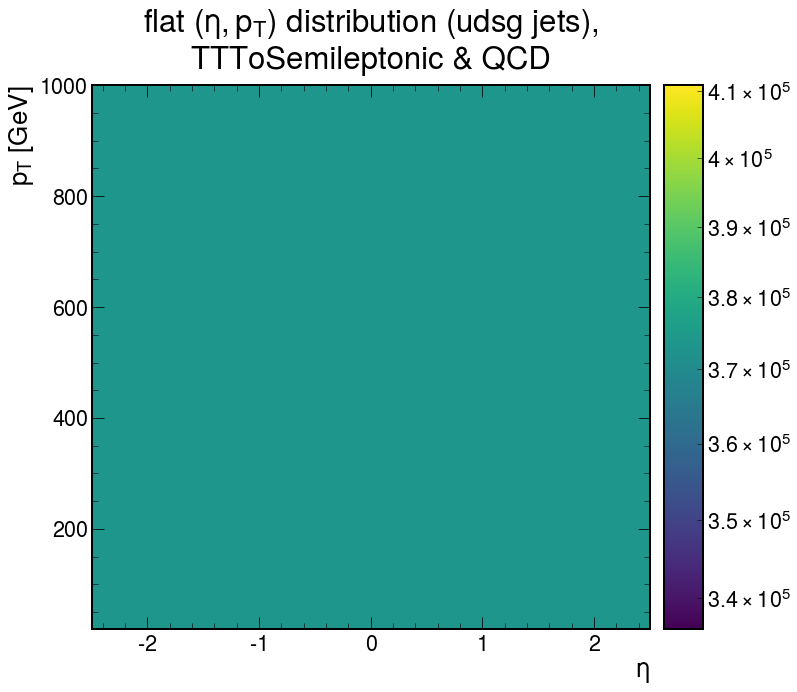

In [78]:
fig, ax = plt.subplots()
ax = hep.hist2dplot(flat_reweighted_l, eta_edges, pt_edges,norm=LogNorm())
plt.xlabel(r'$\eta$')
plt.ylabel(r'$p_T$ [GeV]')
plt.title(r'flat $(\eta, p_T)$ distribution'+' (udsg jets),\nTTToSemileptonic & QCD',y=1.02)
fig.savefig('preparations/flat_reweighted_l.png',dpi=400,transparent=False,facecolor='white')